<a href="https://colab.research.google.com/github/dev0419/Cisco-Hackathon/blob/main/final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

CISCO HACKATHON

Cleaning dataset

In [104]:
# importing necessary libraries
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer
from sklearn.model_selection import cross_val_score

In [105]:
# exporting data
data = pd.read_csv('data.csv')
data.rename(columns={'FY23Q4 Demand':'FY23 Q4'},inplace=True)
data.head()

,Cost Rank,Product Name,Product Life Cycle,FY20 Q4,FY21 Q1,FY21 Q2,FY21 Q3,FY21 Q4,FY22 Q1,FY22 Q2,FY22 Q3,FY22 Q4,FY23 Q1,FY23 Q2,FY23 Q3,FY23 Q4,FYQ23 Q4 Marketing,FY23 Q4 Stats/ML
0,1,ROUTER 1,Sustaining,NaN,NaN,NaN,906.0,941.0,663.0,769.0,3565.0,1020,1670,38,2141,1716,"1,716","1,948"
1,2,TRANSCIEVER,Sustaining,87173.0,102849.0,126375.0,128629.0,179125.0,138750.0,208760.0,116126.0,150803,82163,82408,67132,85000,"141,285","97,995"
2,3,SWITCH 1,Sustaining,NaN,NaN,NaN,3651.0,10409.0,10575.0,17934.0,15104.0,15525,6938,9595,9231,12000,"11,820","11,184"
3,4,ACCESS POINT 1,Sustaining,NaN,NaN,NaN,NaN,NaN,NaN,9576.0,46029.0,109452,54955,60478,62708,62771,"79,113","65,310"
4,5,ACCESS POINT 2,Sustaining,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26769,33670,74853,80944,76192,"113,704","93,200"


In [106]:
#removing unnecessary columns
data = data.drop(['Cost Rank','Product Life Cycle','FYQ23 Q4 Marketing','FY23 Q4 Stats/ML'], axis = 1)
data.set_index('Product Name', inplace = True)
data.head()

,FY20 Q4,FY21 Q1,FY21 Q2,FY21 Q3,FY21 Q4,FY22 Q1,FY22 Q2,FY22 Q3,FY22 Q4,FY23 Q1,FY23 Q2,FY23 Q3,FY23 Q4
Product Name,,,,,,,,,,,,,
ROUTER 1,NaN,NaN,NaN,906.0,941.0,663.0,769.0,3565.0,1020,1670,38,2141,1716
TRANSCIEVER,87173.0,102849.0,126375.0,128629.0,179125.0,138750.0,208760.0,116126.0,150803,82163,82408,67132,85000
SWITCH 1,NaN,NaN,NaN,3651.0,10409.0,10575.0,17934.0,15104.0,15525,6938,9595,9231,12000
ACCESS POINT 1,NaN,NaN,NaN,NaN,NaN,NaN,9576.0,46029.0,109452,54955,60478,62708,62771
ACCESS POINT 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26769,33670,74853,80944,76192


In [107]:
transposed = data.transpose()
transposed

Product Name,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,SWITCH 5,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
FY20 Q4,NaN,87173.0,NaN,NaN,NaN,13432.0,28585.0,115709.0,NaN,4571.0,NaN,65048.0,NaN,6073.0,1208.0,4.0,6187.0,NaN,NaN,28279.0
FY21 Q1,NaN,102849.0,NaN,NaN,NaN,12463.0,19686.0,98337.0,NaN,4100.0,NaN,67810.0,NaN,5459.0,963.0,-4.0,5301.0,NaN,NaN,22704.0
FY21 Q2,NaN,126375.0,NaN,NaN,NaN,13452.0,44724.0,147681.0,NaN,4830.0,NaN,90928.0,NaN,6736.0,1698.0,36.0,7172.0,NaN,NaN,24098.0
FY21 Q3,906.0,128629.0,3651.0,NaN,NaN,14581.0,37781.0,185327.0,177.0,5472.0,NaN,148547.0,NaN,12213.0,1833.0,305.0,7582.0,NaN,NaN,31461.0
FY21 Q4,941.0,179125.0,10409.0,NaN,NaN,15831.0,31905.0,194170.0,270.0,7391.0,NaN,228945.0,NaN,13883.0,2423.0,1093.0,10964.0,NaN,NaN,47009.0
FY22 Q1,663.0,138750.0,10575.0,NaN,NaN,13864.0,37888.0,220386.0,850.0,7894.0,NaN,204184.0,NaN,27045.0,2602.0,2360.0,11501.0,NaN,NaN,35145.0
FY22 Q2,769.0,208760.0,17934.0,9576.0,NaN,15012.0,32689.0,204604.0,2717.0,7101.0,222.0,245453.0,15.0,15162.0,2341.0,4317.0,14980.0,NaN,NaN,45978.0
FY22 Q3,3565.0,116126.0,15104.0,46029.0,NaN,11349.0,30442.0,194538.0,3833.0,6943.0,1549.0,245803.0,108.0,13855.0,1830.0,4343.0,9158.0,NaN,NaN,34518.0
FY22 Q4,1020.0,150803.0,15525.0,109452.0,26769.0,10422.0,27028.0,185160.0,4279.0,6126.0,4619.0,136283.0,1972.0,12351.0,1567.0,4094.0,11601.0,13260.0,1227.0,40605.0
FY23 Q1,1670.0,82163.0,6938.0,54955.0,33670.0,8726.0,21246.0,147284.0,6089.0,4616.0,4764.0,76020.0,2427.0,8933.0,1210.0,2756.0,3788.0,21667.0,24186.0,26925.0


In [108]:
transposed.index

Index(['FY20 Q4', 'FY21 Q1', 'FY21 Q2', 'FY21 Q3', 'FY21 Q4', 'FY22 Q1',
       'FY22 Q2', 'FY22 Q3', 'FY22 Q4', 'FY23 Q1', 'FY23 Q2', 'FY23 Q3',
       'FY23 Q4'],
      dtype='object')

In [109]:
transposed = transposed.reset_index().rename(columns={'index': 'Quarters'})


In [110]:
transposed.index

RangeIndex(start=0, stop=13, step=1)

In [111]:
transposed.columns

Index(['Quarters', 'ROUTER 1', 'TRANSCIEVER', 'SWITCH 1', 'ACCESS POINT 1',
       'ACCESS POINT 2', 'SWITCH 2', 'SWITCH 3', 'POWER SUPPLY 1', 'SWITCH 4',
       'SWITCH 5', 'SWITCH 6', 'ACCESS POINT 3', 'SUPERVISOR ENGINE',
       'SWITCH 7', 'WIRELESS CONTROLLER', 'SWITCH 8', 'SWITCH 9',
       'ACCESS POINT 4', 'SWITCH 10', 'POWER SUPPLY 2'],
      dtype='object', name='Product Name')

In [112]:
transposed

Product Name,Quarters,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,FY20 Q4,NaN,87173.0,NaN,NaN,NaN,13432.0,28585.0,115709.0,NaN,...,NaN,65048.0,NaN,6073.0,1208.0,4.0,6187.0,NaN,NaN,28279.0
1,FY21 Q1,NaN,102849.0,NaN,NaN,NaN,12463.0,19686.0,98337.0,NaN,...,NaN,67810.0,NaN,5459.0,963.0,-4.0,5301.0,NaN,NaN,22704.0
2,FY21 Q2,NaN,126375.0,NaN,NaN,NaN,13452.0,44724.0,147681.0,NaN,...,NaN,90928.0,NaN,6736.0,1698.0,36.0,7172.0,NaN,NaN,24098.0
3,FY21 Q3,906.0,128629.0,3651.0,NaN,NaN,14581.0,37781.0,185327.0,177.0,...,NaN,148547.0,NaN,12213.0,1833.0,305.0,7582.0,NaN,NaN,31461.0
4,FY21 Q4,941.0,179125.0,10409.0,NaN,NaN,15831.0,31905.0,194170.0,270.0,...,NaN,228945.0,NaN,13883.0,2423.0,1093.0,10964.0,NaN,NaN,47009.0
5,FY22 Q1,663.0,138750.0,10575.0,NaN,NaN,13864.0,37888.0,220386.0,850.0,...,NaN,204184.0,NaN,27045.0,2602.0,2360.0,11501.0,NaN,NaN,35145.0
6,FY22 Q2,769.0,208760.0,17934.0,9576.0,NaN,15012.0,32689.0,204604.0,2717.0,...,222.0,245453.0,15.0,15162.0,2341.0,4317.0,14980.0,NaN,NaN,45978.0
7,FY22 Q3,3565.0,116126.0,15104.0,46029.0,NaN,11349.0,30442.0,194538.0,3833.0,...,1549.0,245803.0,108.0,13855.0,1830.0,4343.0,9158.0,NaN,NaN,34518.0
8,FY22 Q4,1020.0,150803.0,15525.0,109452.0,26769.0,10422.0,27028.0,185160.0,4279.0,...,4619.0,136283.0,1972.0,12351.0,1567.0,4094.0,11601.0,13260.0,1227.0,40605.0
9,FY23 Q1,1670.0,82163.0,6938.0,54955.0,33670.0,8726.0,21246.0,147284.0,6089.0,...,4764.0,76020.0,2427.0,8933.0,1210.0,2756.0,3788.0,21667.0,24186.0,26925.0


In [113]:
transposed['Quarters'] = ['2020 Q4','2021 Q1','2021 Q2','2021 Q3','2021 Q4','2022 Q1','2022 Q2','2022 Q3','2022 Q4','2023 Q1','2023 Q2','2023 Q3','2023 Q4']

In [114]:
transposed

Product Name,Quarters,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,2020 Q4,NaN,87173.0,NaN,NaN,NaN,13432.0,28585.0,115709.0,NaN,...,NaN,65048.0,NaN,6073.0,1208.0,4.0,6187.0,NaN,NaN,28279.0
1,2021 Q1,NaN,102849.0,NaN,NaN,NaN,12463.0,19686.0,98337.0,NaN,...,NaN,67810.0,NaN,5459.0,963.0,-4.0,5301.0,NaN,NaN,22704.0
2,2021 Q2,NaN,126375.0,NaN,NaN,NaN,13452.0,44724.0,147681.0,NaN,...,NaN,90928.0,NaN,6736.0,1698.0,36.0,7172.0,NaN,NaN,24098.0
3,2021 Q3,906.0,128629.0,3651.0,NaN,NaN,14581.0,37781.0,185327.0,177.0,...,NaN,148547.0,NaN,12213.0,1833.0,305.0,7582.0,NaN,NaN,31461.0
4,2021 Q4,941.0,179125.0,10409.0,NaN,NaN,15831.0,31905.0,194170.0,270.0,...,NaN,228945.0,NaN,13883.0,2423.0,1093.0,10964.0,NaN,NaN,47009.0
5,2022 Q1,663.0,138750.0,10575.0,NaN,NaN,13864.0,37888.0,220386.0,850.0,...,NaN,204184.0,NaN,27045.0,2602.0,2360.0,11501.0,NaN,NaN,35145.0
6,2022 Q2,769.0,208760.0,17934.0,9576.0,NaN,15012.0,32689.0,204604.0,2717.0,...,222.0,245453.0,15.0,15162.0,2341.0,4317.0,14980.0,NaN,NaN,45978.0
7,2022 Q3,3565.0,116126.0,15104.0,46029.0,NaN,11349.0,30442.0,194538.0,3833.0,...,1549.0,245803.0,108.0,13855.0,1830.0,4343.0,9158.0,NaN,NaN,34518.0
8,2022 Q4,1020.0,150803.0,15525.0,109452.0,26769.0,10422.0,27028.0,185160.0,4279.0,...,4619.0,136283.0,1972.0,12351.0,1567.0,4094.0,11601.0,13260.0,1227.0,40605.0
9,2023 Q1,1670.0,82163.0,6938.0,54955.0,33670.0,8726.0,21246.0,147284.0,6089.0,...,4764.0,76020.0,2427.0,8933.0,1210.0,2756.0,3788.0,21667.0,24186.0,26925.0


In [115]:
# Split the 'Quarters' column into year and quarter
transposed[['Year', 'Quarter']] = transposed['Quarters'].str.split(' ', expand=True)

# Map quarter strings to their numeric representations
quarter_map = {'Q1': 8, 'Q2': 11, 'Q3': 2, 'Q4': 5}
transposed['Quarter'] = transposed['Quarter'].map(quarter_map)

# Convert to datetime
transposed['Date'] = pd.to_datetime(transposed['Year'] + '-' + transposed['Quarter'].astype(str), format='%Y-%m')

# Convert to period
transposed['Quarter'] = transposed['Date'].dt.to_period('Q')

In [116]:
# # Split the 'Quarters' column into year and quarter
# transposed[['Year', 'Quarter']] = transposed['Quarters'].str.split('Q', expand=True)
# #
# # Map quarter strings to their numeric representations
# quarter_map = {'Q1': 8, 'Q2': 11, 'Q3': 2, 'Q4': 5}  # Adjusted mapping for fiscal year
# transposed['Quarter'] = transposed['Quarter'].map(quarter_map)

# # Adjust year for quarters in Q1 and Q2
# transposed.loc[transposed['Quarter'].isin([8, 11]), 'Year'] = transposed['Year'].astype(int) - 1

# # Convert to datetime
# transposed['Date'] = pd.to_datetime(transposed['Year'] + '-' + transposed['Quarter'].astype(str), format='%Y-%m')

# # Convert to period
# transposed['Quarter'] = transposed['Date'].dt.to_period('Q')

In [117]:
transposed

Product Name,Quarters,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2,Year,Quarter,Date
0,2020 Q4,NaN,87173.0,NaN,NaN,NaN,13432.0,28585.0,115709.0,NaN,...,6073.0,1208.0,4.0,6187.0,NaN,NaN,28279.0,2020,2020Q2,2020-05-01
1,2021 Q1,NaN,102849.0,NaN,NaN,NaN,12463.0,19686.0,98337.0,NaN,...,5459.0,963.0,-4.0,5301.0,NaN,NaN,22704.0,2021,2021Q3,2021-08-01
2,2021 Q2,NaN,126375.0,NaN,NaN,NaN,13452.0,44724.0,147681.0,NaN,...,6736.0,1698.0,36.0,7172.0,NaN,NaN,24098.0,2021,2021Q4,2021-11-01
3,2021 Q3,906.0,128629.0,3651.0,NaN,NaN,14581.0,37781.0,185327.0,177.0,...,12213.0,1833.0,305.0,7582.0,NaN,NaN,31461.0,2021,2021Q1,2021-02-01
4,2021 Q4,941.0,179125.0,10409.0,NaN,NaN,15831.0,31905.0,194170.0,270.0,...,13883.0,2423.0,1093.0,10964.0,NaN,NaN,47009.0,2021,2021Q2,2021-05-01
5,2022 Q1,663.0,138750.0,10575.0,NaN,NaN,13864.0,37888.0,220386.0,850.0,...,27045.0,2602.0,2360.0,11501.0,NaN,NaN,35145.0,2022,2022Q3,2022-08-01
6,2022 Q2,769.0,208760.0,17934.0,9576.0,NaN,15012.0,32689.0,204604.0,2717.0,...,15162.0,2341.0,4317.0,14980.0,NaN,NaN,45978.0,2022,2022Q4,2022-11-01
7,2022 Q3,3565.0,116126.0,15104.0,46029.0,NaN,11349.0,30442.0,194538.0,3833.0,...,13855.0,1830.0,4343.0,9158.0,NaN,NaN,34518.0,2022,2022Q1,2022-02-01
8,2022 Q4,1020.0,150803.0,15525.0,109452.0,26769.0,10422.0,27028.0,185160.0,4279.0,...,12351.0,1567.0,4094.0,11601.0,13260.0,1227.0,40605.0,2022,2022Q2,2022-05-01
9,2023 Q1,1670.0,82163.0,6938.0,54955.0,33670.0,8726.0,21246.0,147284.0,6089.0,...,8933.0,1210.0,2756.0,3788.0,21667.0,24186.0,26925.0,2023,2023Q3,2023-08-01


In [118]:
transposed.columns

Index(['Quarters', 'ROUTER 1', 'TRANSCIEVER', 'SWITCH 1', 'ACCESS POINT 1',
       'ACCESS POINT 2', 'SWITCH 2', 'SWITCH 3', 'POWER SUPPLY 1', 'SWITCH 4',
       'SWITCH 5', 'SWITCH 6', 'ACCESS POINT 3', 'SUPERVISOR ENGINE',
       'SWITCH 7', 'WIRELESS CONTROLLER', 'SWITCH 8', 'SWITCH 9',
       'ACCESS POINT 4', 'SWITCH 10', 'POWER SUPPLY 2', 'Year', 'Quarter',
       'Date'],
      dtype='object', name='Product Name')

In [119]:
transposed.drop(['Quarters', 'Quarter', 'Year'], axis=1, inplace=True)

In [120]:
transposed.columns

Index(['ROUTER 1', 'TRANSCIEVER', 'SWITCH 1', 'ACCESS POINT 1',
       'ACCESS POINT 2', 'SWITCH 2', 'SWITCH 3', 'POWER SUPPLY 1', 'SWITCH 4',
       'SWITCH 5', 'SWITCH 6', 'ACCESS POINT 3', 'SUPERVISOR ENGINE',
       'SWITCH 7', 'WIRELESS CONTROLLER', 'SWITCH 8', 'SWITCH 9',
       'ACCESS POINT 4', 'SWITCH 10', 'POWER SUPPLY 2', 'Date'],
      dtype='object', name='Product Name')

In [121]:
transposed = transposed.reindex(columns=['Date','ROUTER 1', 'TRANSCIEVER', 'SWITCH 1', 'ACCESS POINT 1',
       'ACCESS POINT 2', 'SWITCH 2', 'SWITCH 3', 'POWER SUPPLY 1', 'SWITCH 4',
       'SWITCH 5', 'SWITCH 6', 'ACCESS POINT 3', 'SUPERVISOR ENGINE',
       'SWITCH 7', 'WIRELESS CONTROLLER', 'SWITCH 8', 'SWITCH 9',
       'ACCESS POINT 4', 'SWITCH 10', 'POWER SUPPLY 2'])

In [122]:
transposed.to_csv('unimputed.csv')

Imputation of missing values

iterative imputation - assumption sales

In [123]:
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

new = transposed.copy()
new.drop(['Date'],axis=1, inplace=True)
mask = new.isna()
imputer = IterativeImputer(random_state=42)
imputed = imputer.fit_transform(new)
imputed_df = pd.DataFrame(imputed, index=new.index, columns=new.columns)
new[mask] = imputed_df[mask]
new

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


Product Name,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,SWITCH 5,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,1358.798032,87173.0,577.215461,53890.226348,57788.371896,13432.0,28585.0,115709.0,-42.907976,4571.0,5809.142883,65048.0,1311.735498,6073.0,1208.0,4.0,6187.0,32454.295085,21370.851021,28279.0
1,1436.105796,102849.0,1674.100961,49190.758811,55611.640662,12463.0,19686.0,98337.0,-3274.938998,4100.0,6476.124298,67810.0,628.306152,5459.0,963.0,-4.0,5301.0,38679.190529,29320.272409,22704.0
2,385.400614,126375.0,-197.828921,53402.877113,33897.601271,13452.0,44724.0,147681.0,-3274.515136,4830.0,4276.430361,90928.0,-254.689765,6736.0,1698.0,36.0,7172.0,20125.685836,17213.356275,24098.0
3,906.000000,128629.0,3651.000000,59889.735110,-41157.636587,14581.0,37781.0,185327.0,177.000000,5472.0,3147.153261,148547.0,104.838703,12213.0,1833.0,305.0,7582.0,-206.746401,38763.001817,31461.0
4,941.000000,179125.0,10409.000000,44798.615566,-156237.839430,15831.0,31905.0,194170.0,270.000000,7391.0,2076.433347,228945.0,-105.212005,13883.0,2423.0,1093.0,10964.0,-14405.568354,91587.315316,47009.0
5,663.000000,138750.0,10575.000000,72470.504214,-101934.936385,13864.0,37888.0,220386.0,850.000000,7894.0,2214.907806,204184.0,-189.243393,27045.0,2602.0,2360.0,11501.0,-18413.198567,51547.037957,35145.0
6,769.000000,208760.0,17934.000000,9576.000000,-214278.472153,15012.0,32689.0,204604.0,2717.000000,7101.0,222.000000,245453.0,15.000000,15162.0,2341.0,4317.0,14980.0,-22199.357614,121699.638639,45978.0
7,3565.000000,116126.0,15104.000000,46029.000000,-178387.538628,11349.0,30442.0,194538.0,3833.000000,6943.0,1549.000000,245803.0,108.000000,13855.0,1830.0,4343.0,9158.0,-23456.717161,100362.166459,34518.0
8,1020.000000,150803.0,15525.000000,109452.000000,26769.000000,10422.0,27028.0,185160.0,4279.000000,6126.0,4619.000000,136283.0,1972.000000,12351.0,1567.0,4094.0,11601.0,13260.000000,1227.000000,40605.0
9,1670.000000,82163.0,6938.000000,54955.000000,33670.000000,8726.0,21246.0,147284.0,6089.000000,4616.0,4764.000000,76020.0,2427.000000,8933.0,1210.0,2756.0,3788.0,21667.000000,24186.000000,26925.0


In [124]:
new.insert(0,'Date',transposed['Date'])
new

Product Name,Date,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,2020-05-01,1358.798032,87173.0,577.215461,53890.226348,57788.371896,13432.0,28585.0,115709.0,-42.907976,...,5809.142883,65048.0,1311.735498,6073.0,1208.0,4.0,6187.0,32454.295085,21370.851021,28279.0
1,2021-08-01,1436.105796,102849.0,1674.100961,49190.758811,55611.640662,12463.0,19686.0,98337.0,-3274.938998,...,6476.124298,67810.0,628.306152,5459.0,963.0,-4.0,5301.0,38679.190529,29320.272409,22704.0
2,2021-11-01,385.400614,126375.0,-197.828921,53402.877113,33897.601271,13452.0,44724.0,147681.0,-3274.515136,...,4276.430361,90928.0,-254.689765,6736.0,1698.0,36.0,7172.0,20125.685836,17213.356275,24098.0
3,2021-02-01,906.000000,128629.0,3651.000000,59889.735110,-41157.636587,14581.0,37781.0,185327.0,177.000000,...,3147.153261,148547.0,104.838703,12213.0,1833.0,305.0,7582.0,-206.746401,38763.001817,31461.0
4,2021-05-01,941.000000,179125.0,10409.000000,44798.615566,-156237.839430,15831.0,31905.0,194170.0,270.000000,...,2076.433347,228945.0,-105.212005,13883.0,2423.0,1093.0,10964.0,-14405.568354,91587.315316,47009.0
5,2022-08-01,663.000000,138750.0,10575.000000,72470.504214,-101934.936385,13864.0,37888.0,220386.0,850.000000,...,2214.907806,204184.0,-189.243393,27045.0,2602.0,2360.0,11501.0,-18413.198567,51547.037957,35145.0
6,2022-11-01,769.000000,208760.0,17934.000000,9576.000000,-214278.472153,15012.0,32689.0,204604.0,2717.000000,...,222.000000,245453.0,15.000000,15162.0,2341.0,4317.0,14980.0,-22199.357614,121699.638639,45978.0
7,2022-02-01,3565.000000,116126.0,15104.000000,46029.000000,-178387.538628,11349.0,30442.0,194538.0,3833.000000,...,1549.000000,245803.0,108.000000,13855.0,1830.0,4343.0,9158.0,-23456.717161,100362.166459,34518.0
8,2022-05-01,1020.000000,150803.0,15525.000000,109452.000000,26769.000000,10422.0,27028.0,185160.0,4279.000000,...,4619.000000,136283.0,1972.000000,12351.0,1567.0,4094.0,11601.0,13260.000000,1227.000000,40605.0
9,2023-08-01,1670.000000,82163.0,6938.000000,54955.000000,33670.000000,8726.0,21246.0,147284.0,6089.000000,...,4764.000000,76020.0,2427.000000,8933.0,1210.0,2756.0,3788.0,21667.000000,24186.000000,26925.0


In [125]:
new.to_csv('iterative_imputed.csv')

Zero imputation - assumption no sales

In [126]:
new_0 = transposed.copy()
new_0.fillna(0, inplace=True)

In [127]:
new_0

Product Name,Date,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,2020-05-01,0.0,87173.0,0.0,0.0,0.0,13432.0,28585.0,115709.0,0.0,...,0.0,65048.0,0.0,6073.0,1208.0,4.0,6187.0,0.0,0.0,28279.0
1,2021-08-01,0.0,102849.0,0.0,0.0,0.0,12463.0,19686.0,98337.0,0.0,...,0.0,67810.0,0.0,5459.0,963.0,-4.0,5301.0,0.0,0.0,22704.0
2,2021-11-01,0.0,126375.0,0.0,0.0,0.0,13452.0,44724.0,147681.0,0.0,...,0.0,90928.0,0.0,6736.0,1698.0,36.0,7172.0,0.0,0.0,24098.0
3,2021-02-01,906.0,128629.0,3651.0,0.0,0.0,14581.0,37781.0,185327.0,177.0,...,0.0,148547.0,0.0,12213.0,1833.0,305.0,7582.0,0.0,0.0,31461.0
4,2021-05-01,941.0,179125.0,10409.0,0.0,0.0,15831.0,31905.0,194170.0,270.0,...,0.0,228945.0,0.0,13883.0,2423.0,1093.0,10964.0,0.0,0.0,47009.0
5,2022-08-01,663.0,138750.0,10575.0,0.0,0.0,13864.0,37888.0,220386.0,850.0,...,0.0,204184.0,0.0,27045.0,2602.0,2360.0,11501.0,0.0,0.0,35145.0
6,2022-11-01,769.0,208760.0,17934.0,9576.0,0.0,15012.0,32689.0,204604.0,2717.0,...,222.0,245453.0,15.0,15162.0,2341.0,4317.0,14980.0,0.0,0.0,45978.0
7,2022-02-01,3565.0,116126.0,15104.0,46029.0,0.0,11349.0,30442.0,194538.0,3833.0,...,1549.0,245803.0,108.0,13855.0,1830.0,4343.0,9158.0,0.0,0.0,34518.0
8,2022-05-01,1020.0,150803.0,15525.0,109452.0,26769.0,10422.0,27028.0,185160.0,4279.0,...,4619.0,136283.0,1972.0,12351.0,1567.0,4094.0,11601.0,13260.0,1227.0,40605.0
9,2023-08-01,1670.0,82163.0,6938.0,54955.0,33670.0,8726.0,21246.0,147284.0,6089.0,...,4764.0,76020.0,2427.0,8933.0,1210.0,2756.0,3788.0,21667.0,24186.0,26925.0


In [128]:
new_0.to_csv('zero_imputated.csv')

spline imputation - assumption sales

In [129]:
import pandas as pd
import numpy as np
from scipy.interpolate import UnivariateSpline

# Load data from the CSV file
new_spline = pd.read_csv('zero_imputated.csv')

# Extracting dates
dates = new_spline['Date']

# Remove 'Date' column as it's not relevant for imputation
new_spline = new_spline.drop(columns=['Date'])

# Convert columns to numeric
new_spline = new_spline.apply(pd.to_numeric, errors='coerce')

# new_spline
# Columns to interpolate
columns_to_interpolate = new_spline.columns

# Iterate through each row and perform spline interpolation for missing values
for index, row in new_spline.iterrows():
    x = row.dropna().index  # Non-missing indices
    y = row.dropna().values  # Non-missing values

    # Ensure that x and y contain numeric values only
    x_numeric = new_spline.columns.get_indexer_for(x)
    y_numeric = y[np.logical_not(np.isnan(y))]

    if len(y_numeric) > 2:  # Spline requires at least 3 non-missing values
        spline = UnivariateSpline(x_numeric, y_numeric, k=3, s=0)
        new_spline.loc[index] = spline(range(len(new_spline.columns)))
    else:
        # If there are not enough non-missing values, fill missing values with mean
        new_Spline.loc[index] = row.fillna(row.mean())

# Insert back the dates
new_spline.insert(0, 'Date', dates)


In [130]:
new_spline = new_spline.drop(['Unnamed: 0'], axis = 1)

In [131]:
# new_spline = new_spline.reset_index()
new_spline

,Date,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,2020-05-01,-2.228262e-11,87173.0,5.456968e-12,0.000000e+00,0.000000e+00,13432.0,28585.0,115709.0,6.366463e-12,...,0.000000e+00,65048.0,4.092726e-12,6073.0,1208.0,4.0,6187.0,9.094947e-13,4.547474e-13,28279.0
1,2021-08-01,6.821210e-13,102849.0,4.547474e-12,-2.273737e-12,-9.094947e-13,12463.0,19686.0,98337.0,1.818989e-12,...,-3.637979e-12,67810.0,4.092726e-12,5459.0,963.0,-4.0,5301.0,9.094947e-13,-4.547474e-13,22704.0
2,2021-11-01,-2.864908e-11,126375.0,4.547474e-13,-1.364242e-12,-9.094947e-13,13452.0,44724.0,147681.0,9.094947e-12,...,0.000000e+00,90928.0,0.000000e+00,6736.0,1698.0,36.0,7172.0,6.252776e-13,-9.094947e-13,24098.0
3,2021-02-01,9.060000e+02,128629.0,3.651000e+03,-1.364242e-12,0.000000e+00,14581.0,37781.0,185327.0,1.770000e+02,...,1.455192e-11,148547.0,-9.094947e-12,12213.0,1833.0,305.0,7582.0,1.364242e-12,-4.547474e-13,31461.0
4,2021-05-01,9.410000e+02,179125.0,1.040900e+04,-9.094947e-13,0.000000e+00,15831.0,31905.0,194170.0,2.700000e+02,...,-1.455192e-11,228945.0,3.637979e-12,13883.0,2423.0,1093.0,10964.0,2.728484e-12,0.000000e+00,47009.0
5,2022-08-01,6.630000e+02,138750.0,1.057500e+04,9.094947e-13,-2.728484e-12,13864.0,37888.0,220386.0,8.500000e+02,...,2.182787e-11,204184.0,1.818989e-12,27045.0,2602.0,2360.0,11501.0,2.216893e-12,0.000000e+00,35145.0
6,2022-11-01,7.690000e+02,208760.0,1.793400e+04,9.576000e+03,-9.094947e-13,15012.0,32689.0,204604.0,2.717000e+03,...,2.220000e+02,245453.0,1.500000e+01,15162.0,2341.0,4317.0,14980.0,1.932676e-12,-9.094947e-13,45978.0
7,2022-02-01,3.565000e+03,116126.0,1.510400e+04,4.602900e+04,-2.728484e-12,11349.0,30442.0,194538.0,3.833000e+03,...,1.549000e+03,245803.0,1.080000e+02,13855.0,1830.0,4343.0,9158.0,5.684342e-13,0.000000e+00,34518.0
8,2022-05-01,1.020000e+03,150803.0,1.552500e+04,1.094520e+05,2.676900e+04,10422.0,27028.0,185160.0,4.279000e+03,...,4.619000e+03,136283.0,1.972000e+03,12351.0,1567.0,4094.0,11601.0,1.326000e+04,1.227000e+03,40605.0
9,2023-08-01,1.670000e+03,82163.0,6.938000e+03,5.495500e+04,3.367000e+04,8726.0,21246.0,147284.0,6.089000e+03,...,4.764000e+03,76020.0,2.427000e+03,8933.0,1210.0,2756.0,3788.0,2.166700e+04,2.418600e+04,26925.0


In [132]:

new_spline.to_csv('spline_imputated.csv')

Linear imputation - assumption sales

In [133]:
!pip install linear-imputation

In [134]:
from linear_imputation import impute, Imputer
new_linear = transposed.copy()
new_linear.set_index('Date',inplace= True)
new_linear = impute(new_linear)
new_linear = new_linear.reset_index()
new_linear
# new_linear

Product Name,Date,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 6,ACCESS POINT 3,SUPERVISOR ENGINE,SWITCH 7,WIRELESS CONTROLLER,SWITCH 8,SWITCH 9,ACCESS POINT 4,SWITCH 10,POWER SUPPLY 2
0,2020-05-01,1215.556778,87173.0,11762.677671,65641.530459,56493.704858,13432.0,28585.0,115709.0,4060.006668,...,4096.525318,65048.0,1883.641101,6073.0,1208.0,4.0,6187.0,25605.022685,8574.251806,28279.0
1,2021-08-01,1643.403208,102849.0,9523.452937,39952.716975,63186.053402,12463.0,19686.0,98337.0,2350.859306,...,4113.959157,67810.0,1610.304119,5459.0,963.0,-4.0,5301.0,35574.786069,22675.786577,22704.0
2,2021-11-01,1361.869704,126375.0,10996.918043,56856.589872,58782.322991,13452.0,44724.0,147681.0,3475.520427,...,4102.487261,90928.0,1790.166596,6736.0,1698.0,36.0,7172.0,29014.435854,13396.628878,24098.0
3,2021-02-01,906.000000,128629.0,3651.000000,84846.419437,51764.956156,14581.0,37781.0,185327.0,177.000000,...,3882.386004,148547.0,1668.987773,12213.0,1833.0,305.0,7582.0,19727.475817,185.658577,31461.0
4,2021-05-01,941.000000,179125.0,10409.000000,25859.973539,65436.797214,15831.0,31905.0,194170.0,270.000000,...,3939.108256,228945.0,1901.421931,13883.0,2423.0,1093.0,10964.0,37721.272322,25614.658064,47009.0
5,2022-08-01,663.000000,138750.0,10575.000000,38154.676339,63226.107988,13864.0,37888.0,220386.0,850.000000,...,4050.782406,204184.0,1864.263070,27045.0,2602.0,2360.0,11501.0,34713.558070,21442.234228,35145.0
6,2022-11-01,769.000000,208760.0,17934.000000,9576.000000,-181021.831158,15012.0,32689.0,204604.0,2717.000000,...,222.000000,245453.0,15.000000,15162.0,2341.0,4317.0,14980.0,-17688.141000,49874.374096,45978.0
7,2022-02-01,3565.000000,116126.0,15104.000000,46029.000000,244110.695977,11349.0,30442.0,194538.0,3833.000000,...,1549.000000,245803.0,108.000000,13855.0,1830.0,4343.0,9158.0,65610.777880,-15608.407896,34518.0
8,2022-05-01,1020.000000,150803.0,15525.000000,109452.000000,26769.000000,10422.0,27028.0,185160.0,4279.000000,...,4619.000000,136283.0,1972.000000,12351.0,1567.0,4094.0,11601.0,13260.000000,1227.000000,40605.0
9,2023-08-01,1670.000000,82163.0,6938.000000,54955.000000,33670.000000,8726.0,21246.0,147284.0,6089.000000,...,4764.000000,76020.0,2427.000000,8933.0,1210.0,2756.0,3788.0,21667.000000,24186.000000,26925.0


In [135]:
new_linear.to_csv('linear_interpolated.csv')

overview of existing dataframes

new - iterative imputed dataframe

new_0 - zero imputed dataframe

new_spline - spline imputed dataframe

new_linear - linear imputed dataframe

transposed - fixed unimputed dataframe

data - unaltered, unimputed original dataframe

Visualisation

original

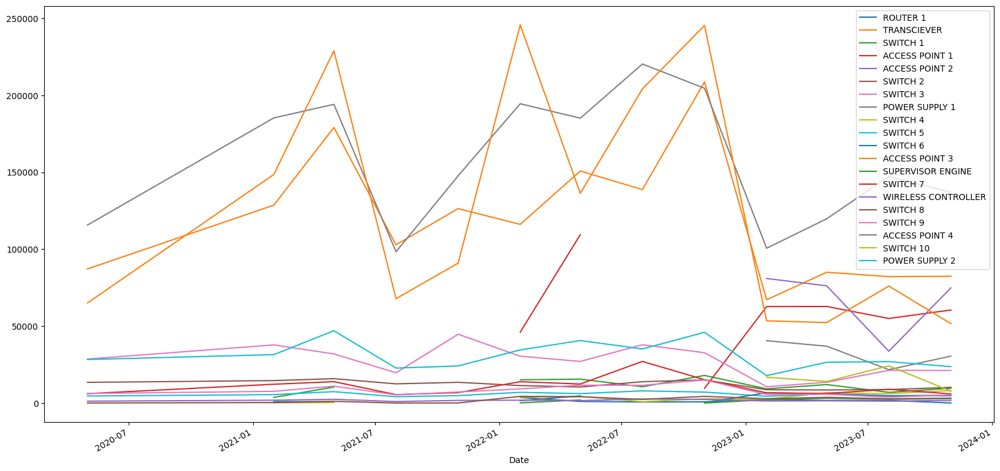

In [136]:
# transposed.plot('Date','ROUTER 1')
# transposed.plot('Date','ROUTER 1')
import matplotlib.pyplot as plt
plt.figure(figsize=(20 , 10 ))
ax = plt.gca()
columns = transposed.columns[1:]
for col in columns:
    transposed.plot(x = 'Date', y = col, ax = ax)

iterative imputed

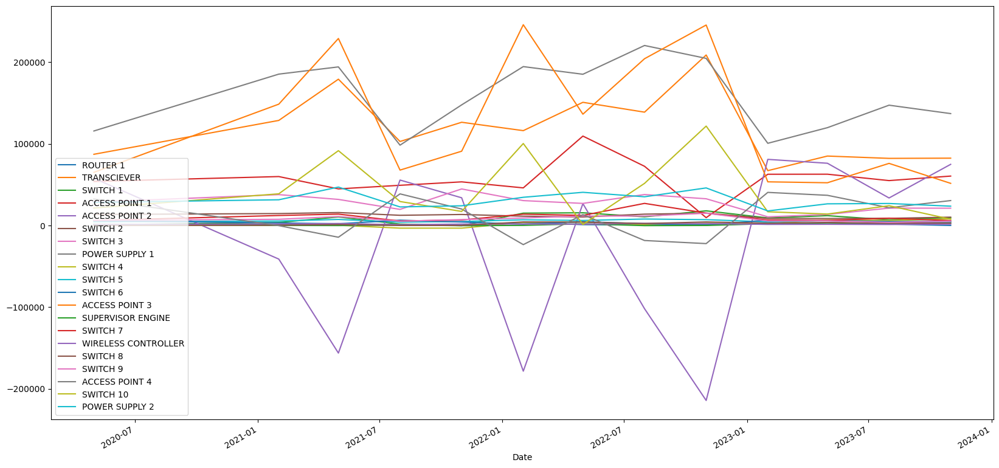

In [137]:
# transposed.plot('Date','ROUTER 1')
# transposed.plot('Date','ROUTER 1')
import matplotlib.pyplot as plt
plt.figure(figsize=(20 , 10 ))
ax = plt.gca()
columns = new.columns[1:]
for col in columns:
    new.plot(x = 'Date', y = col, ax = ax)

zero imputed

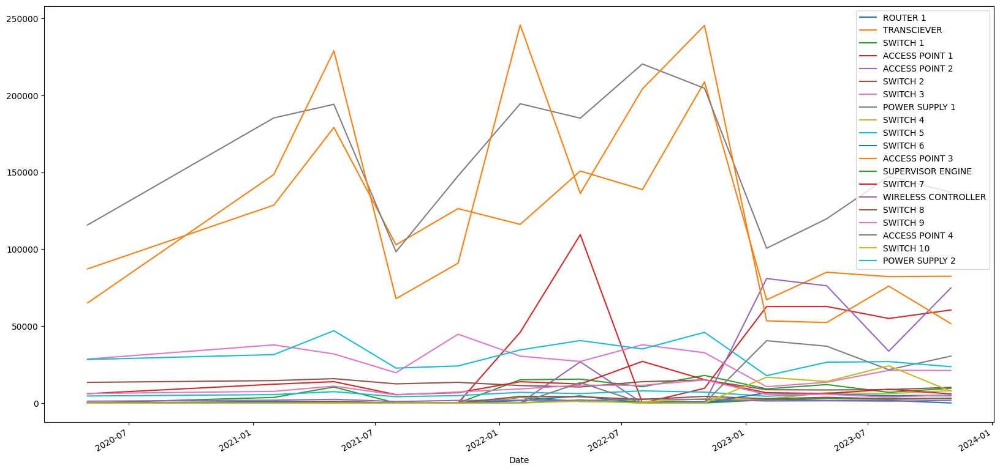

In [138]:
# transposed.plot('Date','ROUTER 1')
# transposed.plot('Date','ROUTER 1')
import matplotlib.pyplot as plt
plt.figure(figsize=(20 , 10 ))
ax = plt.gca()
columns = new_0.columns[1:]
for col in columns:
    new_0.plot(x = 'Date', y = col, ax = ax)

spline imputed

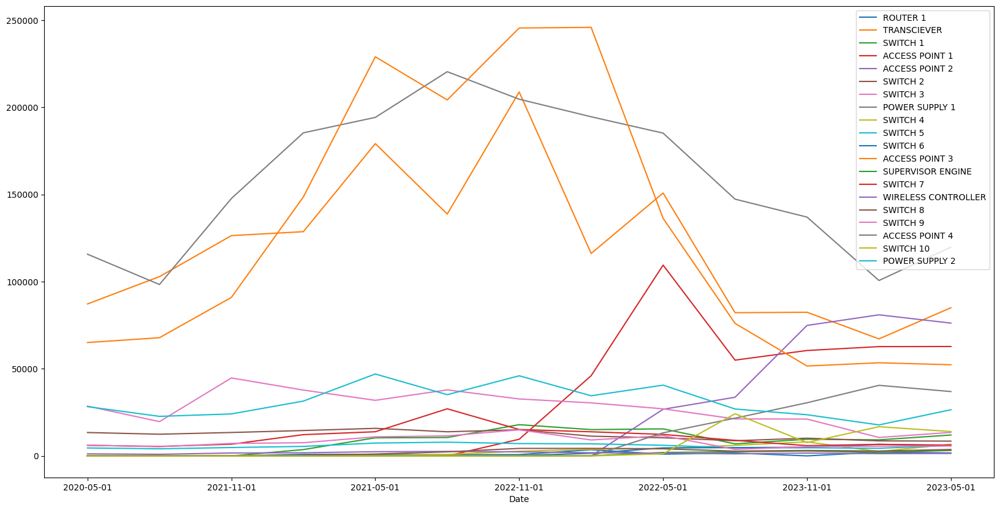

In [139]:
# transposed.plot('Date','ROUTER 1')
# transposed.plot('Date','ROUTER 1')
import matplotlib.pyplot as plt
plt.figure(figsize=(20 , 10 ))
ax = plt.gca()
columns = new_spline.columns[1:]
for col in columns:
    new_spline.plot(x = 'Date', y = col, ax = ax)

linear imputed

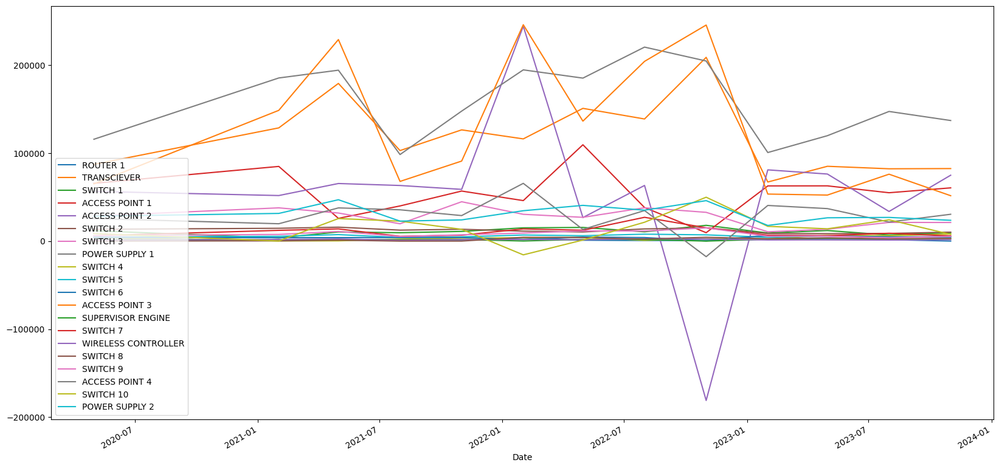

In [140]:
# transposed.plot('Date','ROUTER 1')
# transposed.plot('Date','ROUTER 1')
import matplotlib.pyplot as plt
plt.figure(figsize=(20 , 10 ))
ax = plt.gca()
columns = new_linear.columns[1:]
for col in columns:
    new_linear.plot(x = 'Date', y = col, ax = ax)

normalisation

In [141]:
# from sklearn.preprocessing import MinMaxScaler

# # Assuming 'transposed' is your DataFrame containing the data
# scaler = MinMaxScaler(feature_range=(-1, 1))

# scaled_iterative = scaler.fit_transform(new.iloc[:, 1:])
# scaled_iterative_df = pd.DataFrame(scaled_iterative, columns=new.columns[1:])
# scaled_iterative_df.insert(0,'Date',new['Date'])

# scaled_zero = scaler.fit_transform(new_0.iloc[:, 1:])
# scaled_0_df = pd.DataFrame(scaled_zero, columns=new_0.columns[1:])
# scaled_0_df.insert(0,'Date',new_0['Date'])

# scaled_spline = scaler.fit_transform(new_spline.iloc[:, 1:])
# scaled_spline_df = pd.DataFrame(scaled_spline, columns=new_spline.columns[1:])
# scaled_spline_df.insert(0,'Date',new_spline['Date'])

# scaled_linear = scaler.fit_transform(new_linear.iloc[:, 1:])
# scaled_linear_df = pd.DataFrame(scaled_linear, columns=new_linear.columns[1:])
# scaled_linear_df.insert(0,'Date',new_linear['Date'])
scaled_iterative_df = new
scaled_0_df = new_0
scaled_spline_df = new_spline
scaled_linear_df = new_linear

In [142]:
# import matplotlib.pyplot as plt
# plt.figure(figsize=(20 , 10 ))
# ax = plt.gca()
# columns = scaled_iterative_df.columns[1:]
# for col in columns:
#     scaled_iterative_df.plot(x = 'Date', y = col, ax = ax)

feature engineering

lag features

In [143]:
# Define the number of lag quarters
lag_periods = 5

# Create lag features for each product
columns = new.columns[1:]

# iterative imputed
for product in columns:
    for i in range(1, lag_periods + 1):
        scaled_iterative_df[f'{product}_Lag{i}'] = scaled_iterative_df[product].shift(i)

scaled_iterative_df.fillna(0, inplace=True)

scaled_iterative_df = scaled_iterative_df.copy()

# zero imputed
for product in columns:
    for i in range(1, lag_periods + 1):
        scaled_0_df[f'{product}_Lag{i}'] = scaled_0_df[product].shift(i)

scaled_0_df.fillna(0, inplace=True)

scaled_0_df = scaled_0_df.copy()

# spline imputed
for product in columns:
    for i in range(1, lag_periods + 1):
        scaled_spline_df[f'{product}_Lag{i}'] = scaled_spline_df[product].shift(i)

scaled_spline_df.fillna(0, inplace=True)

scaled_spline_df = scaled_spline_df.copy()


# linear imputed
for product in columns:
    for i in range(1, lag_periods + 1):
        scaled_linear_df[f'{product}_Lag{i}'] = scaled_linear_df[product].shift(i)

scaled_linear_df.fillna(0, inplace=True)

scaled_linear_df = scaled_linear_df.copy()

# scaled_iterative_df

<ipython-input-143-cb00e76e91de>:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_iterative_df[f'{product}_Lag{i}'] = scaled_iterative_df[product].shift(i)
<ipython-input-143-cb00e76e91de>:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_iterative_df[f'{product}_Lag{i}'] = scaled_iterative_df[product].shift(i)
<ipython-input-143-cb00e76e91de>:19: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all c

visualising correlations

<Figure size 1200x600 with 0 Axes>

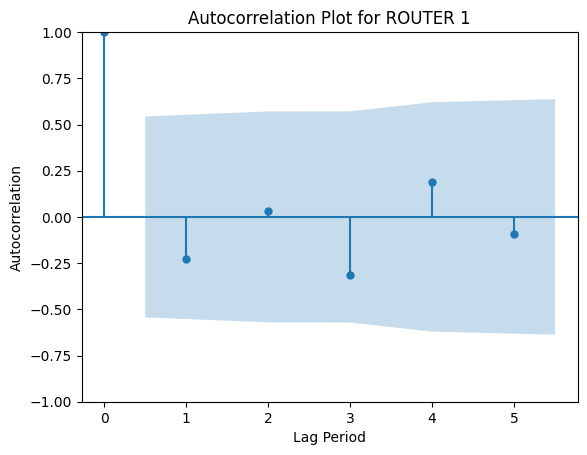

<Figure size 1200x600 with 0 Axes>

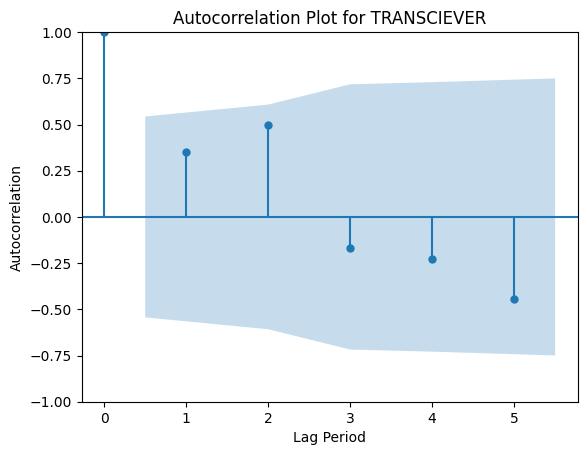

<Figure size 1200x600 with 0 Axes>

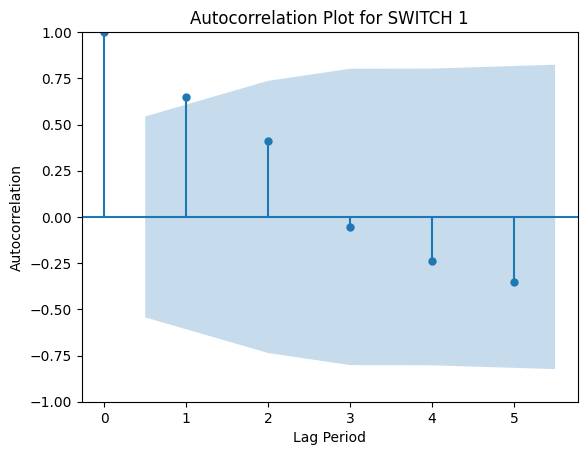

<Figure size 1200x600 with 0 Axes>

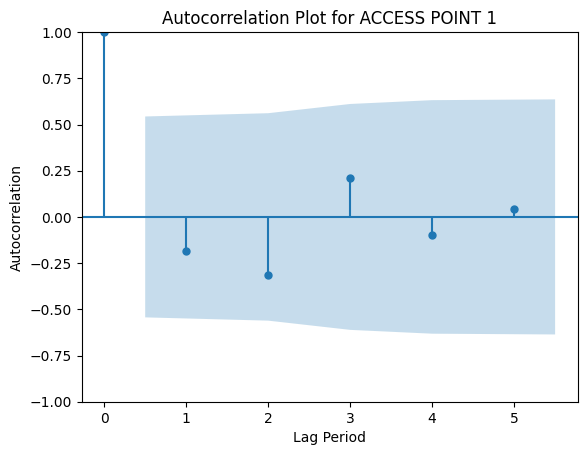

<Figure size 1200x600 with 0 Axes>

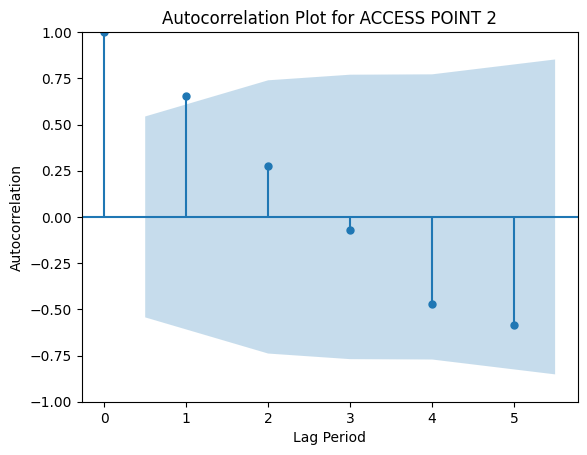

<Figure size 1200x600 with 0 Axes>

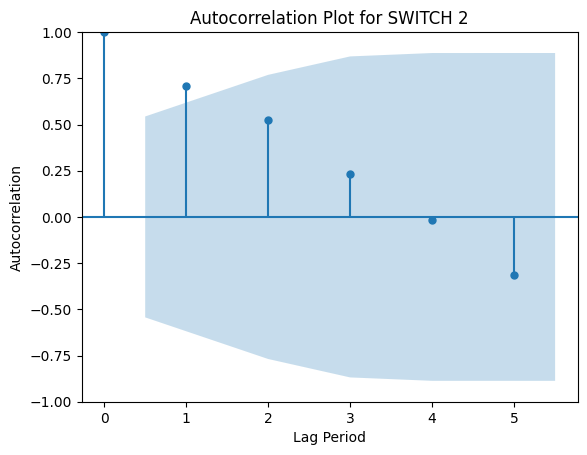

<Figure size 1200x600 with 0 Axes>

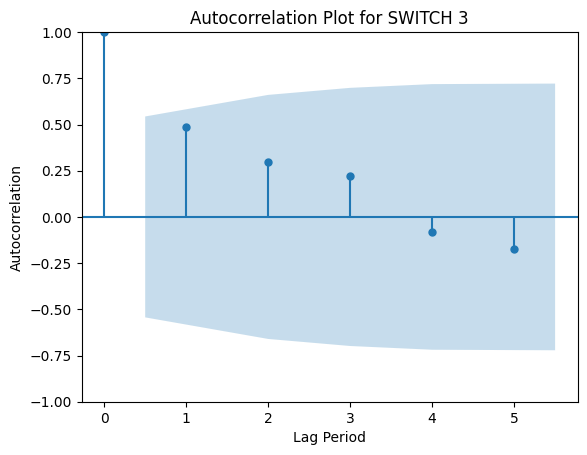

<Figure size 1200x600 with 0 Axes>

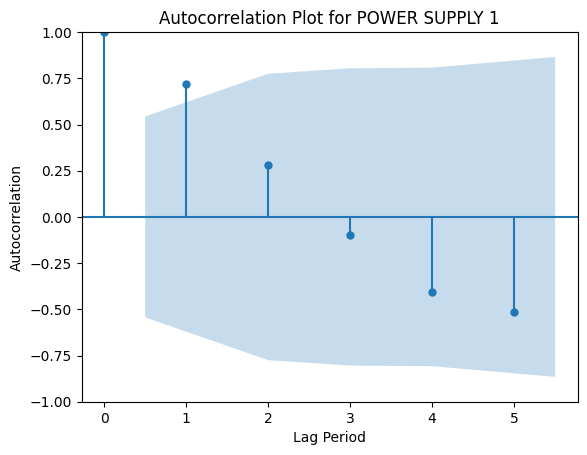

<Figure size 1200x600 with 0 Axes>

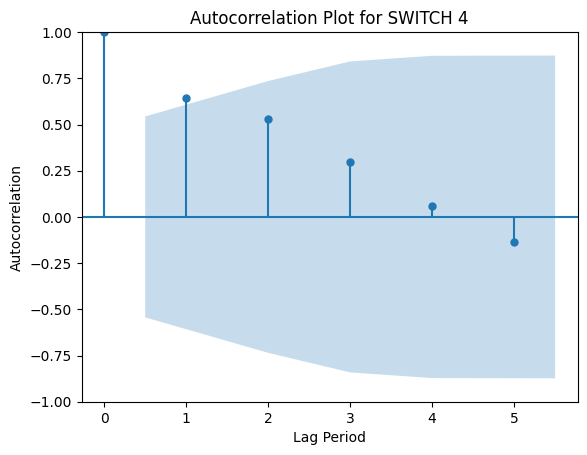

<Figure size 1200x600 with 0 Axes>

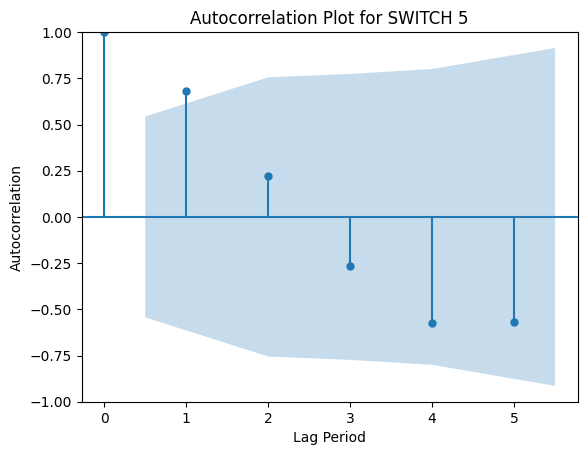

<Figure size 1200x600 with 0 Axes>

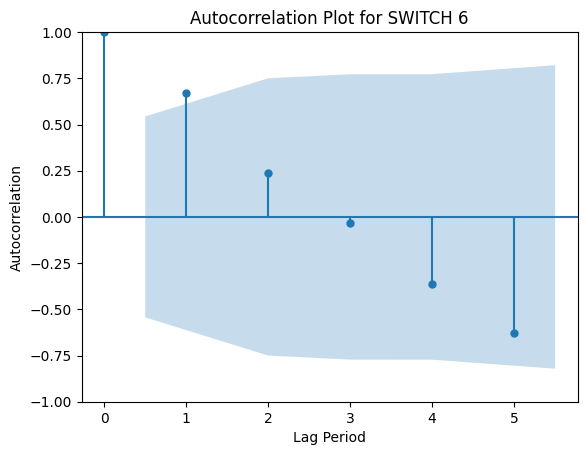

<Figure size 1200x600 with 0 Axes>

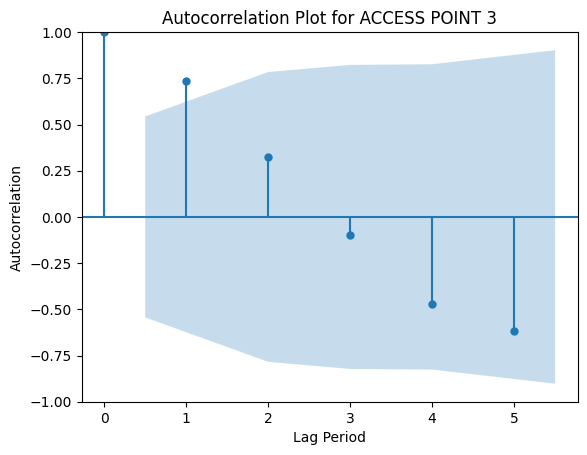

<Figure size 1200x600 with 0 Axes>

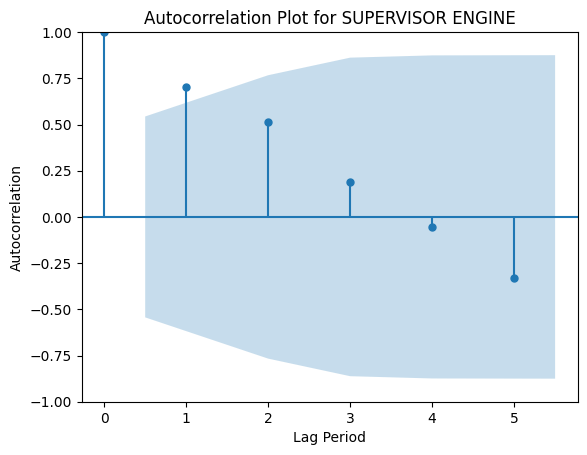

<Figure size 1200x600 with 0 Axes>

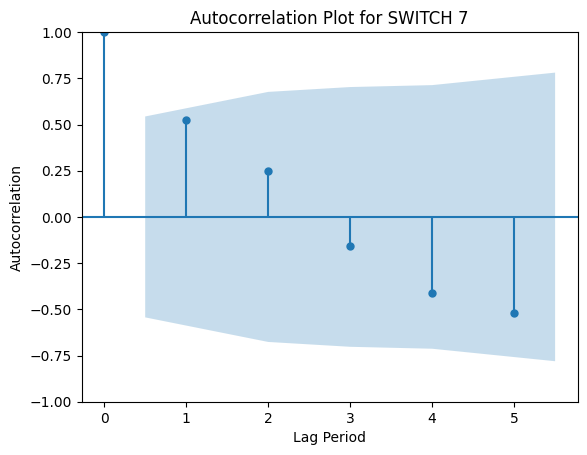

<Figure size 1200x600 with 0 Axes>

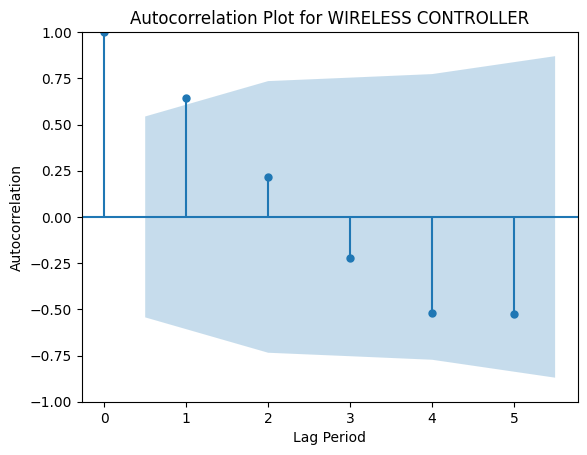

<Figure size 1200x600 with 0 Axes>

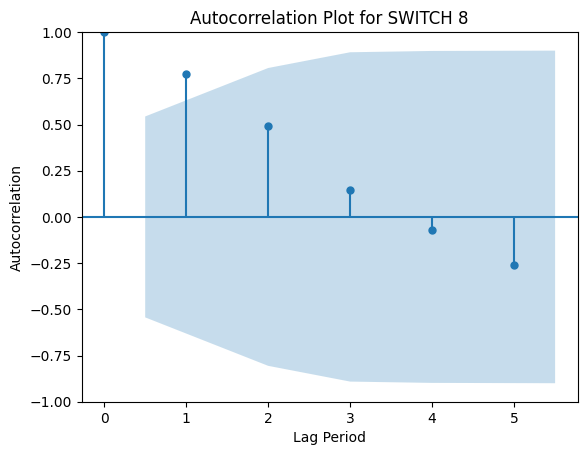

<Figure size 1200x600 with 0 Axes>

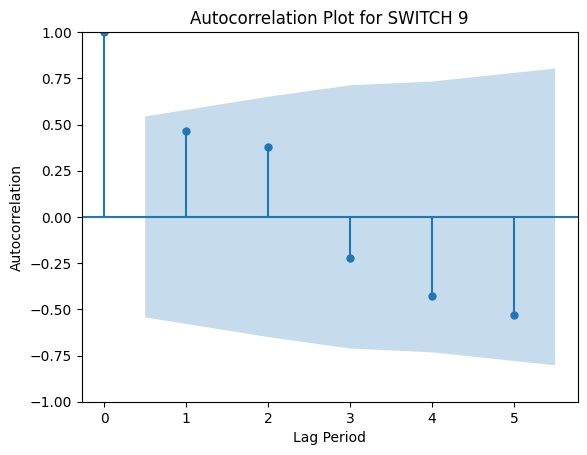

<Figure size 1200x600 with 0 Axes>

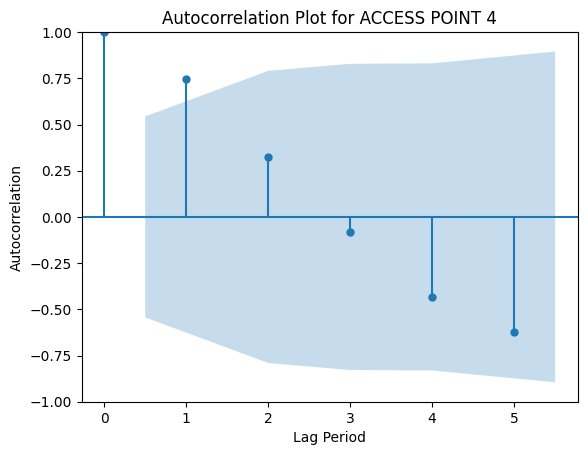

<Figure size 1200x600 with 0 Axes>

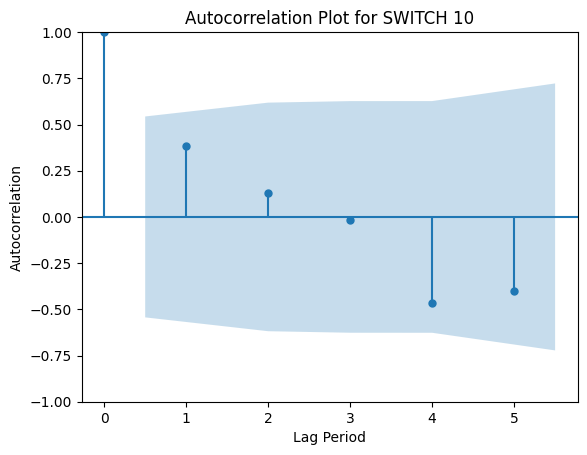

<Figure size 1200x600 with 0 Axes>

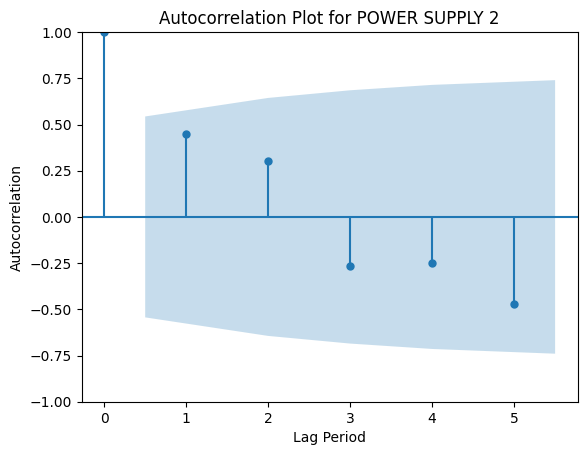

<Figure size 1200x600 with 0 Axes>

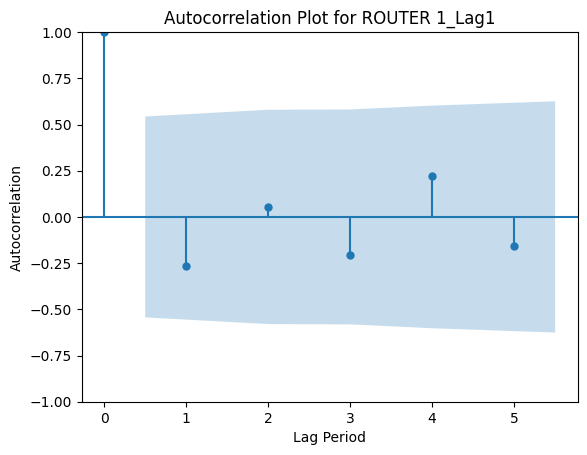

<Figure size 1200x600 with 0 Axes>

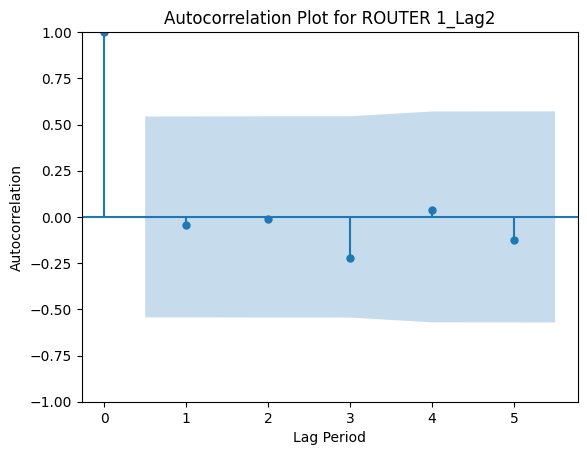

<Figure size 1200x600 with 0 Axes>

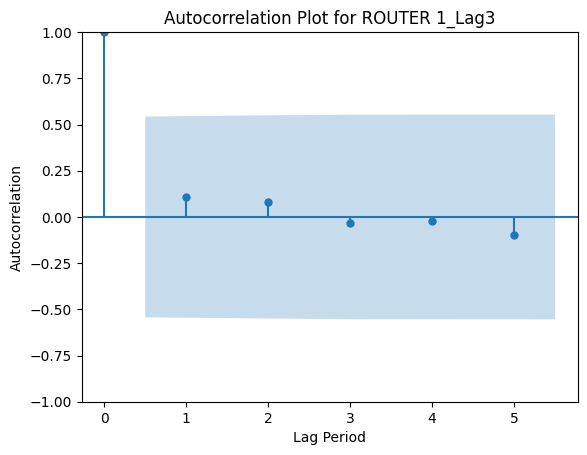

<Figure size 1200x600 with 0 Axes>

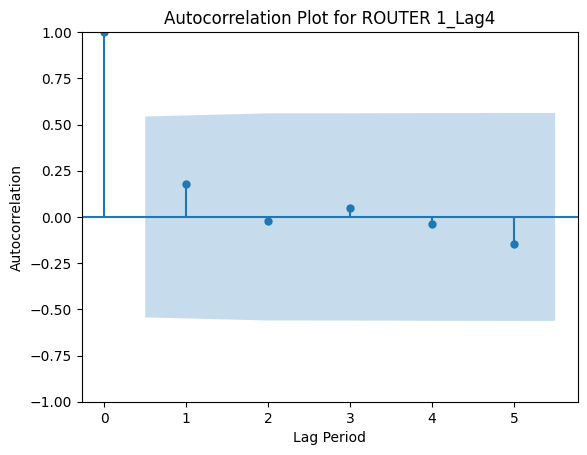

<Figure size 1200x600 with 0 Axes>

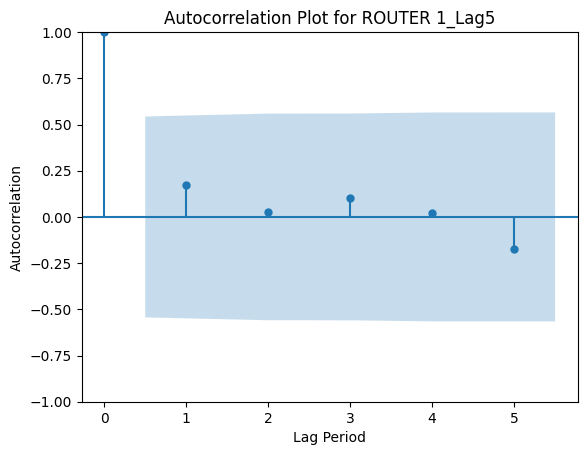

<Figure size 1200x600 with 0 Axes>

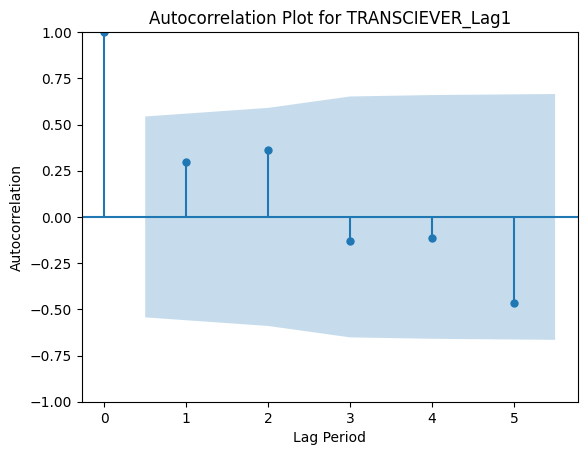

<Figure size 1200x600 with 0 Axes>

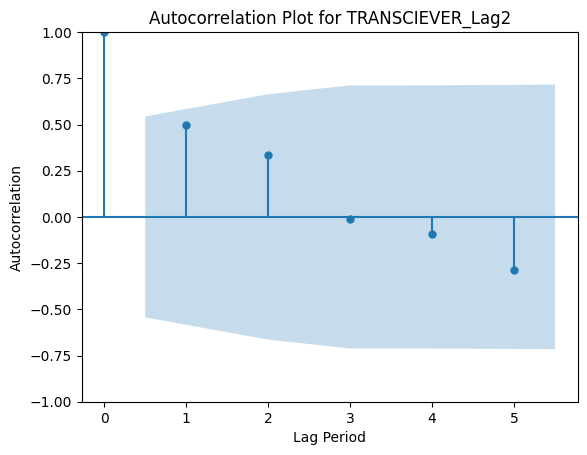

<Figure size 1200x600 with 0 Axes>

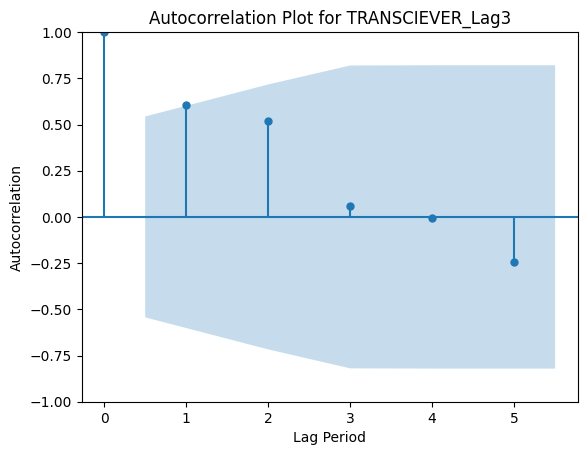

<Figure size 1200x600 with 0 Axes>

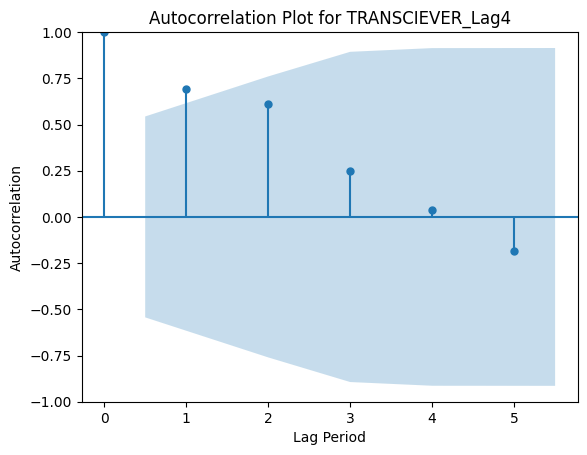

<Figure size 1200x600 with 0 Axes>

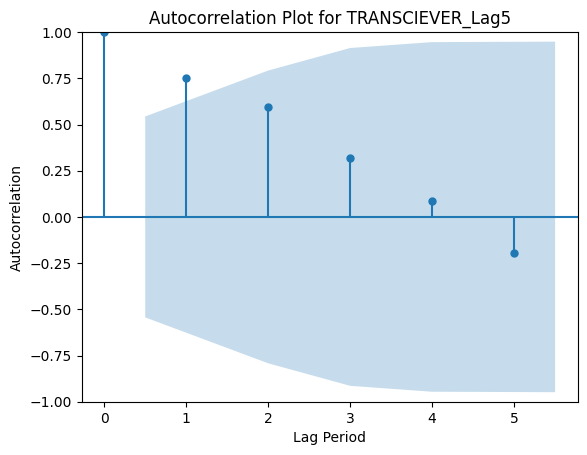

<Figure size 1200x600 with 0 Axes>

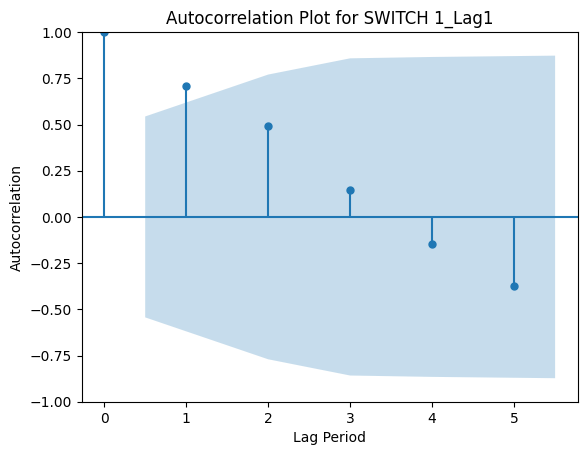

<Figure size 1200x600 with 0 Axes>

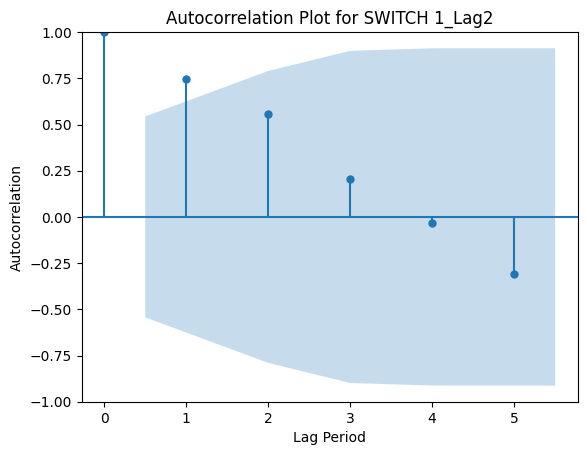

<Figure size 1200x600 with 0 Axes>

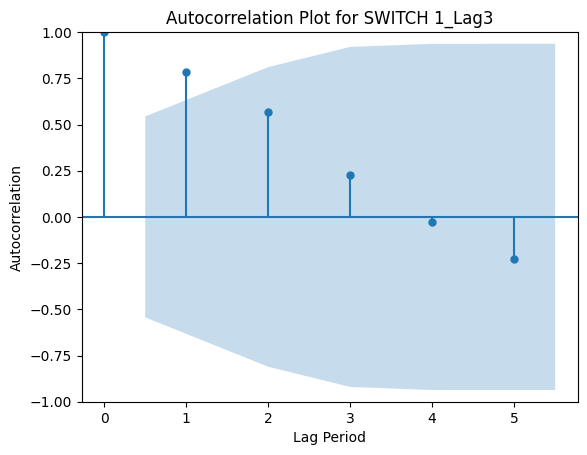

<Figure size 1200x600 with 0 Axes>

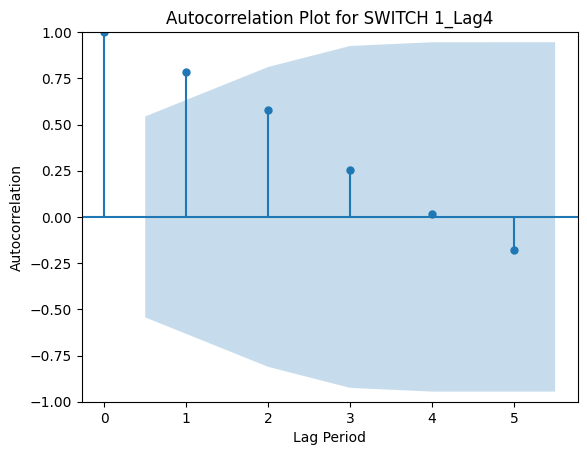

<Figure size 1200x600 with 0 Axes>

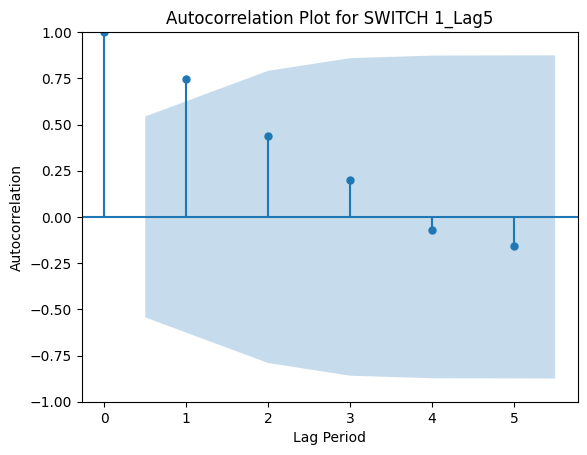

<Figure size 1200x600 with 0 Axes>

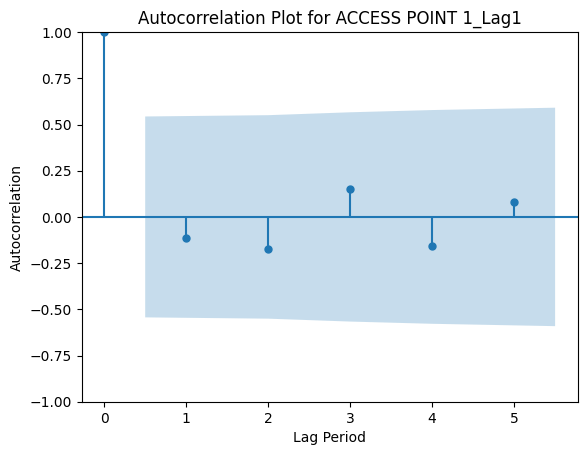

<Figure size 1200x600 with 0 Axes>

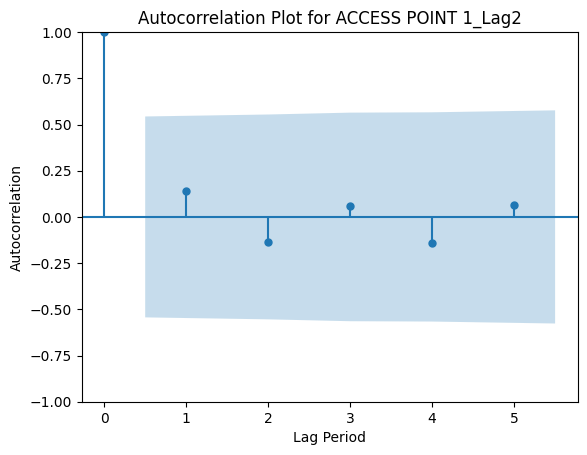

<Figure size 1200x600 with 0 Axes>

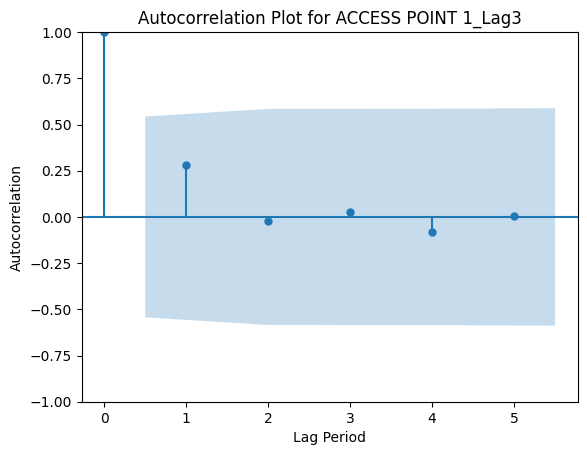

<Figure size 1200x600 with 0 Axes>

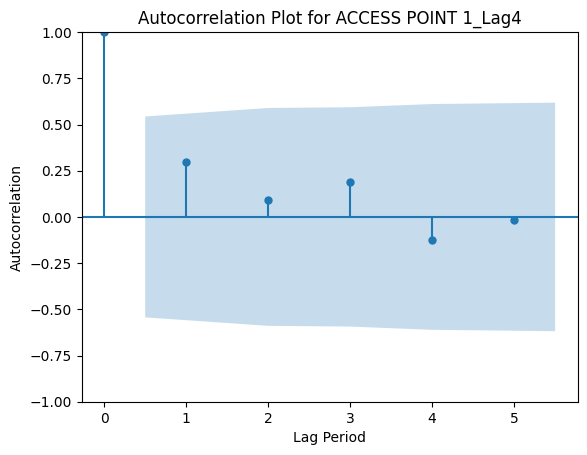

<Figure size 1200x600 with 0 Axes>

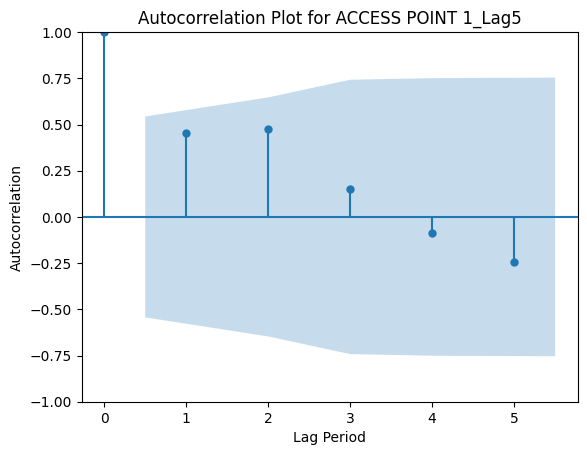

<Figure size 1200x600 with 0 Axes>

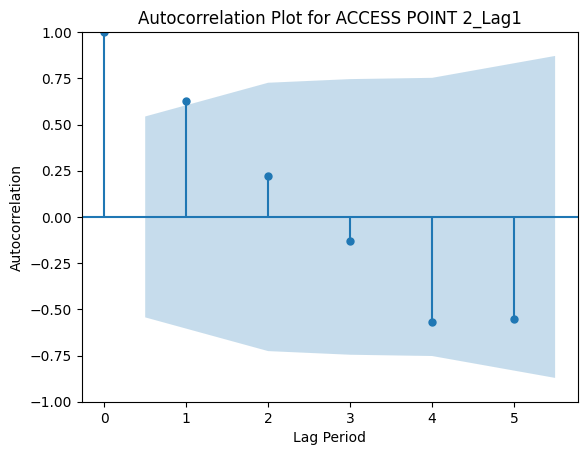

<Figure size 1200x600 with 0 Axes>

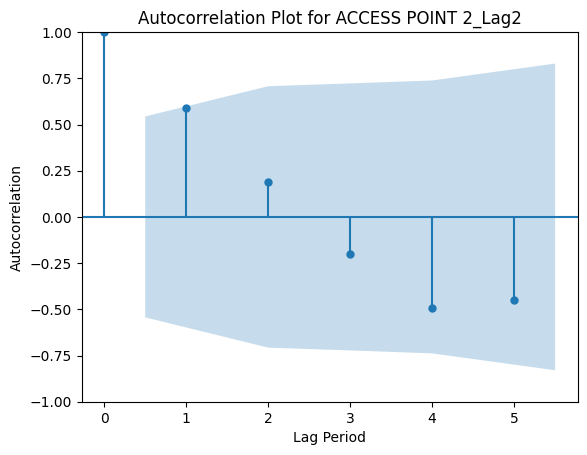

<Figure size 1200x600 with 0 Axes>

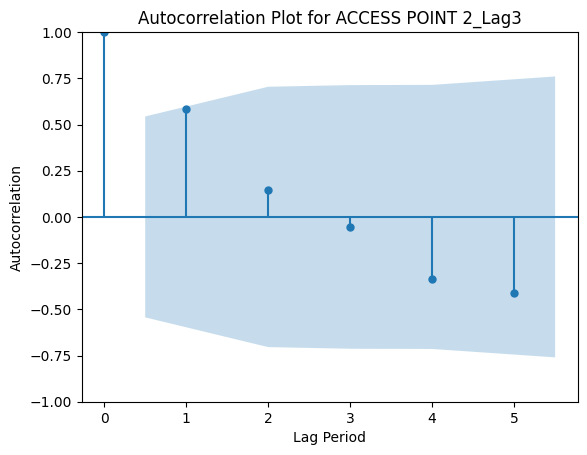

<Figure size 1200x600 with 0 Axes>

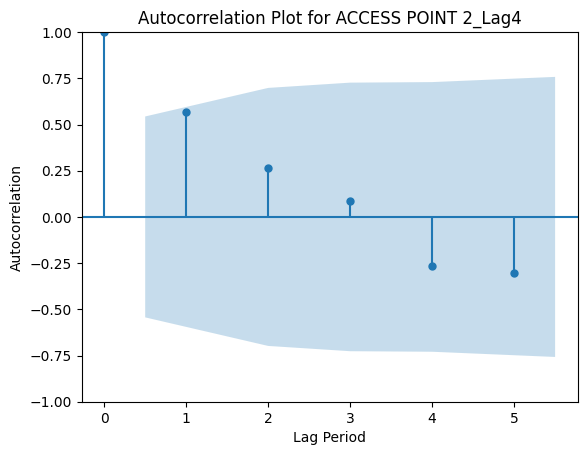

<Figure size 1200x600 with 0 Axes>

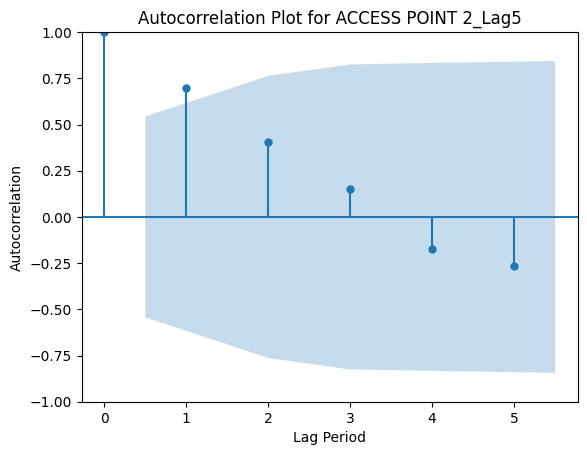

<Figure size 1200x600 with 0 Axes>

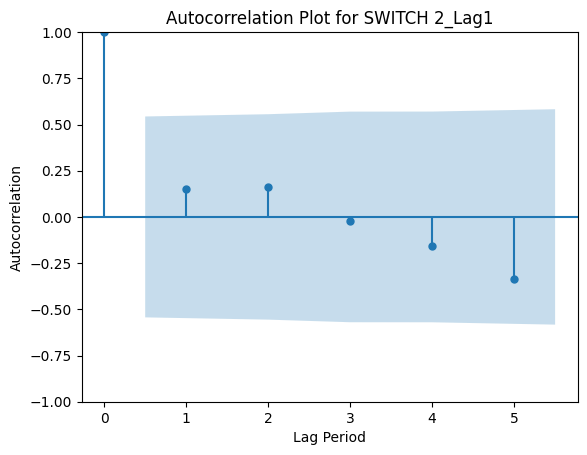

<Figure size 1200x600 with 0 Axes>

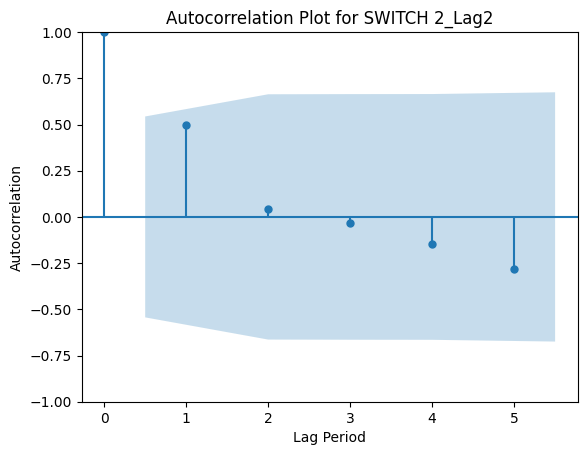

<Figure size 1200x600 with 0 Axes>

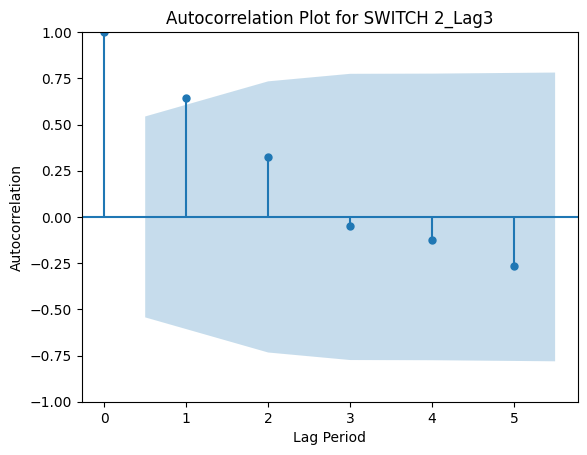

<Figure size 1200x600 with 0 Axes>

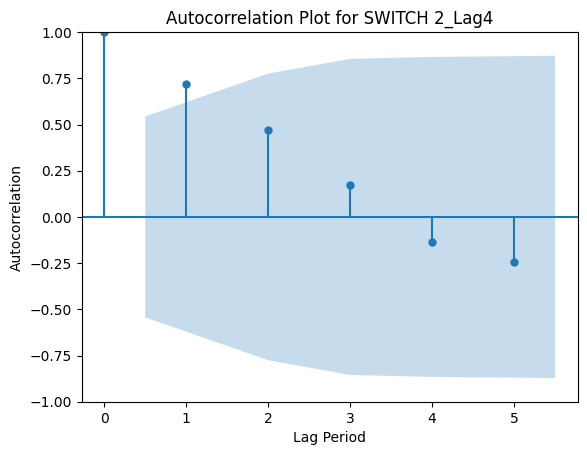

<Figure size 1200x600 with 0 Axes>

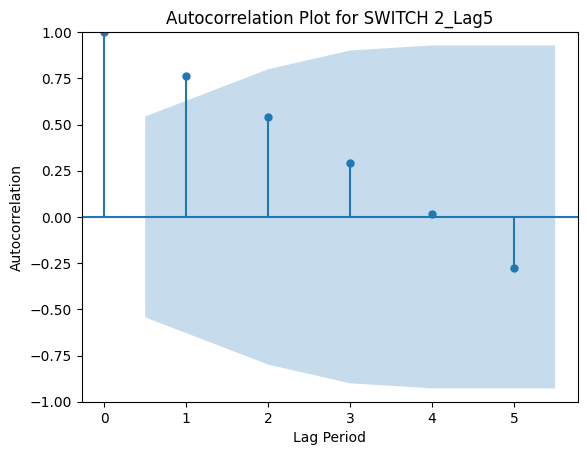

<Figure size 1200x600 with 0 Axes>

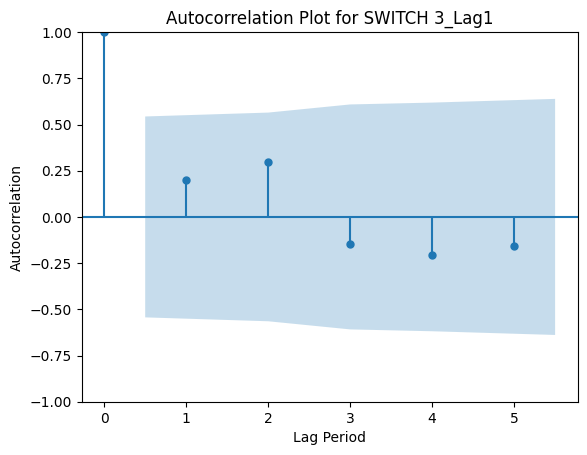

<Figure size 1200x600 with 0 Axes>

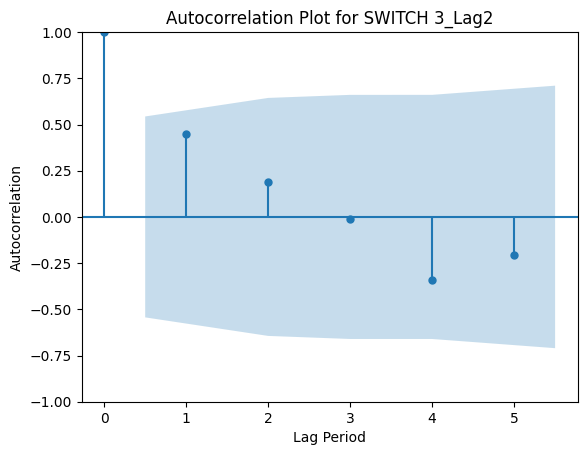

<Figure size 1200x600 with 0 Axes>

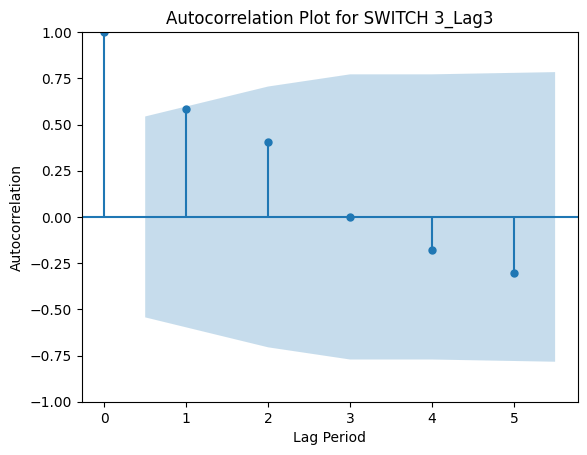

<Figure size 1200x600 with 0 Axes>

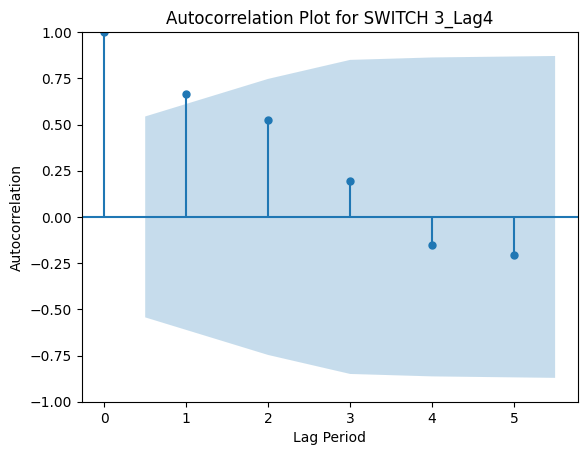

<Figure size 1200x600 with 0 Axes>

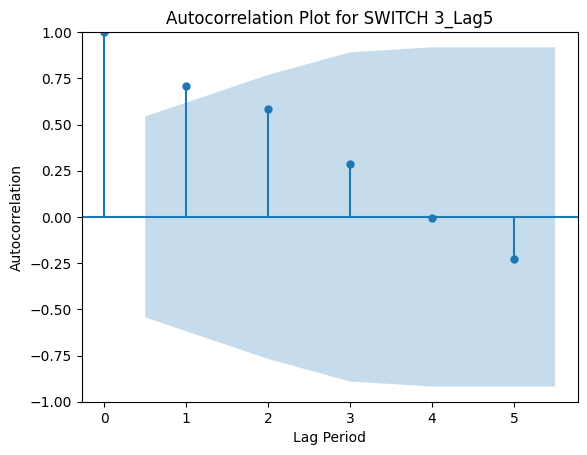

<Figure size 1200x600 with 0 Axes>

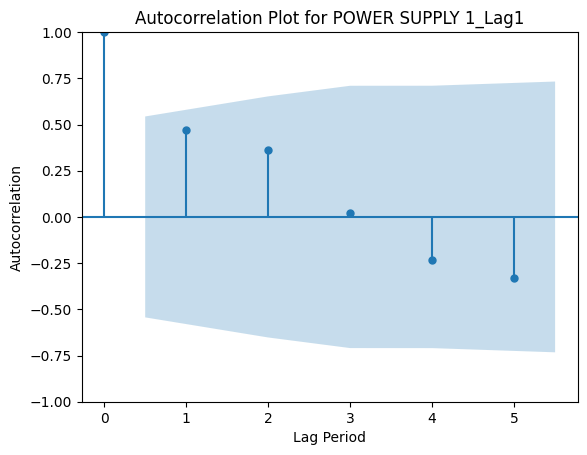

<Figure size 1200x600 with 0 Axes>

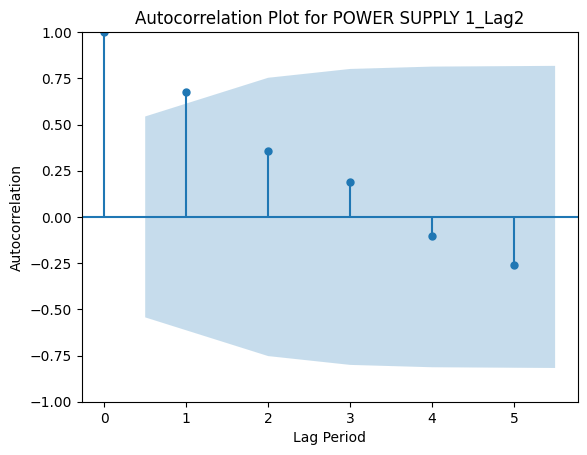

<Figure size 1200x600 with 0 Axes>

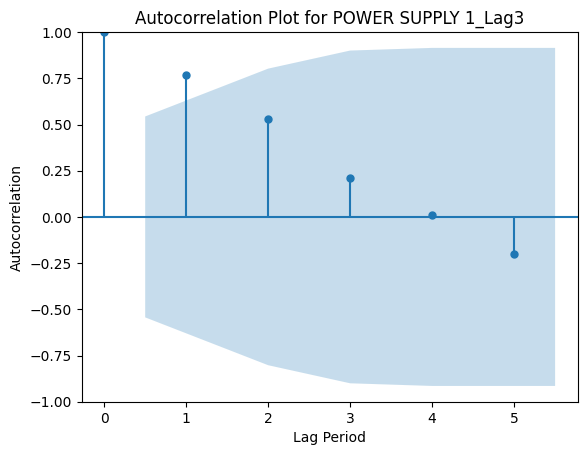

<Figure size 1200x600 with 0 Axes>

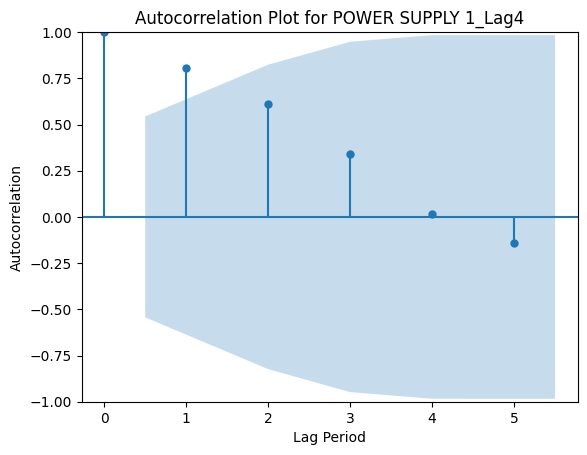

<Figure size 1200x600 with 0 Axes>

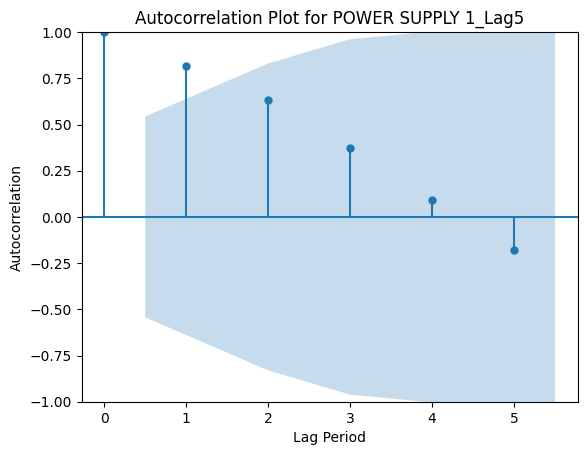

<Figure size 1200x600 with 0 Axes>

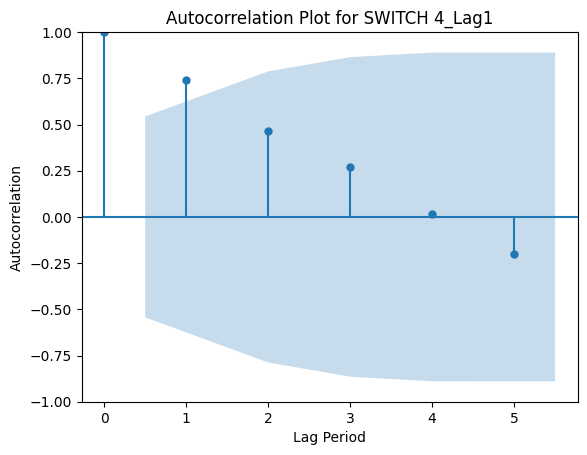

<Figure size 1200x600 with 0 Axes>

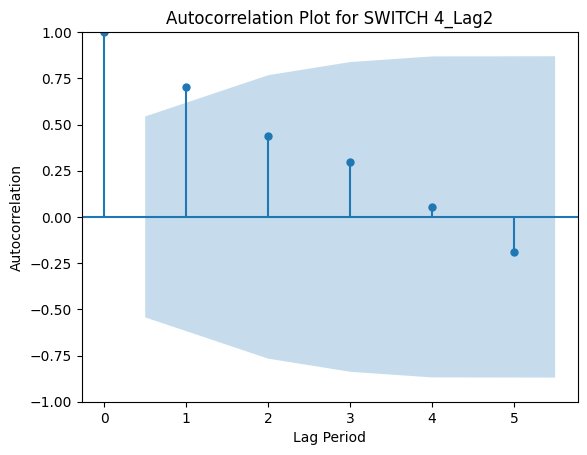

<Figure size 1200x600 with 0 Axes>

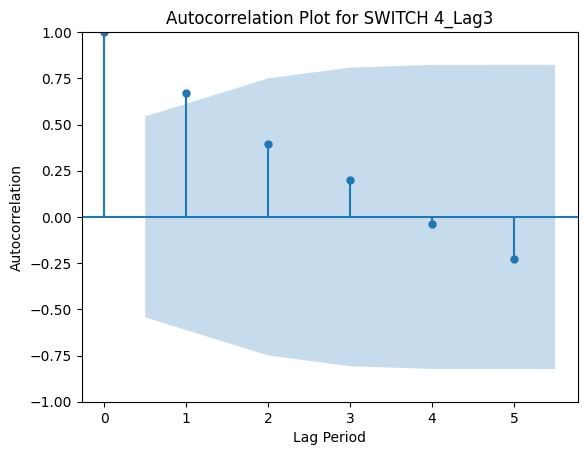

<Figure size 1200x600 with 0 Axes>

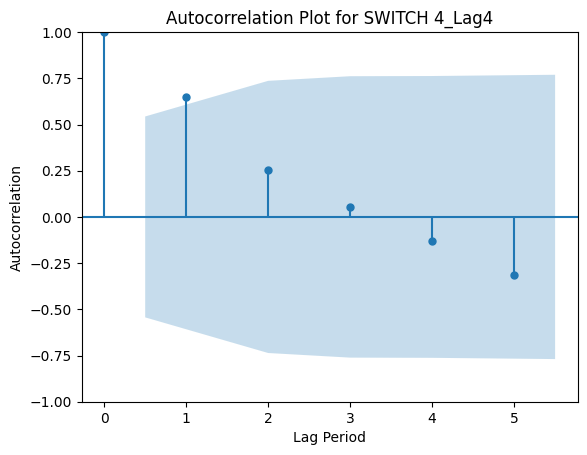

<Figure size 1200x600 with 0 Axes>

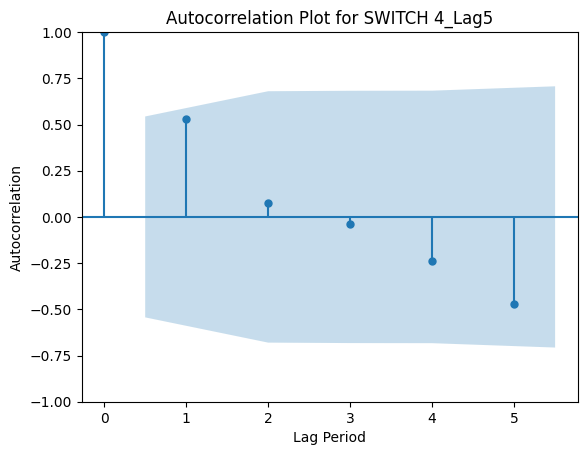

<Figure size 1200x600 with 0 Axes>

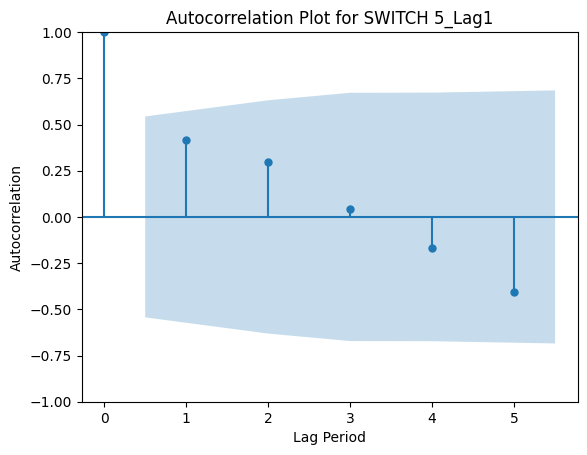

<Figure size 1200x600 with 0 Axes>

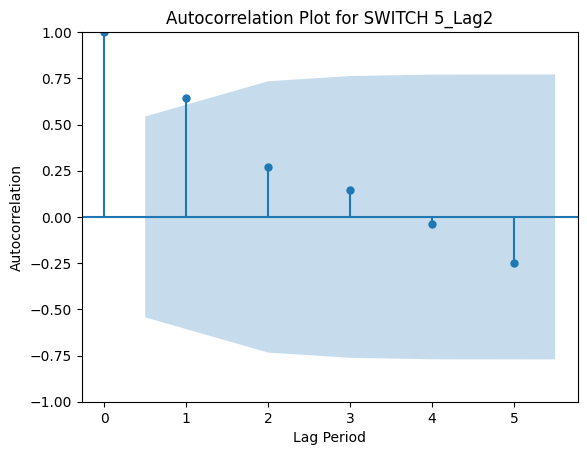

<Figure size 1200x600 with 0 Axes>

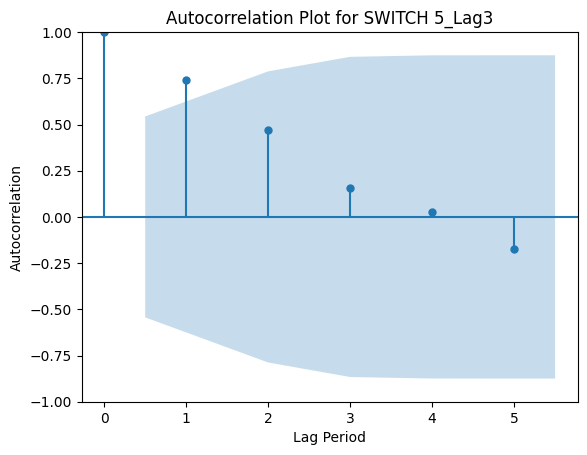

<Figure size 1200x600 with 0 Axes>

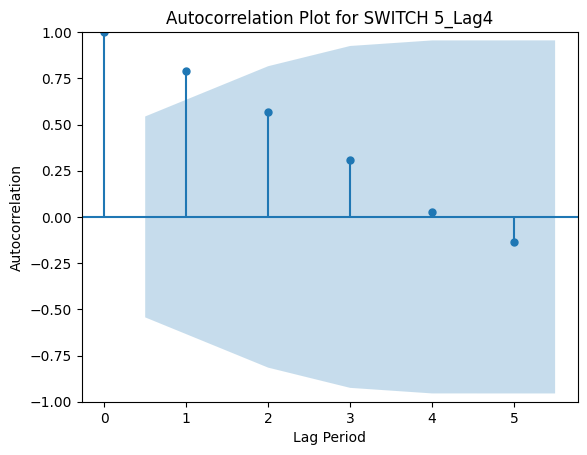

<Figure size 1200x600 with 0 Axes>

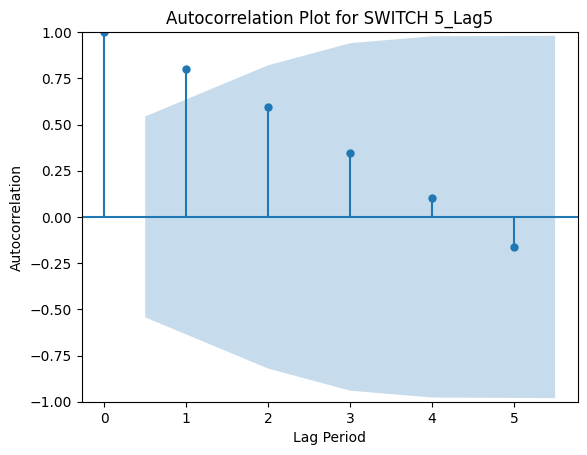

<Figure size 1200x600 with 0 Axes>

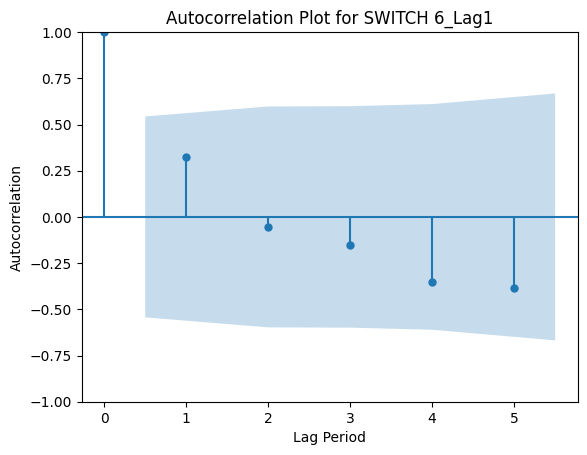

<Figure size 1200x600 with 0 Axes>

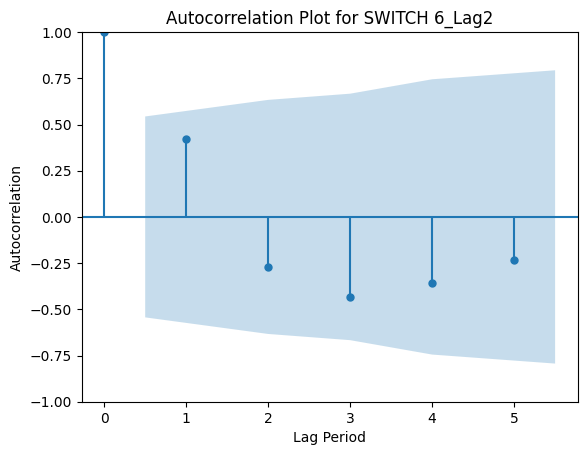

<Figure size 1200x600 with 0 Axes>

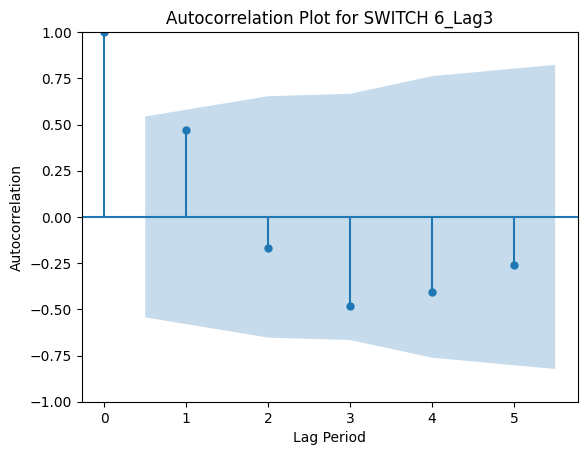

<Figure size 1200x600 with 0 Axes>

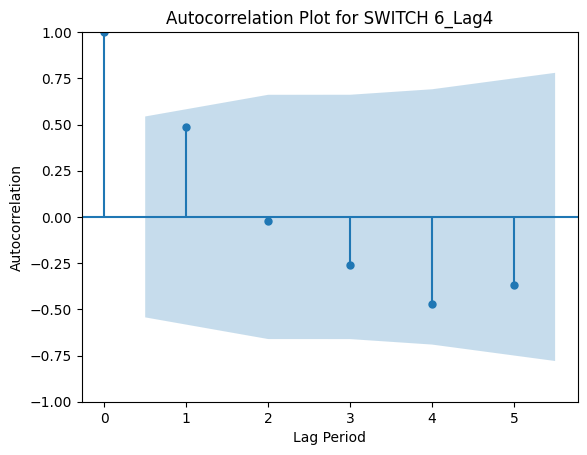

<Figure size 1200x600 with 0 Axes>

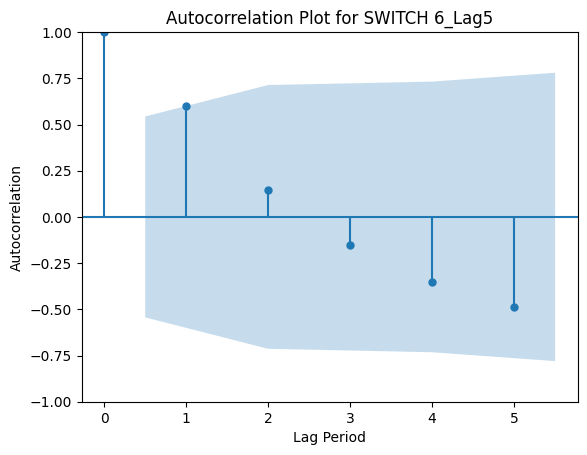

<Figure size 1200x600 with 0 Axes>

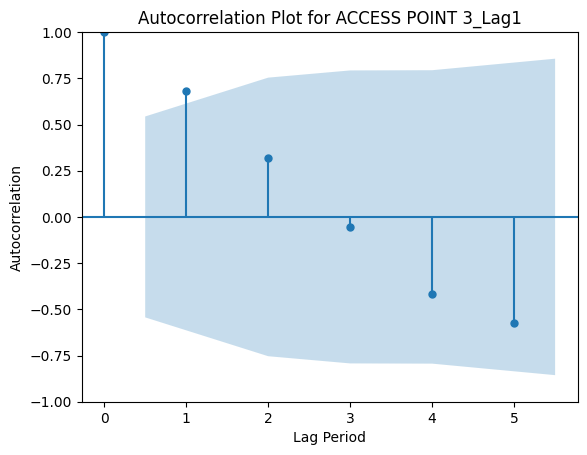

<Figure size 1200x600 with 0 Axes>

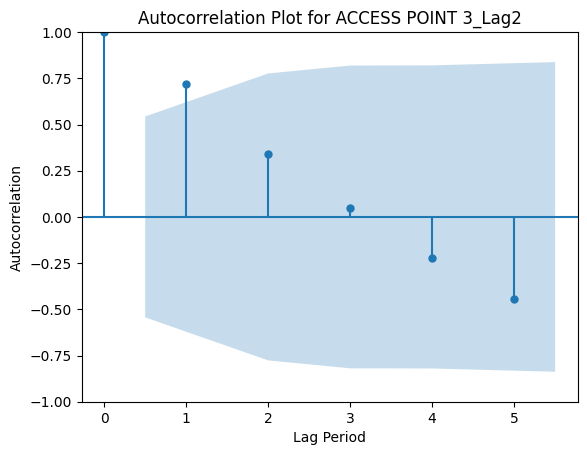

<Figure size 1200x600 with 0 Axes>

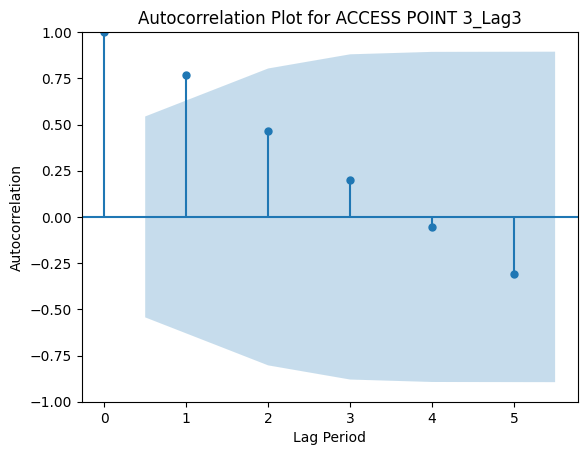

<Figure size 1200x600 with 0 Axes>

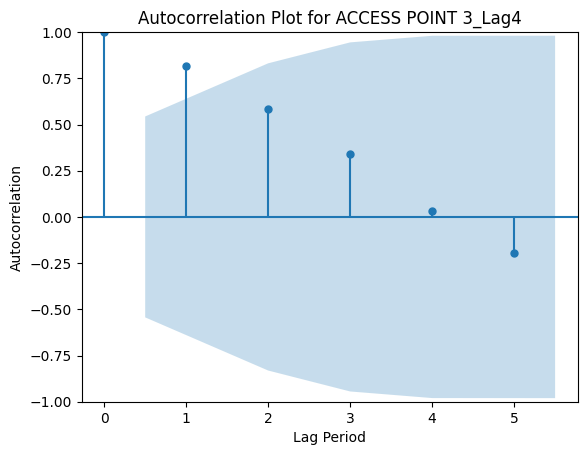

<Figure size 1200x600 with 0 Axes>

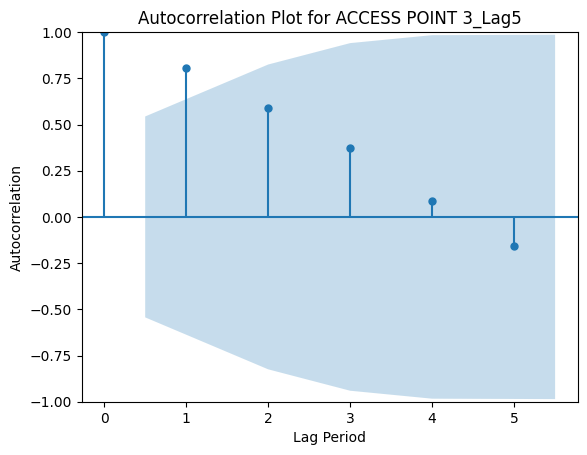

<Figure size 1200x600 with 0 Axes>

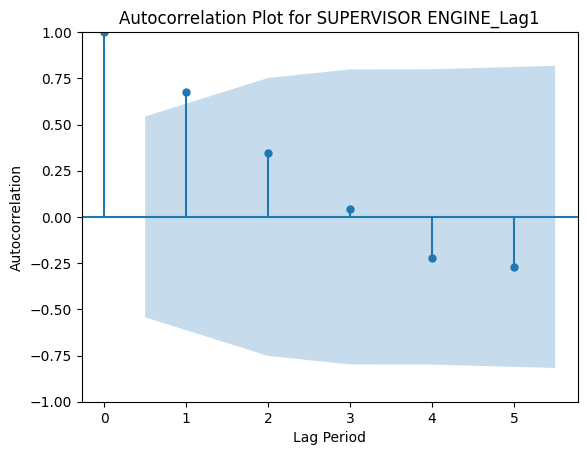

<Figure size 1200x600 with 0 Axes>

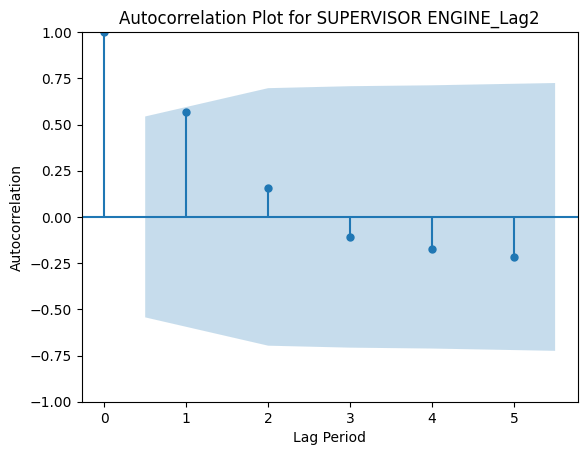

<Figure size 1200x600 with 0 Axes>

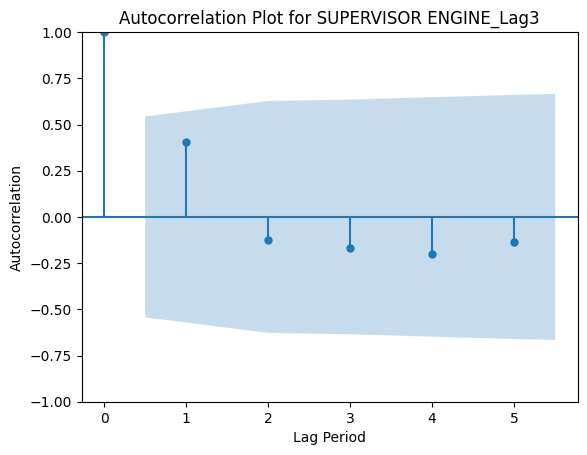

<Figure size 1200x600 with 0 Axes>

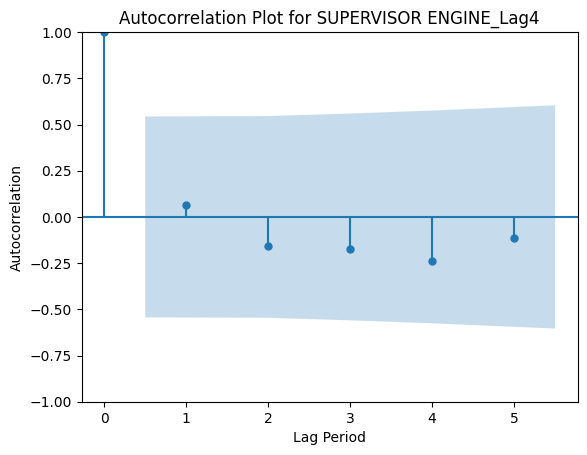

<Figure size 1200x600 with 0 Axes>

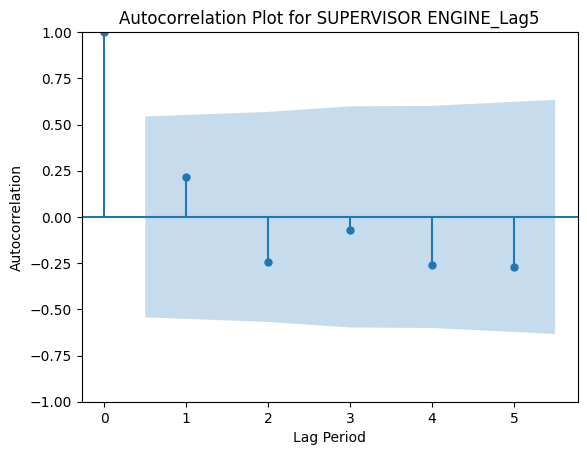

<Figure size 1200x600 with 0 Axes>

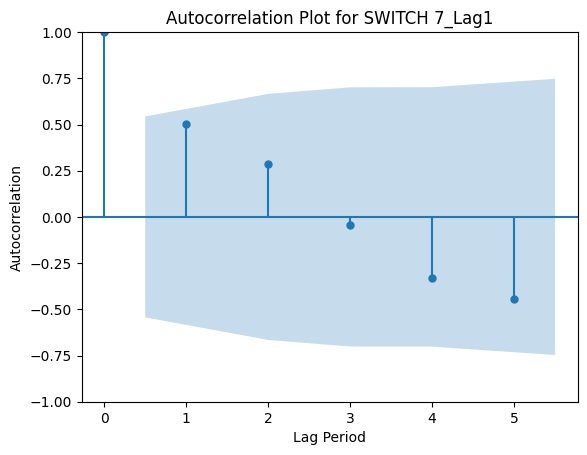

<Figure size 1200x600 with 0 Axes>

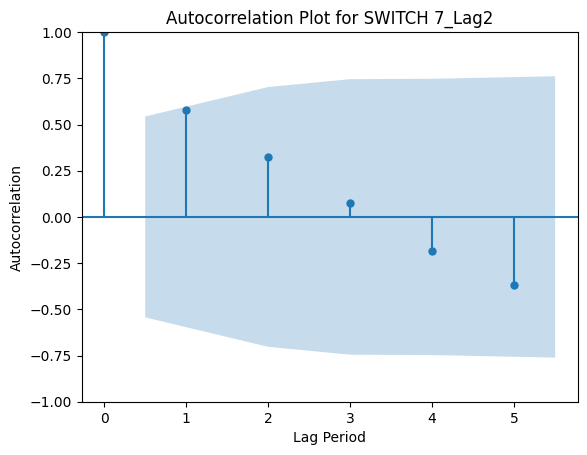

<Figure size 1200x600 with 0 Axes>

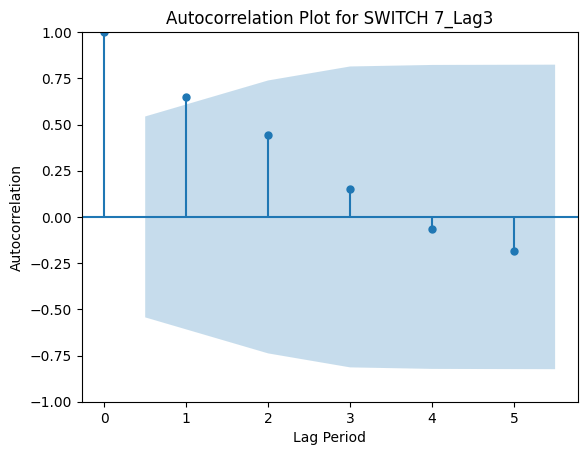

<Figure size 1200x600 with 0 Axes>

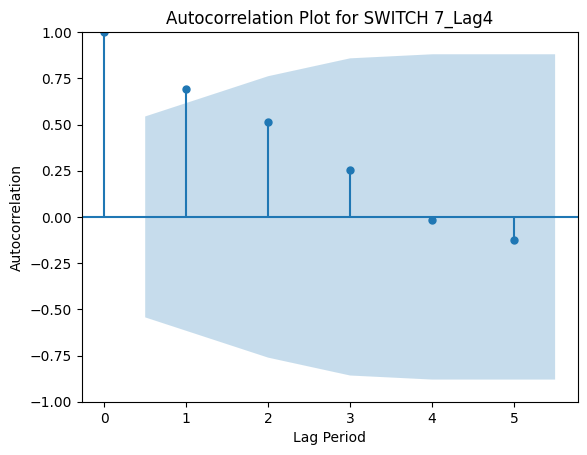

<Figure size 1200x600 with 0 Axes>

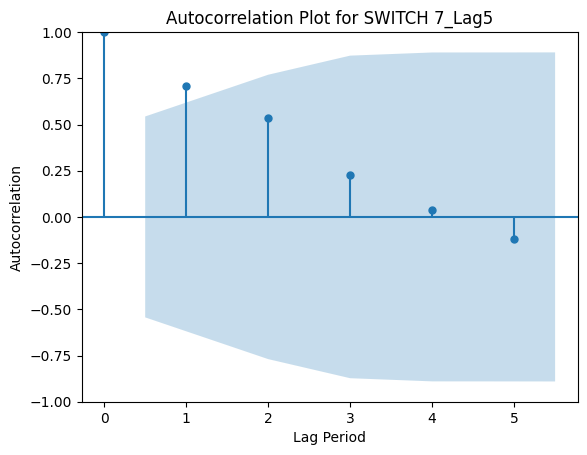

<Figure size 1200x600 with 0 Axes>

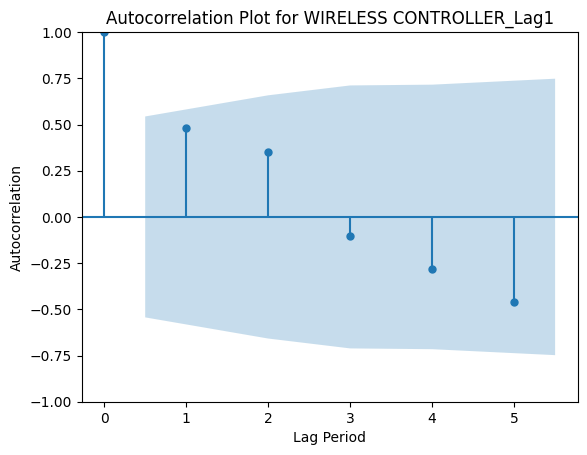

<Figure size 1200x600 with 0 Axes>

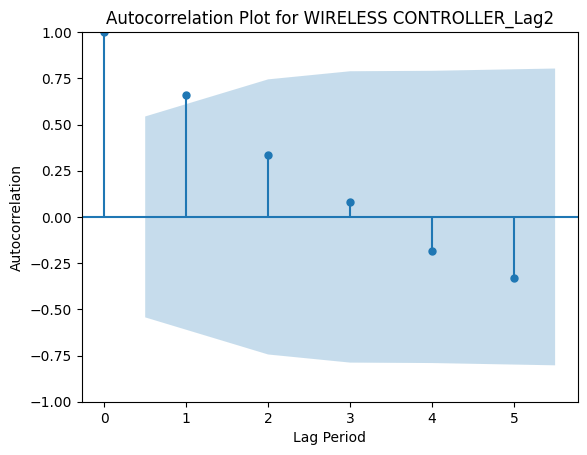

<Figure size 1200x600 with 0 Axes>

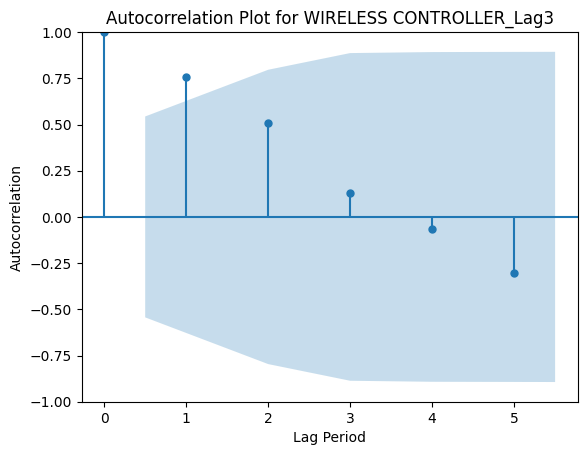

<Figure size 1200x600 with 0 Axes>

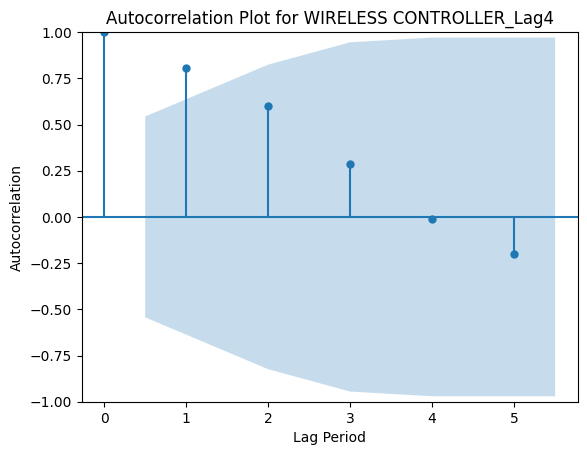

<Figure size 1200x600 with 0 Axes>

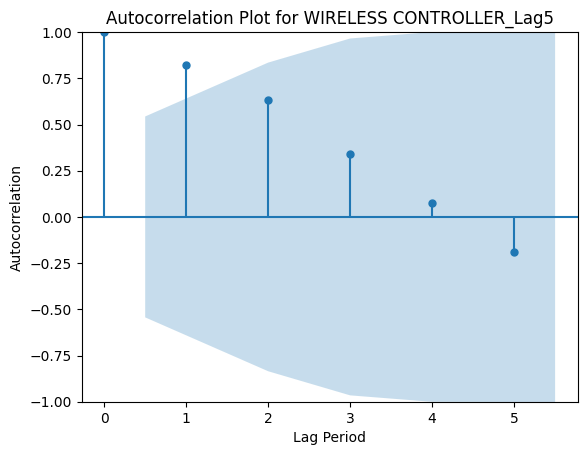

<Figure size 1200x600 with 0 Axes>

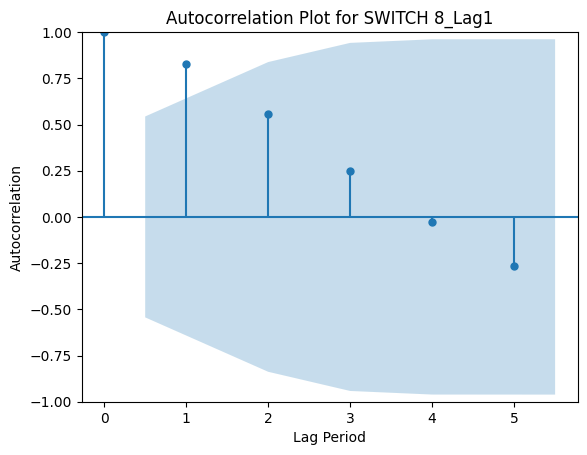

<Figure size 1200x600 with 0 Axes>

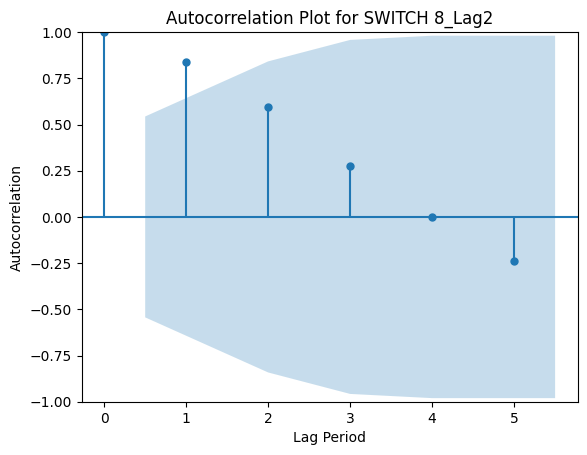

<Figure size 1200x600 with 0 Axes>

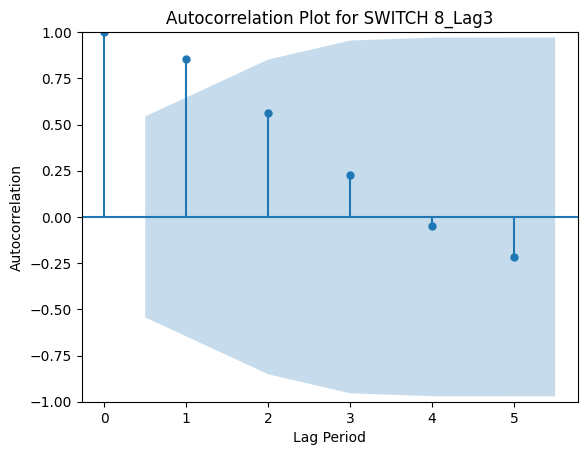

<Figure size 1200x600 with 0 Axes>

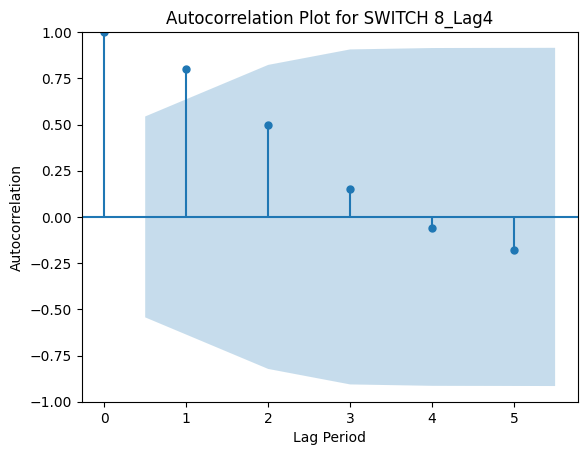

<Figure size 1200x600 with 0 Axes>

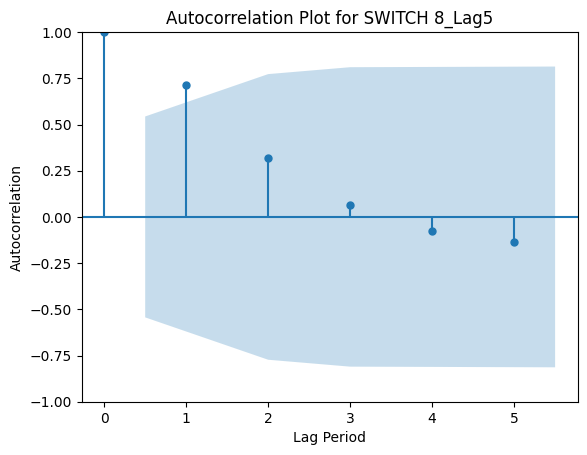

<Figure size 1200x600 with 0 Axes>

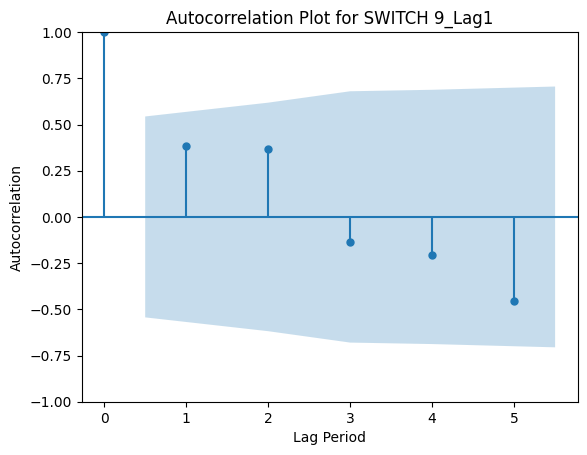

<Figure size 1200x600 with 0 Axes>

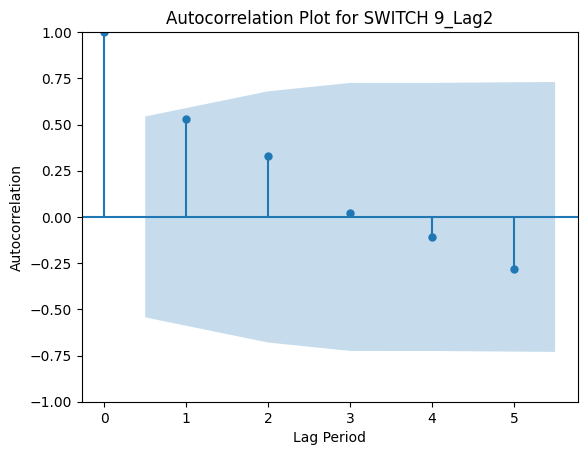

<Figure size 1200x600 with 0 Axes>

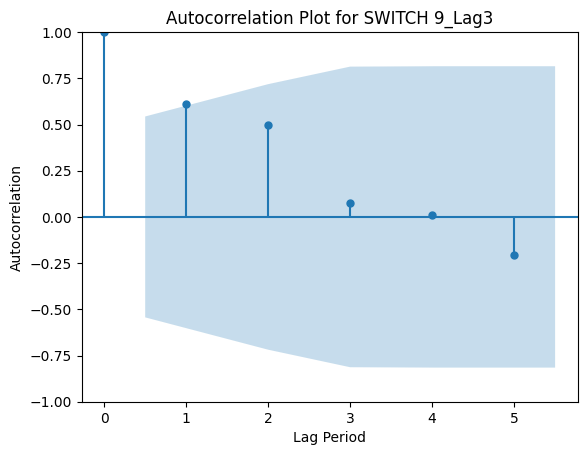

<Figure size 1200x600 with 0 Axes>

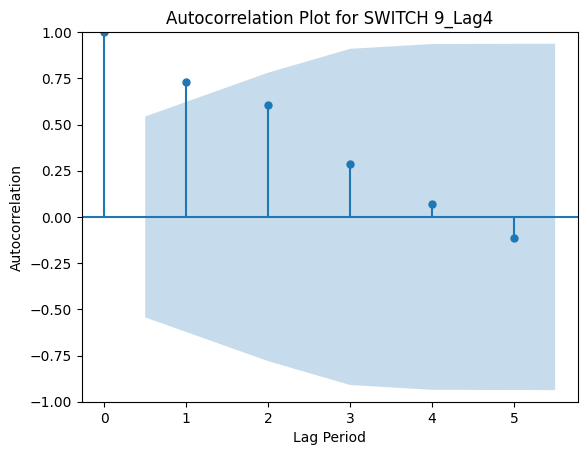

<Figure size 1200x600 with 0 Axes>

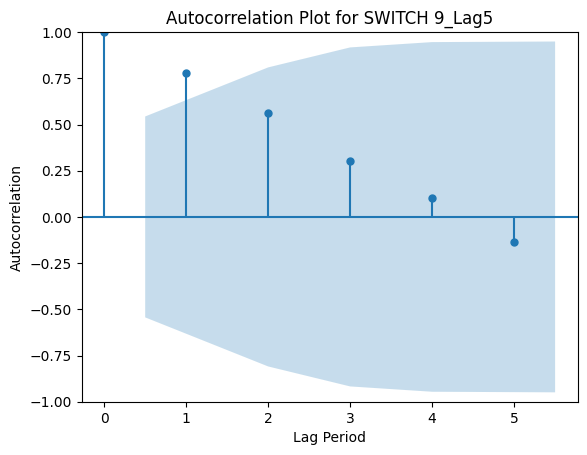

<Figure size 1200x600 with 0 Axes>

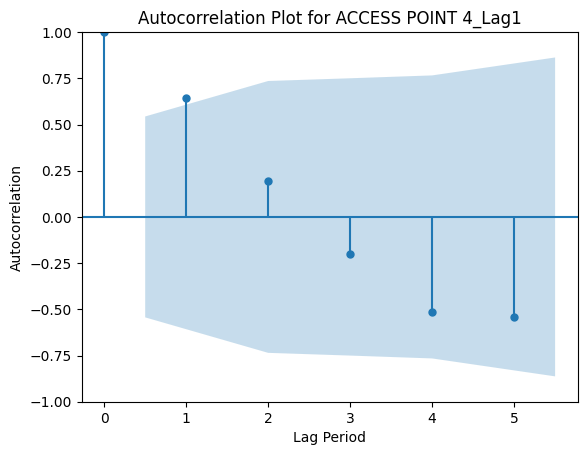

<Figure size 1200x600 with 0 Axes>

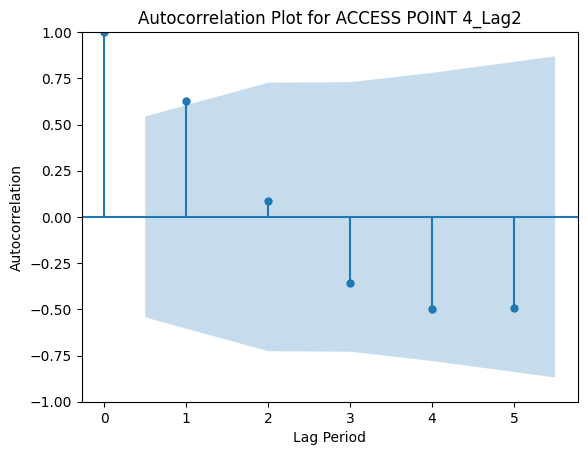

<Figure size 1200x600 with 0 Axes>

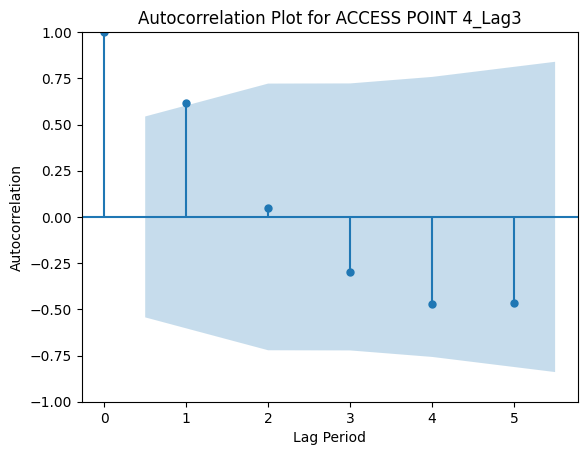

<Figure size 1200x600 with 0 Axes>

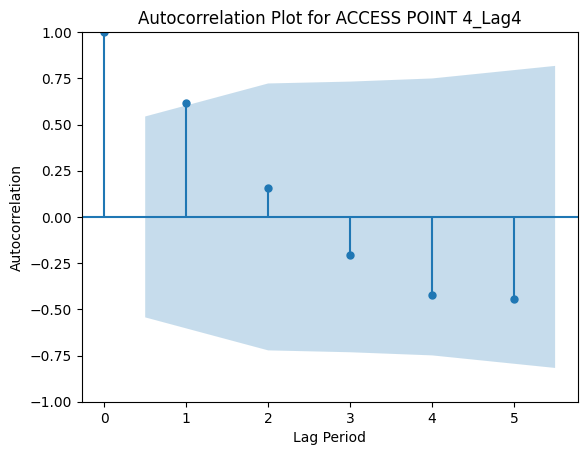

<Figure size 1200x600 with 0 Axes>

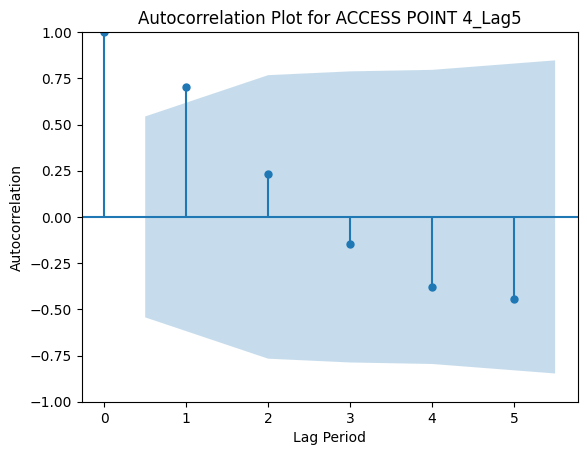

<Figure size 1200x600 with 0 Axes>

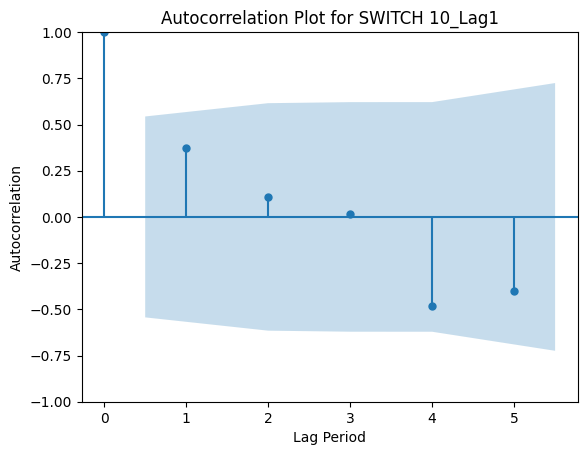

<Figure size 1200x600 with 0 Axes>

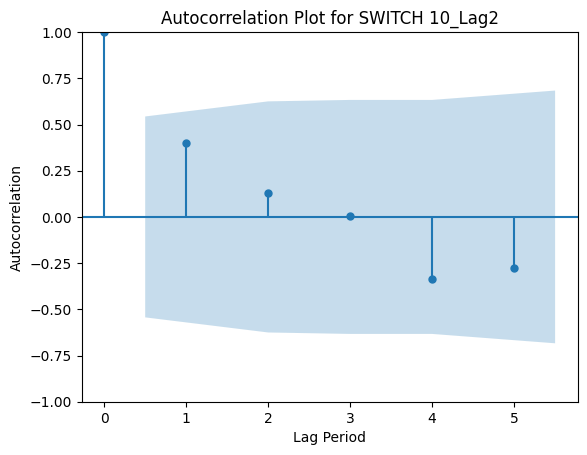

<Figure size 1200x600 with 0 Axes>

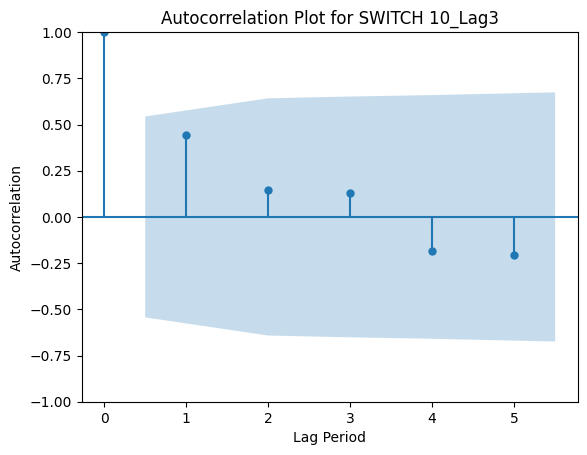

<Figure size 1200x600 with 0 Axes>

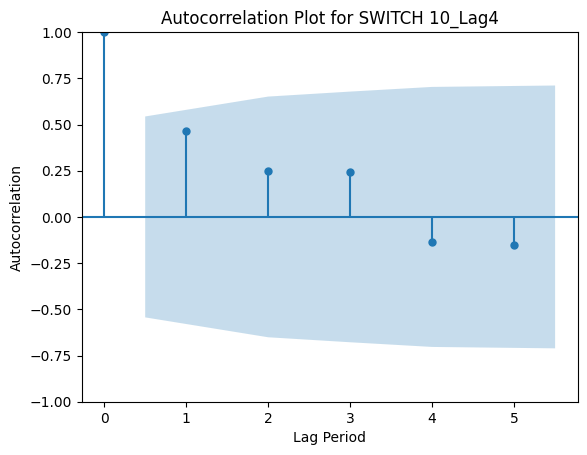

<Figure size 1200x600 with 0 Axes>

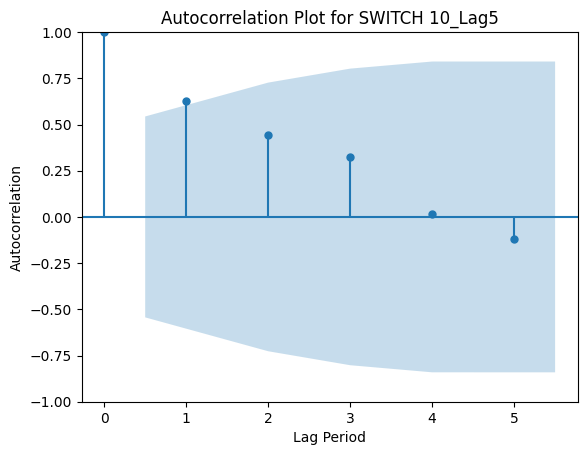

<Figure size 1200x600 with 0 Axes>

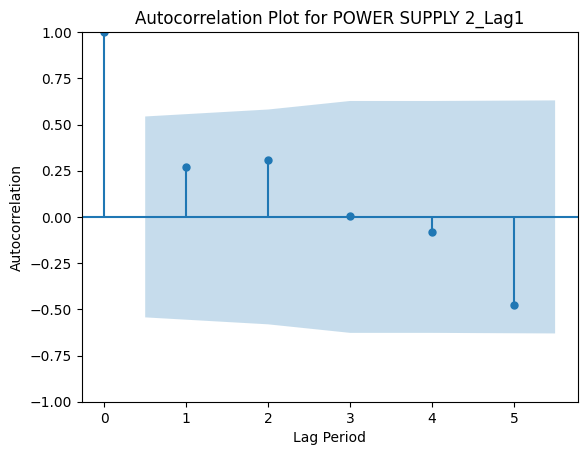

<Figure size 1200x600 with 0 Axes>

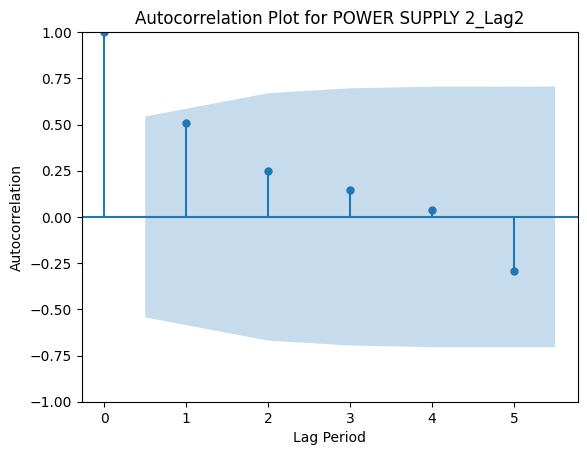

<Figure size 1200x600 with 0 Axes>

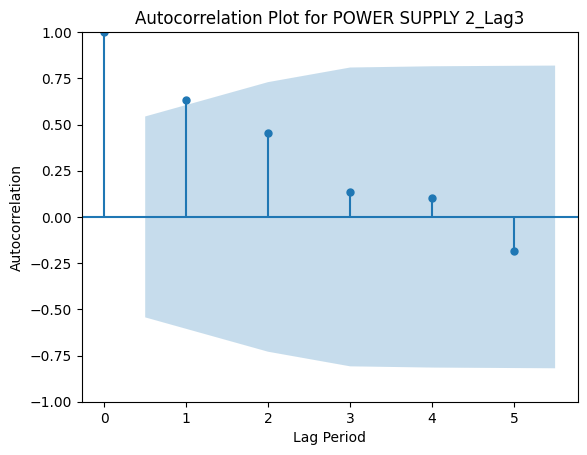

<Figure size 1200x600 with 0 Axes>

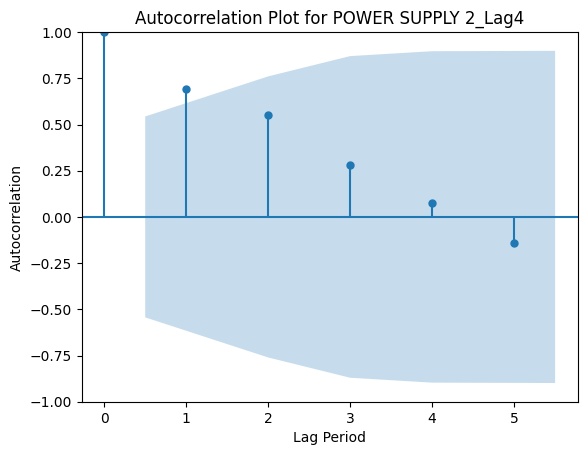

<Figure size 1200x600 with 0 Axes>

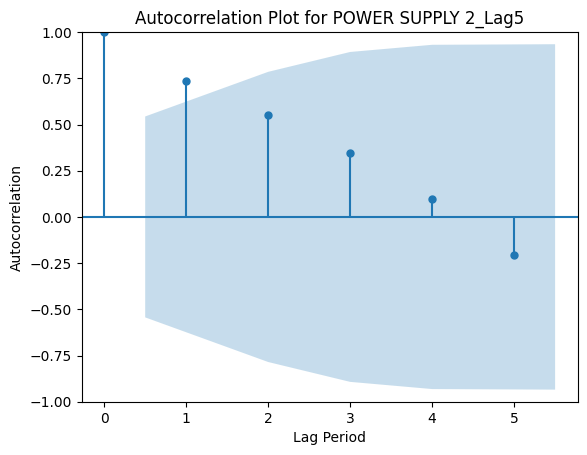

In [144]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# List of products
products = new.columns[1:]

# Iterate over each product
for product in products:
    # Plot ACF for the current product
    plt.figure(figsize=(12, 6))  # Adjust figure size if needed
    plot_acf(scaled_iterative_df[product], lags=lag_periods)
    plt.title(f'Autocorrelation Plot for {product}')
    plt.xlabel('Lag Period')
    plt.ylabel('Autocorrelation')
    plt.show()


Rolling window features

In [145]:
products = new.columns[1:]
window_size = 3

for product in products:
    scaled_iterative_df[f'{product}_Rolling_Mean_Sales'] = scaled_iterative_df[product].rolling(window=window_size, min_periods=1).mean()
    scaled_iterative_df[f'{product}_Rolling_Max_Sales'] = scaled_iterative_df[product].rolling(window=window_size, min_periods=1).max()
    scaled_iterative_df[f'{product}_Rolling_Min_Sales'] = scaled_iterative_df[product].rolling(window=window_size, min_periods=1).min()

    scaled_0_df[f'{product}_Rolling_Mean_Sales'] = scaled_0_df[product].rolling(window=window_size, min_periods=1).mean()
    scaled_0_df[f'{product}_Rolling_Max_Sales'] = scaled_0_df[product].rolling(window=window_size, min_periods=1).max()
    scaled_0_df[f'{product}_Rolling_Min_Sales'] = scaled_0_df[product].rolling(window=window_size, min_periods=1).max()

    scaled_spline_df[f'{product}_Rolling_Mean_Sales'] = scaled_spline_df[product].rolling(window=window_size, min_periods=1).mean()
    scaled_spline_df[f'{product}_Rolling_Max_Sales'] = scaled_spline_df[product].rolling(window=window_size, min_periods=1).max()
    scaled_spline_df[f'{product}_Rolling_Min_Sales'] = scaled_spline_df[product].rolling(window=window_size, min_periods=1).max()

    scaled_linear_df[f'{product}_Rolling_Mean_Sales'] = scaled_linear_df[product].rolling(window=window_size, min_periods=1).mean()
    scaled_linear_df[f'{product}_Rolling_Max_Sales'] = scaled_linear_df[product].rolling(window=window_size, min_periods=1).max()
    scaled_linear_df[f'{product}_Rolling_Min_Sales'] = scaled_linear_df[product].rolling(window=window_size, min_periods=1).max()

# scaled_linear_df.fillna(0, inplace=True)
# scaled_iterative_df.fillna(0, inplace=True)
# scaled_0_df.fillna(0, inplace=True)
# scaled_spline_df.fillna(0, inplace=True)


<ipython-input-145-d9b2cd905df0>:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_iterative_df[f'{product}_Rolling_Min_Sales'] = scaled_iterative_df[product].rolling(window=window_size, min_periods=1).min()
<ipython-input-145-d9b2cd905df0>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_0_df[f'{product}_Rolling_Min_Sales'] = scaled_0_df[product].rolling(window=window_size, min_periods=1).max()
<ipython-input-145-d9b2cd905df0>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of c

In [146]:
scaled_iterative_df

Product Name,Date,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,POWER SUPPLY 2_Lag2_Rolling_Min_Sales,POWER SUPPLY 2_Lag3_Rolling_Mean_Sales,POWER SUPPLY 2_Lag3_Rolling_Max_Sales,POWER SUPPLY 2_Lag3_Rolling_Min_Sales,POWER SUPPLY 2_Lag4_Rolling_Mean_Sales,POWER SUPPLY 2_Lag4_Rolling_Max_Sales,POWER SUPPLY 2_Lag4_Rolling_Min_Sales,POWER SUPPLY 2_Lag5_Rolling_Mean_Sales,POWER SUPPLY 2_Lag5_Rolling_Max_Sales,POWER SUPPLY 2_Lag5_Rolling_Min_Sales
0,2020-05-01,1358.798032,87173.0,577.215461,53890.226348,57788.371896,13432.0,28585.0,115709.0,-42.907976,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
1,2021-08-01,1436.105796,102849.0,1674.100961,49190.758811,55611.640662,12463.0,19686.0,98337.0,-3274.938998,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
2,2021-11-01,385.400614,126375.0,-197.828921,53402.877113,33897.601271,13452.0,44724.0,147681.0,-3274.515136,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
3,2021-02-01,906.000000,128629.0,3651.000000,59889.735110,-41157.636587,14581.0,37781.0,185327.0,177.000000,...,0.0,9426.333333,28279.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0
4,2021-05-01,941.000000,179125.0,10409.000000,44798.615566,-156237.839430,15831.0,31905.0,194170.0,270.000000,...,22704.0,16994.333333,28279.0,0.0,9426.333333,28279.0,0.0,0.000000,0.0,0.0
5,2022-08-01,663.000000,138750.0,10575.000000,72470.504214,-101934.936385,13864.0,37888.0,220386.0,850.000000,...,22704.0,25027.000000,28279.0,22704.0,16994.333333,28279.0,0.0,9426.333333,28279.0,0.0
6,2022-11-01,769.000000,208760.0,17934.000000,9576.000000,-214278.472153,15012.0,32689.0,204604.0,2717.000000,...,24098.0,26087.666667,31461.0,22704.0,25027.000000,28279.0,22704.0,16994.333333,28279.0,0.0
7,2022-02-01,3565.000000,116126.0,15104.000000,46029.000000,-178387.538628,11349.0,30442.0,194538.0,3833.000000,...,31461.0,34189.333333,47009.0,24098.0,26087.666667,31461.0,22704.0,25027.000000,28279.0,22704.0
8,2022-05-01,1020.000000,150803.0,15525.000000,109452.000000,26769.000000,10422.0,27028.0,185160.0,4279.000000,...,35145.0,37871.666667,47009.0,31461.0,34189.333333,47009.0,24098.0,26087.666667,31461.0,22704.0
9,2023-08-01,1670.000000,82163.0,6938.000000,54955.000000,33670.000000,8726.0,21246.0,147284.0,6089.000000,...,34518.0,42710.666667,47009.0,35145.0,37871.666667,47009.0,31461.0,34189.333333,47009.0,24098.0


periodic differences

In [147]:
# Define the number of lag quarters
lag_periods = 5

# Iterate over each lagged feature for each product
for product in columns:
    for i in range(1, lag_periods + 1):
        # Compute the periodic difference for the current lagged feature
        scaled_iterative_df[f'{product}_Lag{i}_Diff'] = scaled_iterative_df[f'{product}_Lag{i}'].diff()
        scaled_spline_df[f'{product}_Lag{i}_Diff'] = scaled_spline_df[f'{product}_Lag{i}'].diff()
        scaled_linear_df[f'{product}_Lag{i}_Diff'] = scaled_linear_df[f'{product}_Lag{i}'].diff()
        scaled_0_df[f'{product}_Lag{i}_Diff'] = scaled_0_df[f'{product}_Lag{i}'].diff()
# Fill NaN values with 0 after computing differences
scaled_iterative_df.fillna(0, inplace=True)
scaled_spline_df.fillna(0,inplace=True)
scaled_linear_df.fillna(0,inplace=True)
scaled_0_df.fillna(0,inplace=True)
scaled_iterative_df.head(10)

<ipython-input-147-dd5bccf18cf9>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_iterative_df[f'{product}_Lag{i}_Diff'] = scaled_iterative_df[f'{product}_Lag{i}'].diff()
<ipython-input-147-dd5bccf18cf9>:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  scaled_spline_df[f'{product}_Lag{i}_Diff'] = scaled_spline_df[f'{product}_Lag{i}'].diff()
<ipython-input-147-dd5bccf18cf9>:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

Product Name,Date,ROUTER 1,TRANSCIEVER,SWITCH 1,ACCESS POINT 1,ACCESS POINT 2,SWITCH 2,SWITCH 3,POWER SUPPLY 1,SWITCH 4,...,SWITCH 10_Lag1_Diff,SWITCH 10_Lag2_Diff,SWITCH 10_Lag3_Diff,SWITCH 10_Lag4_Diff,SWITCH 10_Lag5_Diff,POWER SUPPLY 2_Lag1_Diff,POWER SUPPLY 2_Lag2_Diff,POWER SUPPLY 2_Lag3_Diff,POWER SUPPLY 2_Lag4_Diff,POWER SUPPLY 2_Lag5_Diff
0,2020-05-01,1358.798032,87173.0,577.215461,53890.226348,57788.371896,13432.0,28585.0,115709.0,-42.907976,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,2021-08-01,1436.105796,102849.0,1674.100961,49190.758811,55611.640662,12463.0,19686.0,98337.0,-3274.938998,...,21370.851021,0.000000,0.000000,0.000000,0.000000,28279.0,0.0,0.0,0.0,0.0
2,2021-11-01,385.400614,126375.0,-197.828921,53402.877113,33897.601271,13452.0,44724.0,147681.0,-3274.515136,...,7949.421388,21370.851021,0.000000,0.000000,0.000000,-5575.0,28279.0,0.0,0.0,0.0
3,2021-02-01,906.000000,128629.0,3651.000000,59889.735110,-41157.636587,14581.0,37781.0,185327.0,177.000000,...,-12106.916134,7949.421388,21370.851021,0.000000,0.000000,1394.0,-5575.0,28279.0,0.0,0.0
4,2021-05-01,941.000000,179125.0,10409.000000,44798.615566,-156237.839430,15831.0,31905.0,194170.0,270.000000,...,21549.645542,-12106.916134,7949.421388,21370.851021,0.000000,7363.0,1394.0,-5575.0,28279.0,0.0
5,2022-08-01,663.000000,138750.0,10575.000000,72470.504214,-101934.936385,13864.0,37888.0,220386.0,850.000000,...,52824.313499,21549.645542,-12106.916134,7949.421388,21370.851021,15548.0,7363.0,1394.0,-5575.0,28279.0
6,2022-11-01,769.000000,208760.0,17934.000000,9576.000000,-214278.472153,15012.0,32689.0,204604.0,2717.000000,...,-40040.277358,52824.313499,21549.645542,-12106.916134,7949.421388,-11864.0,15548.0,7363.0,1394.0,-5575.0
7,2022-02-01,3565.000000,116126.0,15104.000000,46029.000000,-178387.538628,11349.0,30442.0,194538.0,3833.000000,...,70152.600682,-40040.277358,52824.313499,21549.645542,-12106.916134,10833.0,-11864.0,15548.0,7363.0,1394.0
8,2022-05-01,1020.000000,150803.0,15525.000000,109452.000000,26769.000000,10422.0,27028.0,185160.0,4279.000000,...,-21337.472180,70152.600682,-40040.277358,52824.313499,21549.645542,-11460.0,10833.0,-11864.0,15548.0,7363.0
9,2023-08-01,1670.000000,82163.0,6938.000000,54955.000000,33670.000000,8726.0,21246.0,147284.0,6089.000000,...,-99135.166459,-21337.472180,70152.600682,-40040.277358,52824.313499,6087.0,-11460.0,10833.0,-11864.0,15548.0


MODELS

PROPHET

In [148]:
# ! pip install fbprophet

In [149]:
# # on iterative imputed dataset
# new['Date'] = pd.to_datetime(new['Date'])
# new

In [150]:
!python -m pip install prophet

In [151]:
# from prophet import Prophet
# # Loop over each product column (excluding 'Date')
# for product_column in new.columns[1:]:
#     # Select 'Date' and the current product column
#     product_df = new[['Date', product_column]].rename(columns={'Date': 'ds', product_column: 'y'})

#     # Drop any rows with missing values
#     product_df.dropna(inplace=True)

#     # Ensure no negative values in the 'y' column
#     product_df = product_df[product_df['y'] >= 0]

#     # Initialize and fit the Prophet model
#     model = Prophet()
#     model.fit(product_df)

#     # Create future dates for forecasting
#     future_dates = model.make_future_dataframe(periods=4, freq='Q') # making predictions at a frequency of one quarter

#     # Make forecasts
#     forecast = model.predict(future_dates)

#     # Store the forecast results in a separate DataFrame or data structure
#     # You can print, save, or perform further analysis on the forecast data
#     print(f'Forecast for {product_column}:')
#     print('\n')
#     forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]  # Print the last 5 forecasted values
#     print('\n')

In [152]:
len(transposed.columns[1:])

20

In [153]:
print(scaled_iterative_df.columns)

Index(['Date', 'ROUTER 1', 'TRANSCIEVER', 'SWITCH 1', 'ACCESS POINT 1',
       'ACCESS POINT 2', 'SWITCH 2', 'SWITCH 3', 'POWER SUPPLY 1', 'SWITCH 4',
       ...
       'SWITCH 10_Lag1_Diff', 'SWITCH 10_Lag2_Diff', 'SWITCH 10_Lag3_Diff',
       'SWITCH 10_Lag4_Diff', 'SWITCH 10_Lag5_Diff',
       'POWER SUPPLY 2_Lag1_Diff', 'POWER SUPPLY 2_Lag2_Diff',
       'POWER SUPPLY 2_Lag3_Diff', 'POWER SUPPLY 2_Lag4_Diff',
       'POWER SUPPLY 2_Lag5_Diff'],
      dtype='object', name='Product Name', length=581)


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zgp_b2r3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qhz2ka47.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79518', 'data', 'file=/tmp/tmpm_95a39v/zgp_b2r3.json', 'init=/tmp/tmpm_95a39v/qhz2ka47.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelntgk3__a/prophet_model-20240221172734.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


product:  ROUTER 1


17:27:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ar5mphaf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/9avw04go.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88838', 'data', 'file=/tmp/tmpm_95a39v/ar5mphaf.json', 'init=/tmp/tmpm_95a39v/9avw04go.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelypa1e2wf/prophet_model-20240221172734.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/22tlrns6.json
DEBUG:cmdstanpy:input tempfile

product:  TRANSCIEVER


17:27:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/23d3oi2z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zx4f6zm2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62098', 'data', 'file=/tmp/tmpm_95a39v/23d3oi2z.json', 'init=/tmp/tmpm_95a39v/zx4f6zm2.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelwd5qwo_i/prophet_model-20240221172735.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/cp_4y3po.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 1


17:27:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/pa71ekhk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8h83w9mb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74092', 'data', 'file=/tmp/tmpm_95a39v/pa71ekhk.json', 'init=/tmp/tmpm_95a39v/8h83w9mb.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model_l08ezvx/prophet_model-20240221172737.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/iyuij1xq.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 1


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/7sh51hk0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/5gv4mvge.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60266', 'data', 'file=/tmp/tmpm_95a39v/7sh51hk0.json', 'init=/tmp/tmpm_95a39v/5gv4mvge.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model3b6u53bp/prophet_model-20240221172737.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/rimv0vk4.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 2


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/mo39dq41.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8i5k_mo6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7348', 'data', 'file=/tmp/tmpm_95a39v/mo39dq41.json', 'init=/tmp/tmpm_95a39v/8i5k_mo6.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelxx3d5_kg/prophet_model-20240221172738.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/uo3dvegi.json
DEBUG:cmdstanpy:input tempfile:

product:  SWITCH 2


17:27:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/yyl7b6bd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/trotgmux.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17204', 'data', 'file=/tmp/tmpm_95a39v/yyl7b6bd.json', 'init=/tmp/tmpm_95a39v/trotgmux.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model36exa9l0/prophet_model-20240221172739.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/htk4y628.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 3


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/cvxkzdyj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/kf6atjcc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74174', 'data', 'file=/tmp/tmpm_95a39v/cvxkzdyj.json', 'init=/tmp/tmpm_95a39v/kf6atjcc.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model7m5c_3j9/prophet_model-20240221172740.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ub_n8dzi.json
DEBUG:cmdstanpy:input tempfile

product:  POWER SUPPLY 1


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/agfbumfy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/tzhrkwpm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15399', 'data', 'file=/tmp/tmpm_95a39v/agfbumfy.json', 'init=/tmp/tmpm_95a39v/tzhrkwpm.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model4klpx7g1/prophet_model-20240221172740.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/c9i_1yfu.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 4


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zj39rmy6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/mfv76fwx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23949', 'data', 'file=/tmp/tmpm_95a39v/zj39rmy6.json', 'init=/tmp/tmpm_95a39v/mfv76fwx.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model6hi8pstu/prophet_model-20240221172741.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/yosi7h1i.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 5


17:27:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/vpdz11en.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/a1k0ts45.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95439', 'data', 'file=/tmp/tmpm_95a39v/vpdz11en.json', 'init=/tmp/tmpm_95a39v/a1k0ts45.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model8p_5g17a/prophet_model-20240221172742.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ipcjmhby.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 6


17:27:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bjtrhyec.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/13q6t5c8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68357', 'data', 'file=/tmp/tmpm_95a39v/bjtrhyec.json', 'init=/tmp/tmpm_95a39v/13q6t5c8.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelidym7rw7/prophet_model-20240221172743.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/tj0kpi3p.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 3


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/go9n9s1z.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/d47amynt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9839', 'data', 'file=/tmp/tmpm_95a39v/go9n9s1z.json', 'init=/tmp/tmpm_95a39v/d47amynt.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model4ky_qd7g/prophet_model-20240221172744.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qs4dhbf_.json
DEBUG:cmdstanpy:input tempfile:

product:  SUPERVISOR ENGINE


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1s25g9b2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/jwry8_3x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28093', 'data', 'file=/tmp/tmpm_95a39v/1s25g9b2.json', 'init=/tmp/tmpm_95a39v/jwry8_3x.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelfgu3bbxz/prophet_model-20240221172744.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/3cayd0s4.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 7


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/byyj9h0k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/y6lora6l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96506', 'data', 'file=/tmp/tmpm_95a39v/byyj9h0k.json', 'init=/tmp/tmpm_95a39v/y6lora6l.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_models88t7v1l/prophet_model-20240221172745.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bxy9a_7j.json
DEBUG:cmdstanpy:input tempfile

product:  WIRELESS CONTROLLER


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/_ea3savg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/lmfevhfa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=836', 'data', 'file=/tmp/tmpm_95a39v/_ea3savg.json', 'init=/tmp/tmpm_95a39v/lmfevhfa.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model7ir35fm5/prophet_model-20240221172746.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/xuzpvtr7.json
DEBUG:cmdstanpy:input tempfile: 

product:  SWITCH 8


17:27:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/srg2__7l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bucsae18.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61664', 'data', 'file=/tmp/tmpm_95a39v/srg2__7l.json', 'init=/tmp/tmpm_95a39v/bucsae18.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelvdr9etxs/prophet_model-20240221172746.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


product:  SWITCH 9


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/04qvybis.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/f60pb72p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52267', 'data', 'file=/tmp/tmpm_95a39v/04qvybis.json', 'init=/tmp/tmpm_95a39v/f60pb72p.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelsnl4306y/prophet_model-20240221172748.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/83hf59_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/c9qqt2gx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40979', 'data', 'file=/tmp/tmpm_95a39v/83hf59_2.json', 'init=/tmp/tmpm_95a39v/c9qqt2gx.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model6lx1mxg0/prophet_model-20240221172749.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/td5aeyl0.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 4


17:27:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/k546vk52.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/aqi_nmo8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44114', 'data', 'file=/tmp/tmpm_95a39v/k546vk52.json', 'init=/tmp/tmpm_95a39v/aqi_nmo8.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelw2vk6p4u/prophet_model-20240221172750.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/lsg4bros.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 10


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/2q67408i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/mssb753p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68323', 'data', 'file=/tmp/tmpm_95a39v/2q67408i.json', 'init=/tmp/tmpm_95a39v/mssb753p.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeljldgwl2g/prophet_model-20240221172750.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/i4dwwfds.json
DEBUG:cmdstanpy:input tempfile

product:  POWER SUPPLY 2


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/2vn5k2m1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/6u9ih3ek.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30200', 'data', 'file=/tmp/tmpm_95a39v/2vn5k2m1.json', 'init=/tmp/tmpm_95a39v/6u9ih3ek.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeldqi22a7u/prophet_model-20240221172751.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Overall RMSE: 106751.13680641816


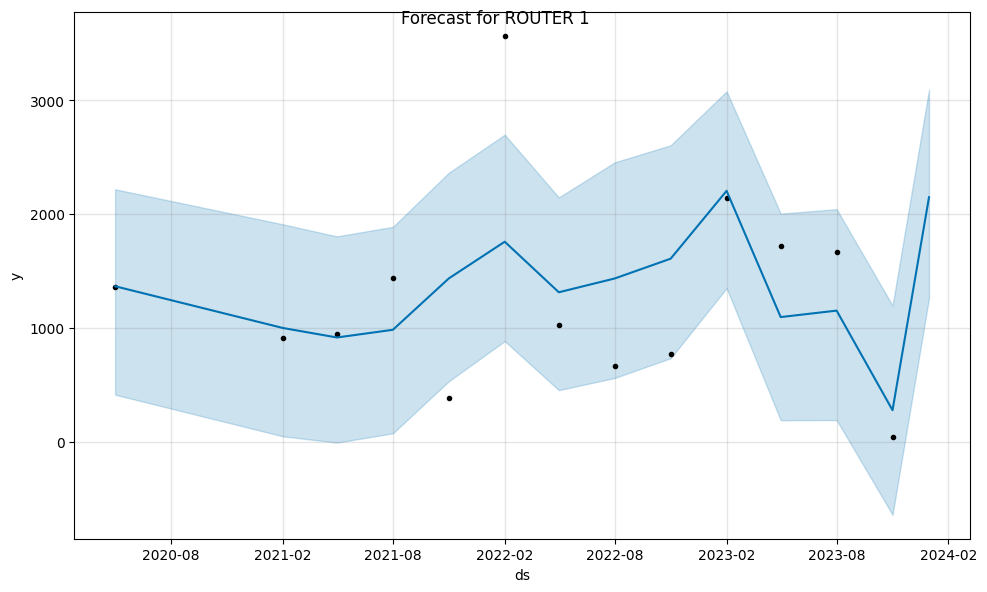

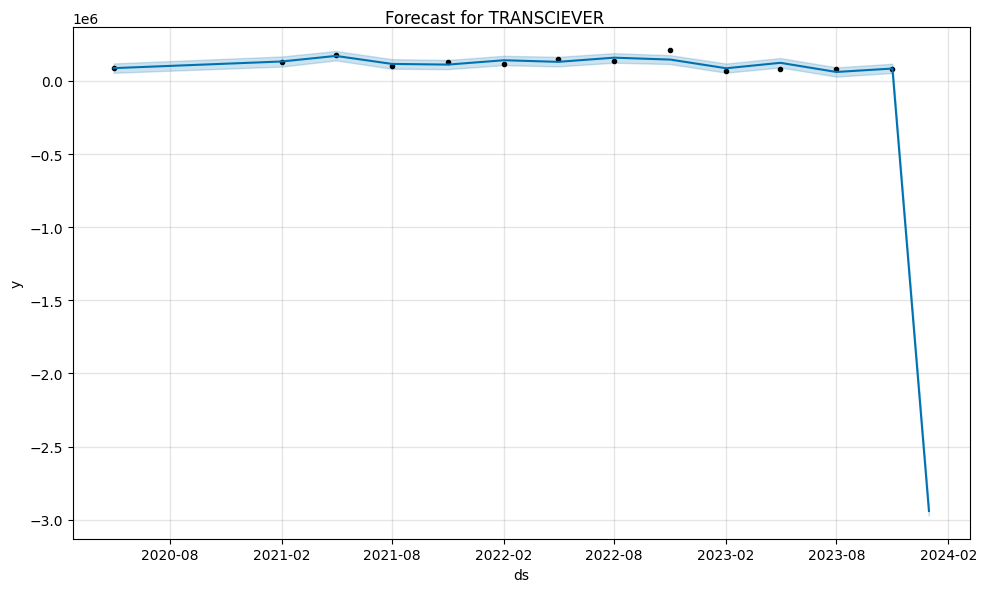

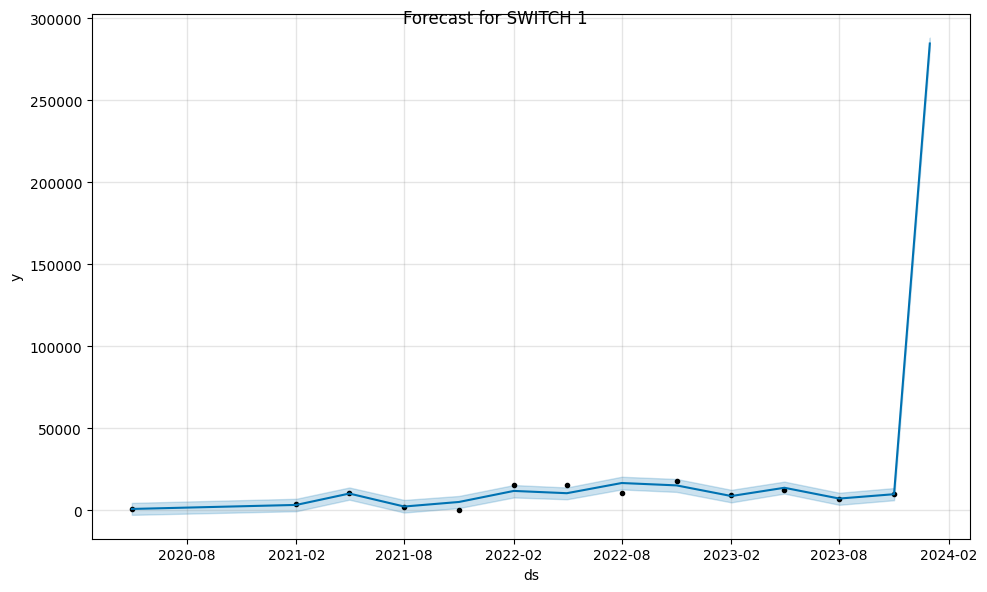

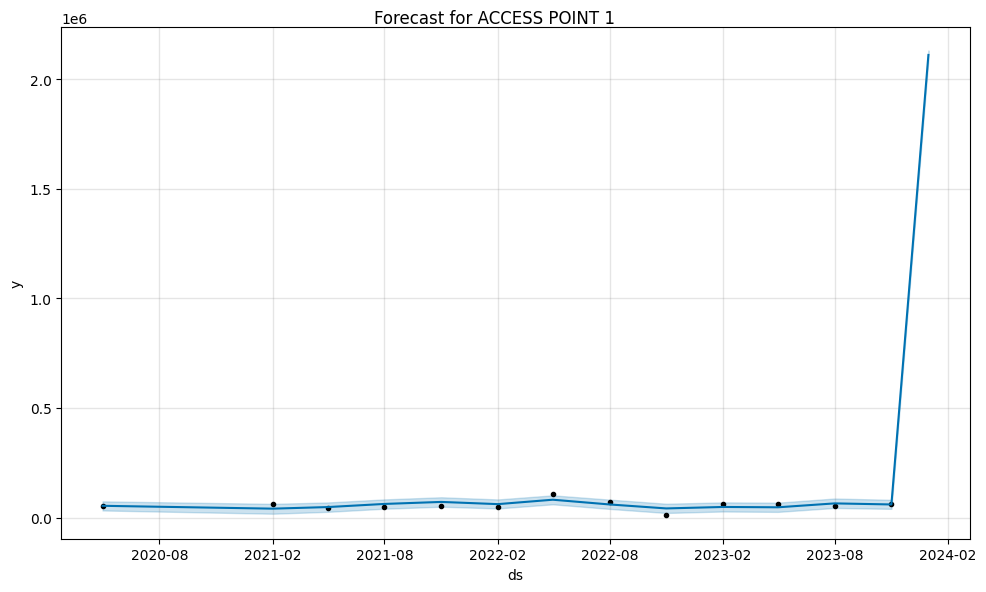

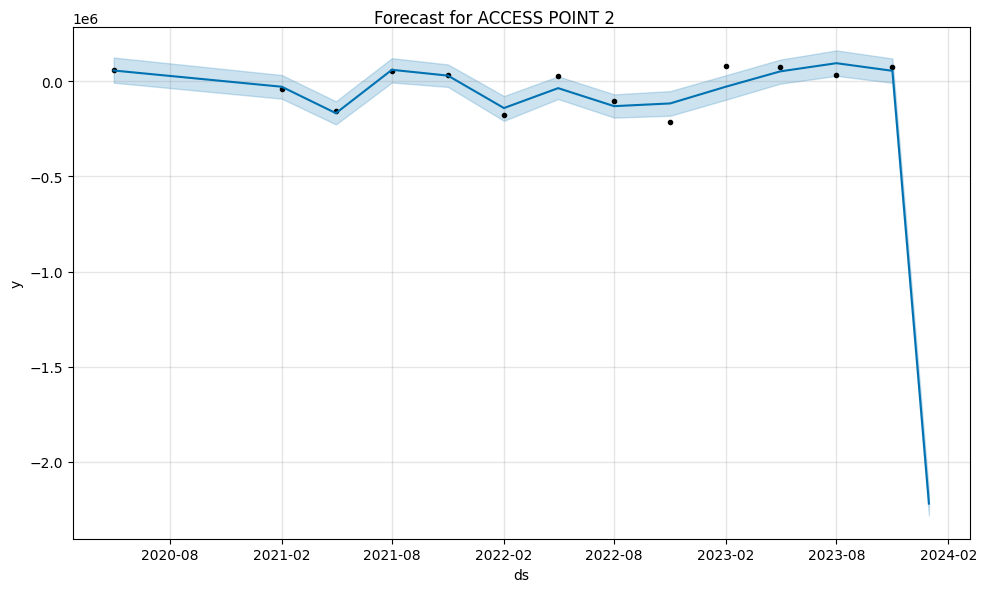

...

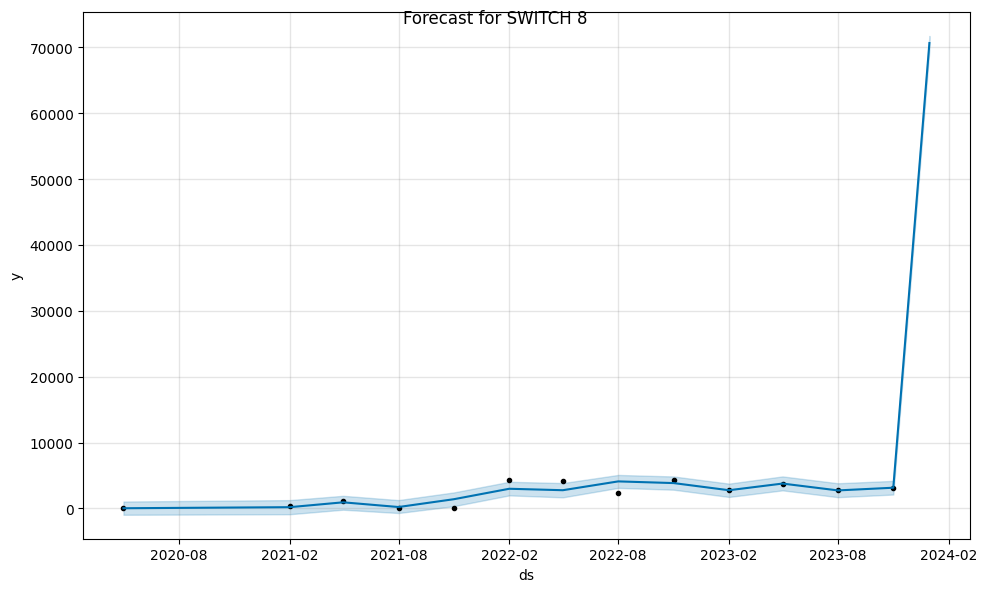

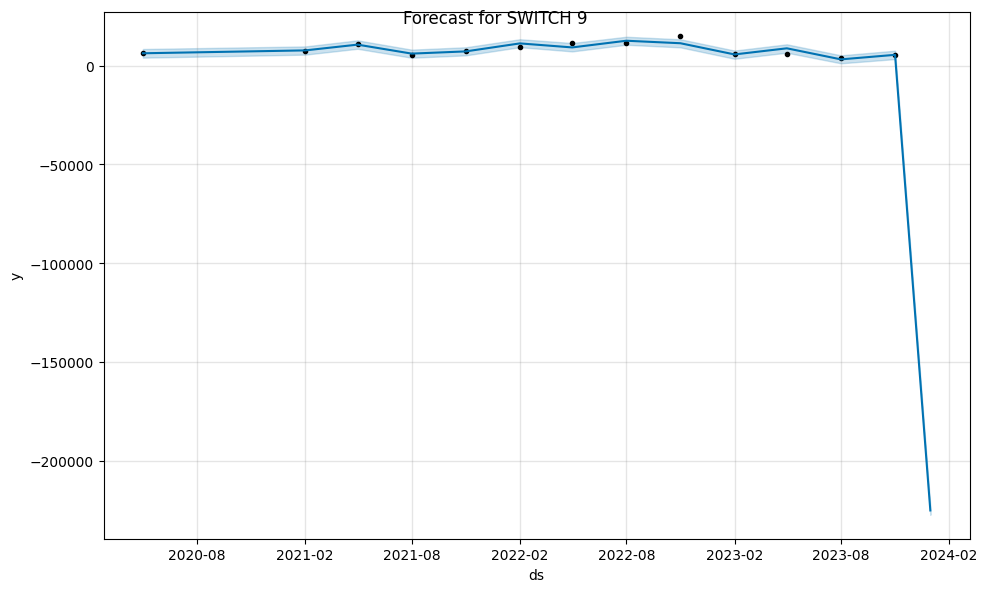

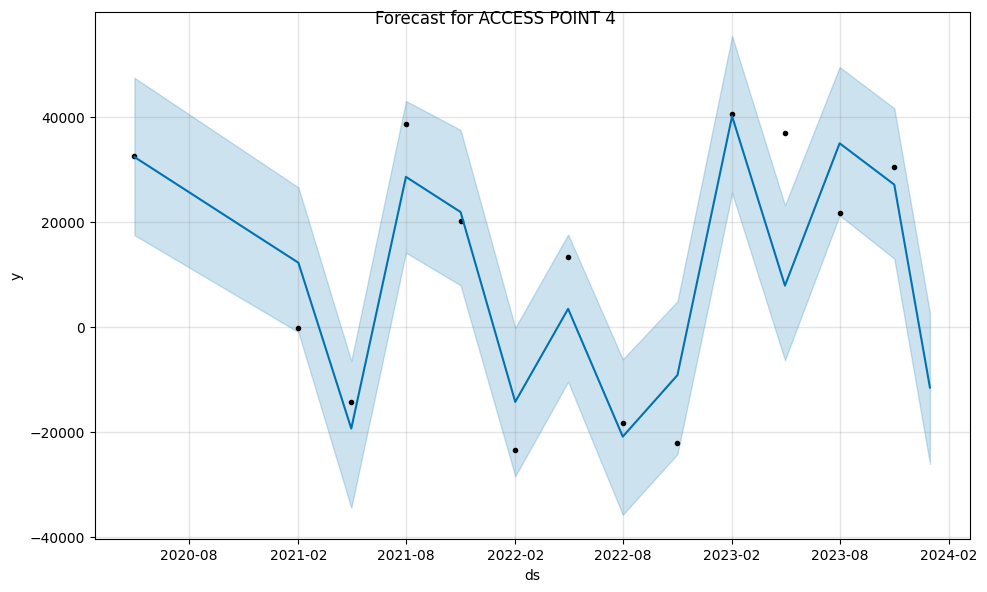

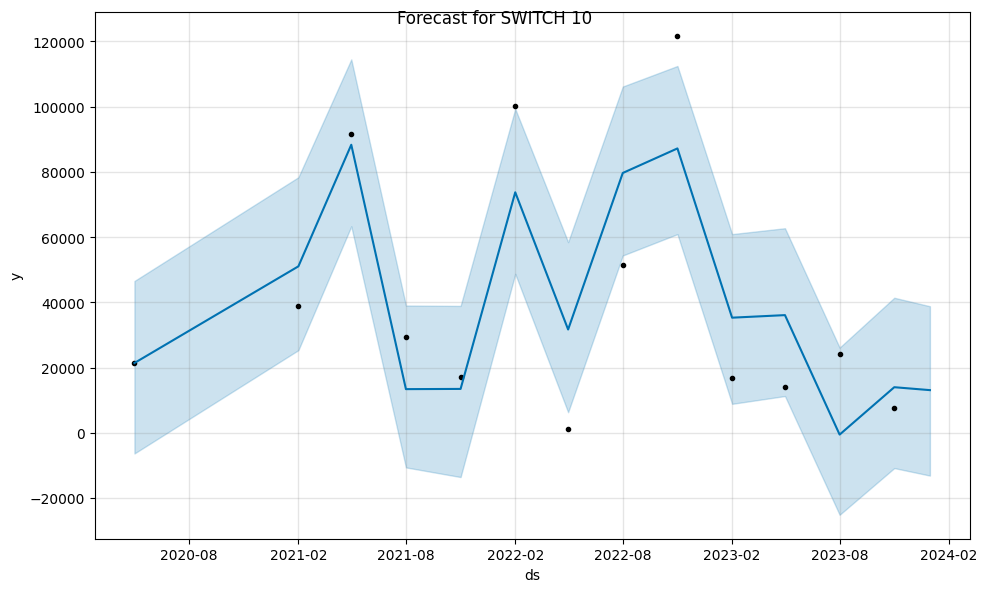

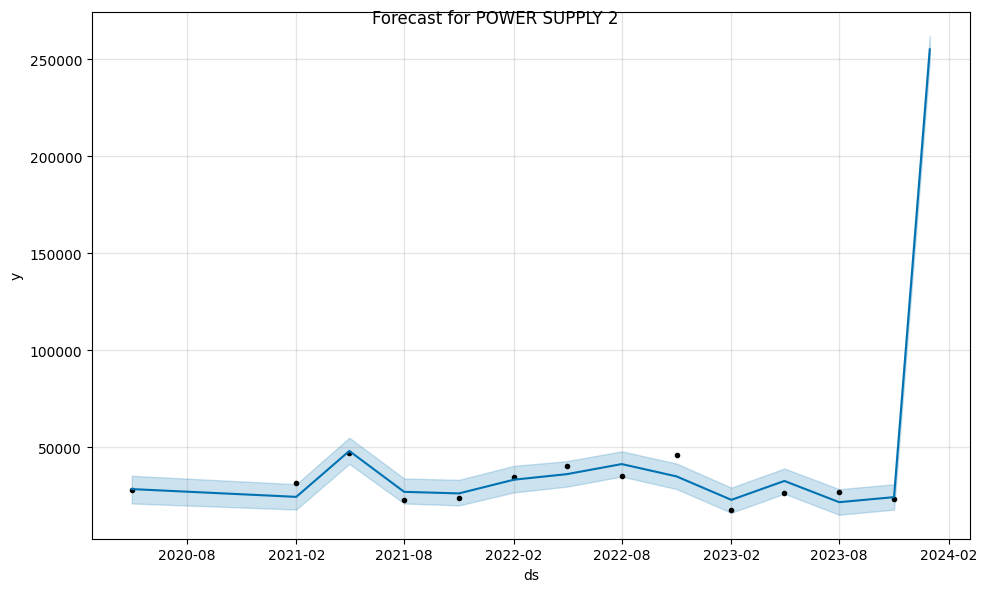

In [159]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
import numpy as np

columns = transposed.columns[1:]
overall_iterative_rmse = []

# Loop through each product column
for product in columns:
    print('product: ', product)
    # Prepare DataFrame for the current product
    product_df = scaled_iterative_df[['Date', product]].rename(columns={'Date': 'ds', product: 'y'})

    # Instantiate Prophet model with adjusted parameters
    model = Prophet(
        seasonality_mode='multiplicative',     # Adjust seasonality mode if needed
        changepoint_prior_scale=0.05,           # Adjust changepoint prior scale if needed
        holidays_prior_scale=10,                # Adjust holidays prior scale if needed
        yearly_seasonality=False,               # Disable yearly seasonality
        weekly_seasonality=False,               # Disable weekly seasonality
        daily_seasonality=False                # Disable daily seasonality
    )

    # Add customized seasonality with reduced Fourier order
    model.add_seasonality(name='quarterly', period=90, fourier_order=5)  # Adjust period and Fourier order as needed

    # Add relevant lag and rolling window features as regressors to the Prophet model for the current product
    for feature in columns:
        if product in feature:
            if product != feature:
                if product == 'SWITCH 1' and feature == 'SWITCH 10':
                    continue
                else:
                    print(feature)
                    product_df[feature] = scaled_iterative_df[feature]
                    model.add_regressor(feature)

    # Fit Prophet model
    model.fit(product_df)

    # Handle outliers and anomalies
    # You can identify and handle outliers here before performing cross-validation
    # For example, you can remove outliers or replace them with more reasonable values

    # Perform cross-validation
    initial_period = 2 * 365  # Set initial period to cover at least 3 years of data
    cv_period = 365            # 1 year
    cv_horizon = 365           # 1 year
    df_cv = cross_validation(model, initial=f'{initial_period} days', period=f'{cv_period} days', horizon=f'{cv_horizon} days')

    # Compute performance metrics
    df_metrics = performance_metrics(df_cv)

    # Print the performance metrics
    #print(df_metrics)

    # Append RMSE to overall list
    overall_iterative_rmse.append(df_metrics['rmse'].values[0])

    # Make future predictions
    future = model.make_future_dataframe(periods=1, freq='Q')  # Adjust periods as needed
    forecast = model.predict(future)

    # Visualize forecast
    fig = model.plot(forecast)
    fig.suptitle(f'Forecast for {product}')
    # plt.show()
    #print('FORECAST:', forecast )

# Calculate overall RMSE
overall_rmse_it = np.mean(overall_iterative_rmse)
print("Overall RMSE:", overall_rmse_it)


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/a5ks780r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/r0gixpja.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39660', 'data', 'file=/tmp/tmpm_95a39v/a5ks780r.json', 'init=/tmp/tmpm_95a39v/r0gixpja.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model2et3_n88/prophet_model-20240221173325.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


product:  ROUTER 1


17:33:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/2eng53gs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/t8dgfk9y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58831', 'data', 'file=/tmp/tmpm_95a39v/2eng53gs.json', 'init=/tmp/tmpm_95a39v/t8dgfk9y.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelugbjsjx7/prophet_model-20240221173325.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.


FORECAST:            ds         trend   yhat_lower   yhat_upper   trend_lower  \
0  2020-05-01  13557.124600  -886.587584   840.456322  13557.124600   
1  2021-02-01  10646.031561  -488.291947  1285.109187  10646.031561   
2  2021-05-01   9707.309531   196.546966  2079.386206   9707.309531   
3  2021-08-01   8736.945184  -754.647374  1029.599893   8736.945184   
4  2021-11-01   7766.580838    27.874572  1795.140051   7766.580838   
5  2022-02-01   6796.216492   908.284008  2702.360822   6796.216492   
6  2022-05-01   5857.494461   275.804649  2019.040476   5857.494461   
7  2022-08-01   4887.130115   642.064113  2360.532063   4887.130115   
8  2022-11-01   3916.765769   655.879506  2405.352611   3916.765769   
9  2023-02-01   2946.401422  1286.868665  3064.813488   2946.401422   
10 2023-05-01   2007.679392   164.942482  1837.075868   2007.679392   
11 2023-08-01   1037.315045   401.283230  2142.975476   1037.315045   
12 2023-11-01     66.950699  -691.595132  1106.836668     66.950699

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hip9x1fp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/e07vwaqt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21633', 'data', 'file=/tmp/tmpm_95a39v/hip9x1fp.json', 'init=/tmp/tmpm_95a39v/e07vwaqt.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelpx9n33oh/prophet_model-20240221173327.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/0a88p8uc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/tpnzl2_d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99565', 'data', 'file=/tmp/tmpm_95a39v/0a88p8uc.json', 'init=/tmp/tmpm_95a39v/tpnzl2_d.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modele_h_7b4y/prophet_model-20240221173328.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/9h7i8cd9.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds          trend    yhat_lower    yhat_upper    trend_lower  \
0  2020-05-01  322292.038400  5.601909e+04  1.182082e+05  322292.038400   
1  2021-02-01  355159.929668  1.024957e+05  1.649092e+05  355159.929668   
2  2021-05-01  365758.633734  1.399524e+05  2.022560e+05  365758.633734   
3  2021-08-01  376714.597485  8.526602e+04  1.476044e+05  376714.597485   
4  2021-11-01  387670.561235  7.989933e+04  1.455905e+05  387670.561235   
5  2022-02-01  398626.524989  1.085485e+05  1.734712e+05  398626.524989   
6  2022-05-01  409225.229047  1.033298e+05  1.631281e+05  409225.229047   
7  2022-08-01  420181.192793  1.278452e+05  1.933847e+05  420181.192793   
8  2022-11-01  431137.156541  1.151302e+05  1.784737e+05  431137.156541   
9  2023-02-01  442093.120290  5.434793e+04  1.164571e+05  442093.120290   
10 2023-05-01  452691.824351  9.197082e+04  1.573281e+05  452691.824351   
11 2023-08-01  463647.788099  3.010115e+04  9.295061e+04  463647.788099   
12 2023-11-01  

17:33:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/j_rexbrg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ydvkilnn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77039', 'data', 'file=/tmp/tmpm_95a39v/j_rexbrg.json', 'init=/tmp/tmpm_95a39v/ydvkilnn.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelh2u2z84e/prophet_model-20240221173331.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/xewblnee.json


FORECAST:            ds         trend     yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01     10.869295   -3768.394436    3862.996810     10.869295   
1  2021-02-01  13853.623314   -1078.650403    6394.189613  13853.623314   
2  2021-05-01  18317.409935    6040.605482   13600.552067  18317.409935   
3  2021-08-01  22931.661274   -2510.099364    4676.392201  22931.661274   
4  2021-11-01  27545.912612     770.898722    8128.364037  27545.912612   
5  2022-02-01  32160.163950    8064.968269   15554.399847  32160.163950   
6  2022-05-01  36623.950571    6399.530283   14154.531023  36623.950571   
7  2022-08-01  41238.201908   12975.442724   20314.962085  41238.201908   
8  2022-11-01  45852.453246   11268.213625   18521.892842  45852.453246   
9  2023-02-01  50466.704585    4827.274705   12389.870550  50466.704585   
10 2023-05-01  54930.491207    9818.315443   17054.176445  54930.491207   
11 2023-08-01  59544.742547    3473.189599   10660.011823  59544.742547   
12 2023-11-01  

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ywqex91n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95937', 'data', 'file=/tmp/tmpm_95a39v/xewblnee.json', 'init=/tmp/tmpm_95a39v/ywqex91n.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model3ncpd9lx/prophet_model-20240221173332.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/l58qlxnk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/m3rgqw5c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51062', 'data', 'file=/tmp/tmpm_95a39v/l58qlxnk.json', 'init=/tmp/tmpm_95a39v/m3rgqw5c.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelolz9xv4q/prophet_model-20240221173333.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.


FORECAST:            ds          trend    yhat_lower    yhat_upper    trend_lower  \
0  2020-05-01 -126446.612040 -3.061305e+04  3.029447e+04 -126446.612040   
1  2021-02-01  -40722.251576 -4.080883e+04  1.970944e+04  -40722.251576   
2  2021-05-01  -13079.251278 -3.061237e+04  2.960903e+04  -13079.251278   
3  2021-08-01   15495.535590 -2.282974e+04  3.880253e+04   15495.535590   
4  2021-11-01   44070.322413  9.135313e+01  6.004447e+04   44070.322413   
5  2022-02-01   72645.109223  5.967514e+03  6.402749e+04   72645.109223   
6  2022-05-01  100288.109478  3.059338e+04  9.034127e+04  100288.109478   
7  2022-08-01  128862.896289  1.251829e+04  7.129121e+04  128862.896289   
8  2022-11-01  157437.683142 -2.056792e+03  5.518289e+04  157437.683142   
9  2023-02-01  186012.470007  1.470907e+04  7.528722e+04  186012.470007   
10 2023-05-01  213655.470357  8.139106e+03  6.733481e+04  213655.470357   
11 2023-08-01  242230.257235  4.653593e+04  1.033946e+05  242230.257235   
12 2023-11-01  

DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hr4ua4m0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/3o70y3k7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12605', 'data', 'file=/tmp/tmpm_95a39v/hr4ua4m0.json', 'init=/tmp/tmpm_95a39v/3o70y3k7.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modellyhigdfr/prophet_model-20240221173334.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/7i00_ijj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/dy194b36.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75076', 'data', 'file=/tmp/tmpm_95a39v/7i00_ijj.json', 'init=/tmp/tmpm_95a39v/dy194b36.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeligdyyga0/prophet_model-20240221173335.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bogqjs2w.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend    yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01     89.013307 -23595.977374   24899.988262     89.013307   
1  2021-02-01  18272.015257 -23561.520879   26546.244067  18272.015257   
2  2021-05-01  24135.374896 -23229.203719   22583.371699  24135.374896   
3  2021-08-01  30196.375690 -20363.223719   28901.217489  30196.375690   
4  2021-11-01  36257.376254 -20026.792431   27608.778528  36257.376254   
5  2022-02-01  42318.376615 -15736.250358   28116.198167  42318.376615   
6  2022-05-01  48181.735134 -17550.213488   28169.294121  48181.735134   
7  2022-08-01  54242.735425 -11987.475812   34817.086575  54242.735425   
8  2022-11-01  60303.735675   4991.399960   54023.860970  60303.735675   
9  2023-02-01  66364.735446  27603.703518   75903.421214  66364.735446   
10 2023-05-01  72228.093454  20491.980588   70599.242762  72228.093454   
11 2023-08-01  78289.092743  42101.955305   88565.556566  78289.092743   
12 2023-11-01  84350.092031 

17:33:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/eajnchxo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4o974aa_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20148', 'data', 'file=/tmp/tmpm_95a39v/eajnchxo.json', 'init=/tmp/tmpm_95a39v/4o974aa_.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelh5coloee/prophet_model-20240221173336.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/u20n3h39.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend    yhat_lower    yhat_upper   trend_lower  \
0  2020-05-01  32494.077360  11914.648591  14964.908456  32494.077360   
1  2021-02-01  29438.783826  13037.670267  16180.115768  29438.783826   
2  2021-05-01  28453.562362  14435.827442  17558.300652  28453.562362   
3  2021-08-01  27435.131181  10867.873429  14085.167524  27435.131181   
4  2021-11-01  26416.700000   9972.489565  13370.212345  26416.700000   
5  2022-02-01  25398.268812  11494.944959  14793.449393  25398.268812   
6  2022-05-01  24413.047330  10046.896398  13390.622221  24413.047330   
7  2022-08-01  23394.616140  11376.282228  14708.638824  23394.616140   
8  2022-11-01  22376.184942  10773.166424  14112.534179  22376.184942   
9  2023-02-01  21357.753739   8028.595608  11119.478410  21357.753739   
10 2023-05-01  20372.532250   8707.891547  11788.256562  20372.532250   
11 2023-08-01  19354.101047   6486.460850   9606.613476  19354.101047   
12 2023-11-01  18335.669845   8478.796900

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4zggi1bd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/nn0ljdsj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73750', 'data', 'file=/tmp/tmpm_95a39v/4zggi1bd.json', 'init=/tmp/tmpm_95a39v/nn0ljdsj.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelae7ezxdu/prophet_model-20240221173336.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/668pc9ez.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend     yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01  80042.990040   20866.995596   37497.824872  80042.990040   
1  2021-02-01  68615.735989   24140.093624   41182.513063  68615.735989   
2  2021-05-01  64930.860585   24612.695609   40392.752583  64930.860585   
3  2021-08-01  61121.775902   20972.358722   36487.314853  61121.775902   
4  2021-11-01  57312.691218   25400.864239   42266.321220  57312.691218   
5  2022-02-01  53503.606530   29359.607765   45654.411537  53503.606530   
6  2022-05-01  49818.731128   24712.468506   40661.910080  49818.731128   
7  2022-08-01  46009.646442   24482.949180   41443.394913  46009.646442   
8  2022-11-01  42200.561754   18220.102289   34277.321675  42200.561754   
9  2023-02-01  38391.477067    9181.468448   26111.866897  38391.477067   
10 2023-05-01  34706.601665   10514.039992   26750.695008  34706.601665   
11 2023-08-01  30897.516979    6282.685964   22671.033580  30897.516979   
12 2023-11-01  

17:33:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/10w6seuj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/jn2n8yr5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81518', 'data', 'file=/tmp/tmpm_95a39v/10w6seuj.json', 'init=/tmp/tmpm_95a39v/jn2n8yr5.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelyb70l9pv/prophet_model-20240221173337.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/u1bker3f.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds          trend    yhat_lower    yhat_upper    trend_lower  \
0  2020-05-01  987320.464560  8.888539e+04  1.408777e+05  987320.464560   
1  2021-02-01  940669.745384  1.278419e+05  1.795152e+05  940669.745384   
2  2021-05-01  925626.577946  1.796397e+05  2.329756e+05  925626.577946   
3  2021-08-01  910076.337597  9.824759e+04  1.500205e+05  910076.337597   
4  2021-11-01  894526.098014  1.230355e+05  1.748646e+05  894526.098014   
5  2022-02-01  878975.858380  1.782137e+05  2.319678e+05  878975.858380   
6  2022-05-01  863932.692145  1.505311e+05  2.025898e+05  863932.692145   
7  2022-08-01  848382.452710  1.842392e+05  2.363177e+05  848382.452710   
8  2022-11-01  832832.213101  1.535126e+05  2.090479e+05  832832.213101   
9  2023-02-01  817281.973005  1.005756e+05  1.541264e+05  817281.973005   
10 2023-05-01  802238.806713  1.224989e+05  1.721771e+05  802238.806713   
11 2023-08-01  786688.567400  8.838884e+04  1.393509e+05  786688.567400   
12 2023-11-01  

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/m090297r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/c1jv_cyf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48056', 'data', 'file=/tmp/tmpm_95a39v/m090297r.json', 'init=/tmp/tmpm_95a39v/c1jv_cyf.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelha3cd0pw/prophet_model-20240221173339.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/v1s2wwm9.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend    yhat_lower    yhat_upper   trend_lower  \
0  2020-05-01  -5286.973604  -1645.025606   1742.107012  -5286.973604   
1  2021-02-01  -1836.456442  -1874.613419   1371.192092  -1836.456442   
2  2021-05-01   -723.789679  -1527.990621   1724.926134   -723.789679   
3  2021-08-01    426.382702  -1408.653634   1751.210391    426.382702   
4  2021-11-01   1576.555085   -474.836547   2690.215689   1576.555085   
5  2022-02-01   2726.727466    371.054735   3654.057359   2726.727466   
6  2022-05-01   3839.394224   1268.707164   4323.134579   3839.394224   
7  2022-08-01   4989.566605   1651.539323   4925.476360   4989.566605   
8  2022-11-01   6139.738989   1766.135779   4804.671185   6139.738989   
9  2023-02-01   7289.911373   2430.756997   5853.355855   7289.911373   
10 2023-05-01   8402.578136   2897.117791   6081.425643   8402.578136   
11 2023-08-01   9552.750521   4340.131385   7594.819204   9552.750521   
12 2023-11-01  10702.922906   6448.818541

17:33:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/xb4tdy4a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4b5dfieu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38101', 'data', 'file=/tmp/tmpm_95a39v/xb4tdy4a.json', 'init=/tmp/tmpm_95a39v/4b5dfieu.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeltp8pz99t/prophet_model-20240221173339.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qs1nrs7u.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend     yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01  55242.054120    4378.490477    4741.502841  55242.054120   
1  2021-02-01  60648.712120    5079.372426    5433.983743  60648.712120   
2  2021-05-01  62392.163434    7282.376011    7655.707667  62392.163434   
3  2021-08-01  64194.382773    4098.071405    4452.444347  64194.382773   
4  2021-11-01  65996.602115    4569.528420    4918.540452  65996.602115   
5  2022-02-01  67798.821458    6847.326215    7191.843039  67798.821458   
6  2022-05-01  69542.272779    5946.149303    6306.640474  69542.272779   
7  2022-08-01  71344.492124    7739.591428    8100.845802  71344.492124   
8  2022-11-01  73146.711466    6756.492175    7121.484709  73146.711466   
9  2023-02-01  74948.930806    4530.725913    4882.154868  74948.930806   
10 2023-05-01  76692.382122    5760.101012    6140.224983  76692.382122   
11 2023-08-01  78494.601461    4252.365728    4610.703085  78494.601461   
12 2023-11-01  

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/t_y6unum.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/0d9axu89.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69494', 'data', 'file=/tmp/tmpm_95a39v/t_y6unum.json', 'init=/tmp/tmpm_95a39v/0d9axu89.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelo83skl1t/prophet_model-20240221173340.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/oxxpwji3.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend    yhat_lower    yhat_upper   trend_lower  \
0  2020-05-01  -4073.265664  -1880.533009   1903.744745  -4073.265664   
1  2021-02-01   -914.822034  -2488.833659   1192.267213   -914.822034   
2  2021-05-01    103.661621  -1806.178043   2115.126710    103.661621   
3  2021-08-01   1156.476160   -901.257420   2688.980019   1156.476160   
4  2021-11-01   2209.290713   -447.155724   3107.723046   2209.290713   
5  2022-02-01   3262.105231   -570.938647   3068.929284   3262.105231   
6  2022-05-01   4280.588882    178.493993   3993.541736   4280.588882   
7  2022-08-01   5333.403463   -282.561397   3548.891171   5333.403463   
8  2022-11-01   6386.218067    476.997292   4311.392420   6386.218067   
9  2023-02-01   7439.032672   2675.798294   6418.767024   7439.032672   
10 2023-05-01   8457.516323   2251.330987   6015.068325   8457.516323   
11 2023-08-01   9510.330885   4531.950388   8408.859884   9510.330885   
12 2023-11-01  10563.145447   2988.031093

17:33:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/kugifion.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/5faehz9d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63413', 'data', 'file=/tmp/tmpm_95a39v/kugifion.json', 'init=/tmp/tmpm_95a39v/5faehz9d.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelv69z03s0/prophet_model-20240221173341.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1e4uac80.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds          trend     yhat_lower     yhat_upper    trend_lower  \
0  2020-05-01  543981.703240   31752.492520   97724.847907  543981.703240   
1  2021-02-01  420453.715006  112802.803993  178879.993631  420453.715006   
2  2021-05-01  380620.414444  194982.809235  259016.597611  380620.414444   
3  2021-08-01  339444.418362   30658.329691   99994.294350  339444.418362   
4  2021-11-01  298268.422274   63217.461833  129725.978879  298268.422274   
5  2022-02-01  257092.426182  208610.165787  275982.544197  257092.426182   
6  2022-05-01  217259.125606   96313.307039  160370.862267  217259.125606   
7  2022-08-01  176083.129498  192587.825541  257371.759388  176083.129498   
8  2022-11-01  134907.133396  177955.260818  242066.906790  134907.133396   
9  2023-02-01   93731.137303   49589.223322  112717.262388   93731.137303   
10 2023-05-01   53897.836739   40319.661278  104215.714267   53897.836739   
11 2023-08-01   12721.840651  -31175.182035   34212.278399   12721

17:33:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/g_jhfftk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/e076j3ac.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44429', 'data', 'file=/tmp/tmpm_95a39v/g_jhfftk.json', 'init=/tmp/tmpm_95a39v/e076j3ac.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelzp7t2ys3/prophet_model-20240221173342.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/fdw_ynb3.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds        trend    yhat_lower    yhat_upper  trend_lower  \
0  2020-05-01 -1805.867140   -794.817527    909.068032 -1805.867140   
1  2021-02-01  -452.461684  -1122.180935    509.997620  -452.461684   
2  2021-05-01   -16.037461   -849.646898    809.787134   -16.037461   
3  2021-08-01   435.097691   -526.316628   1092.660835   435.097691   
4  2021-11-01   886.232842   -345.867134   1311.515107   886.232842   
5  2022-02-01  1337.367994   -421.566445   1219.279368  1337.367994   
6  2022-05-01  1773.792217    -99.566201   1578.632591  1773.792217   
7  2022-08-01  2224.927369   -188.793958   1482.162374  2224.927369   
8  2022-11-01  2676.062521    293.130128   1892.911809  2676.062521   
9  2023-02-01  3127.197673   1178.262782   2861.575606  3127.197673   
10 2023-05-01  3563.621896    976.258160   2696.270584  3563.621896   
11 2023-08-01  4014.757048   2094.794009   3778.628308  4014.757048   
12 2023-11-01  4465.892200   1978.900213   3549.778567  4465.892200

17:33:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ldvl6czl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/vypxf0or.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73040', 'data', 'file=/tmp/tmpm_95a39v/ldvl6czl.json', 'init=/tmp/tmpm_95a39v/vypxf0or.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelwa4bfq70/prophet_model-20240221173343.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/6t8f23ad.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds          trend    yhat_lower    yhat_upper    trend_lower  \
0  2020-05-01    1255.929233   1470.927333  10336.187768    1255.929233   
1  2021-02-01   24956.250611   1470.152479  10332.732665   24956.250611   
2  2021-05-01   32598.745543  12346.316718  20875.611420   32598.745543   
3  2021-08-01   40498.852666    773.834744   9710.697570   40498.852666   
4  2021-11-01   48398.959784   4220.109891  13136.205096   48398.959784   
5  2022-02-01   56299.066906  11200.291222  20157.855331   56299.066906   
6  2022-05-01   63941.561841  10830.379074  19842.296967   63941.561841   
7  2022-08-01   71841.668962  15611.452713  24338.136632   71841.668962   
8  2022-11-01   79741.776086  10672.786592  19015.346012   79741.776086   
9  2023-02-01   87641.883205   1921.034727  11281.711755   87641.883205   
10 2023-05-01   95284.378133   7173.693329  15889.965401   95284.378133   
11 2023-08-01  103184.485249   1217.913679   9988.164062  103184.485249   
12 2023-11-01  

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/mqmfsbuk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/na2xrmy_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7283', 'data', 'file=/tmp/tmpm_95a39v/mqmfsbuk.json', 'init=/tmp/tmpm_95a39v/na2xrmy_.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model9qo836_y/prophet_model-20240221173344.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/nly9kyh7.json
DEBUG:cmdstanpy:input tempfile:

FORECAST:            ds        trend    yhat_lower    yhat_upper  trend_lower  \
0  2020-05-01  6948.120600    947.413135   1487.107543  6948.120600   
1  2021-02-01  6243.236725   1473.119654   1967.522177  6243.236725   
2  2021-05-01  6015.937214   2157.697424   2655.964205  6015.937214   
3  2021-08-01  5780.975923    939.931654   1460.283230  5780.975923   
4  2021-11-01  5546.014631   1119.337661   1627.885427  5546.014631   
5  2022-02-01  5311.053339   1934.512920   2448.182778  5311.053339   
6  2022-05-01  5083.753829   1407.902349   1898.887884  5083.753829   
7  2022-08-01  4848.792537   2062.206246   2575.285559  4848.792537   
8  2022-11-01  4613.831246   1928.592027   2414.448898  4613.831246   
9  2023-02-01  4378.869954   1153.772463   1669.494597  4378.869954   
10 2023-05-01  4151.570443   1409.060321   1943.151340  4151.570443   
11 2023-08-01  3916.609152    805.444366   1293.800596  3916.609152   
12 2023-11-01  3681.647860   1438.350698   1948.231917  3681.647860

17:33:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/z14av0ou.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ndeoe_0b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5113', 'data', 'file=/tmp/tmpm_95a39v/z14av0ou.json', 'init=/tmp/tmpm_95a39v/ndeoe_0b.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelskz5sp57/prophet_model-20240221173345.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qml6nrr8.json
DEBUG:cmdstanpy:input tempfile:

FORECAST:            ds         trend    yhat_lower    yhat_upper   trend_lower  \
0  2020-05-01      5.343584  -1060.943326   1055.551554      5.343584   
1  2021-02-01   2554.335921   -836.948986   1215.299265   2554.335921   
2  2021-05-01   3376.293589    -61.720478   2030.389525   3376.293589   
3  2021-08-01   4225.957701   -823.802060   1176.695349   4225.957701   
4  2021-11-01   5075.621798    348.076011   2445.496763   5075.621798   
5  2022-02-01   5925.285910   1935.533619   4015.338163   5925.285910   
6  2022-05-01   6747.243572   1698.963694   3840.959642   6747.243572   
7  2022-08-01   7596.907675   2984.177778   5106.419674   7596.907675   
8  2022-11-01   8446.571780   2747.016554   4898.091434   8446.571780   
9  2023-02-01   9296.235895   1730.638292   3791.352277   9296.235895   
10 2023-05-01  10118.193568   2715.090825   4841.251418  10118.193568   
11 2023-08-01  10967.857678   1739.163698   3815.112710  10967.857678   
12 2023-11-01  11817.521789   2120.363783

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/98elwfoy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ql0vdbw_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19928', 'data', 'file=/tmp/tmpm_95a39v/98elwfoy.json', 'init=/tmp/tmpm_95a39v/ql0vdbw_.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelhjmp5qvq/prophet_model-20240221173346.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/3tpq2i_o.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend     yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01  28555.475200    4185.059175    8577.311619  28555.475200   
1  2021-02-01  28600.821297    5506.951430    9660.974346  28600.821297   
2  2021-05-01  28615.443773    8476.310671   12607.680421  28615.443773   
3  2021-08-01  28630.559142    4027.674760    8114.809479  28630.559142   
4  2021-11-01  28645.674509    4987.428677    9380.741628  28645.674509   
5  2022-02-01  28660.789873    9115.456826   13238.026147  28660.789873   
6  2022-05-01  28675.412344    7035.451409   11363.178071  28675.412344   
7  2022-08-01  28690.527708   10386.869862   14721.982618  28690.527708   
8  2022-11-01  28705.643075    9297.793945   13356.182063  28705.643075   
9  2023-02-01  28720.758438    3584.579606    7589.541590  28720.758438   
10 2023-05-01  28735.380909    6685.380190   10844.312326  28735.380909   
11 2023-08-01  28750.496272    1008.281555    5220.636237  28750.496272   
12 2023-11-01  

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/c98q5e23.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bxokooek.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46110', 'data', 'file=/tmp/tmpm_95a39v/c98q5e23.json', 'init=/tmp/tmpm_95a39v/bxokooek.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeljy_vlifb/prophet_model-20240221173347.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1kj20i36.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend     yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01     -6.411415  -10509.443501   11330.350930     -6.411415   
1  2021-02-01  16887.825686  -10057.410443   11484.993668  16887.825686   
2  2021-05-01  22335.605040  -11838.272869    8932.332987  22335.605040   
3  2021-08-01  27967.017405   -7375.904557   14034.474447  27967.017405   
4  2021-11-01  33598.429770   -7845.082945   12614.934799  33598.429770   
5  2022-02-01  39229.842135   -8792.452828   12700.722409  39229.842135   
6  2022-05-01  44677.621487   -8054.411543   13744.935588  44677.621487   
7  2022-08-01  50309.033851   -6083.403362   14352.109889  50309.033851   
8  2022-11-01  55940.446215    4313.174884   25316.449755  55940.446215   
9  2023-02-01  61571.858578   16677.112625   38113.340153  61571.858578   
10 2023-05-01  67019.637928   13913.357185   35083.427078  67019.637928   
11 2023-08-01  72651.050291   24676.953681   44526.548406  72651.050291   
12 2023-11-01  

17:33:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zd_0q_m0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qz05jx97.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84929', 'data', 'file=/tmp/tmpm_95a39v/zd_0q_m0.json', 'init=/tmp/tmpm_95a39v/qz05jx97.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeleu47zazj/prophet_model-20240221173347.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1dk_hmfq.json
DEBUG:cmdstanpy:input tempfile

FORECAST:            ds         trend     yhat_lower     yhat_upper   trend_lower  \
0  2020-05-01 -31456.553460   -1601.916741    1478.924742 -31456.553460   
1  2021-02-01 -11522.455286   -1958.743578    1296.475594 -11522.455286   
2  2021-05-01  -5094.430874   -1091.237508    2219.939531  -5094.430874   
3  2021-08-01   1550.268518   -1471.512034    1866.795273   1550.268518   
4  2021-11-01   8194.967910    -760.374800    2513.769593   8194.967910   
5  2022-02-01  14839.667301   -1905.919951    1306.552524  14839.667301   
6  2022-05-01  21267.691713    -812.233723    2486.307108  21267.691713   
7  2022-08-01  27912.391105   -2640.127915     606.447611  27912.391105   
8  2022-11-01  34557.090497    1977.103971    5298.933386  34557.090497   
9  2023-02-01  41201.789888   14318.275618   17730.982535  41201.789888   
10 2023-05-01  47629.814300   10283.363532   13406.168626  47629.814300   
11 2023-08-01  54274.513692   23361.474222   26776.887469  54274.513692   
12 2023-11-01  

  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1bkaixi9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/l4mhu8kg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88333', 'data', 'file=/tmp/tmpm_95a39v/1bkaixi9.json', 'init=/tmp/tmpm_95a39v/l4mhu8kg.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeltwmsodk6/prophet_model-20240221173348.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:33:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:33:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


FORECAST:            ds          trend     yhat_lower     yhat_upper    trend_lower  \
0  2020-05-01    5121.630550   22379.516373   34976.397672    5121.630550   
1  2021-02-01   37099.016538   17824.216222   30931.506713   37099.016538   
2  2021-05-01   47410.564921   41565.622458   54601.882792   47410.564921   
3  2021-08-01   58069.693576   20794.980806   33504.845796   58069.693576   
4  2021-11-01   68728.822230   19516.017520   32693.422063   68728.822230   
5  2022-02-01   79387.950883   27151.305776   40124.828430   79387.950883   
6  2022-05-01   89699.499252   29938.527978   42997.086161   89699.499252   
7  2022-08-01  100358.627910   34662.005899   47945.579448  100358.627910   
8  2022-11-01  111017.756577   28266.930355   41919.700549  111017.756577   
9  2023-02-01  121676.885237   16112.189010   29903.265071  121676.885237   
10 2023-05-01  131988.433620   26115.239973   39322.069511  131988.433620   
11 2023-08-01  142647.562286   15529.553185   28630.124791  142647

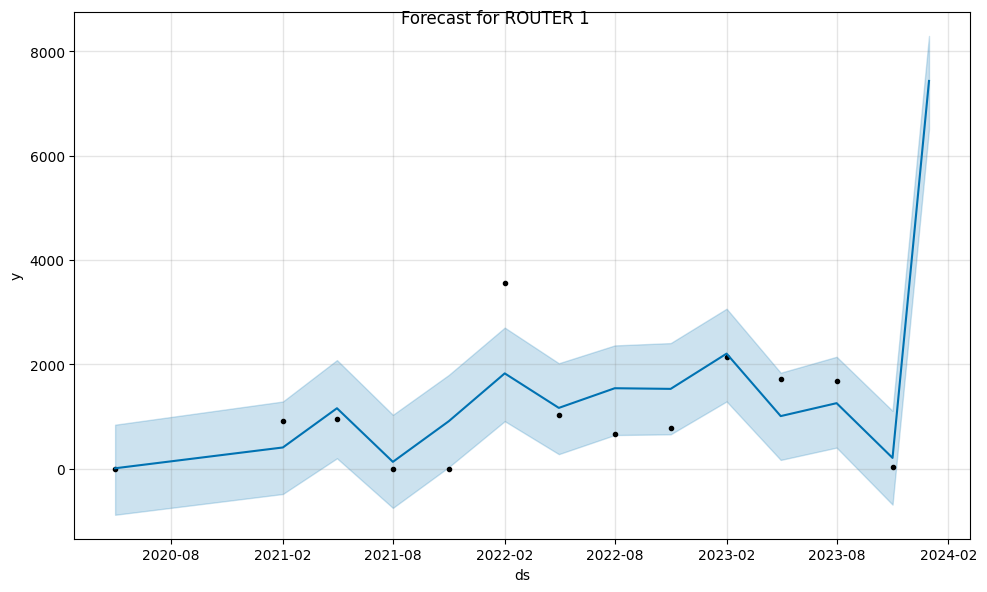

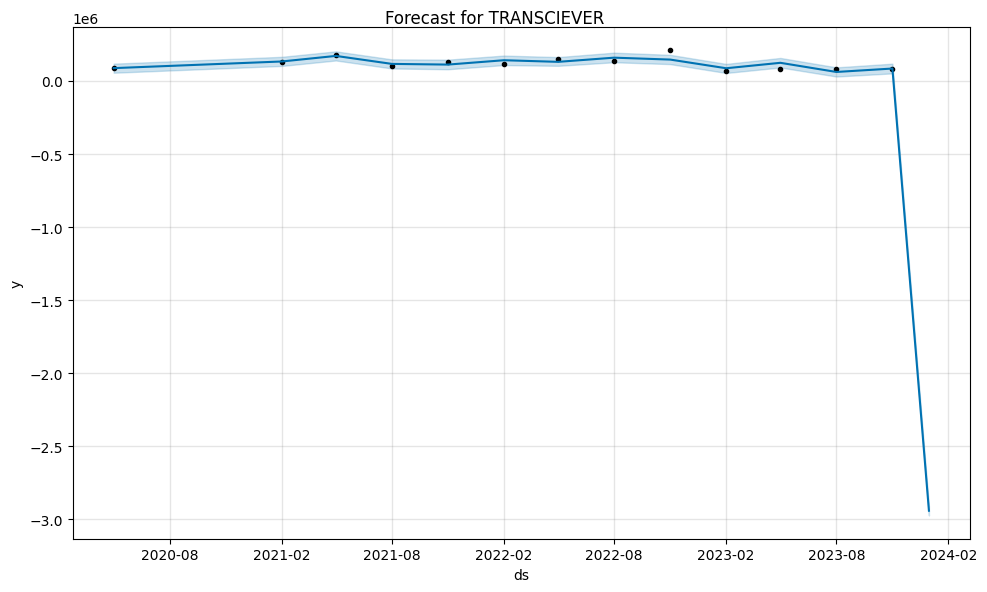

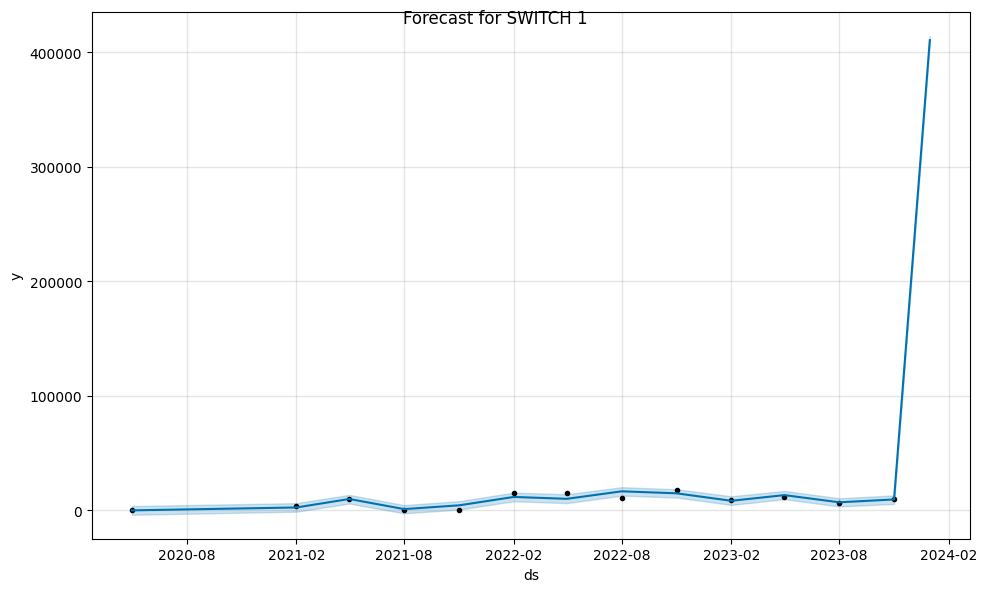

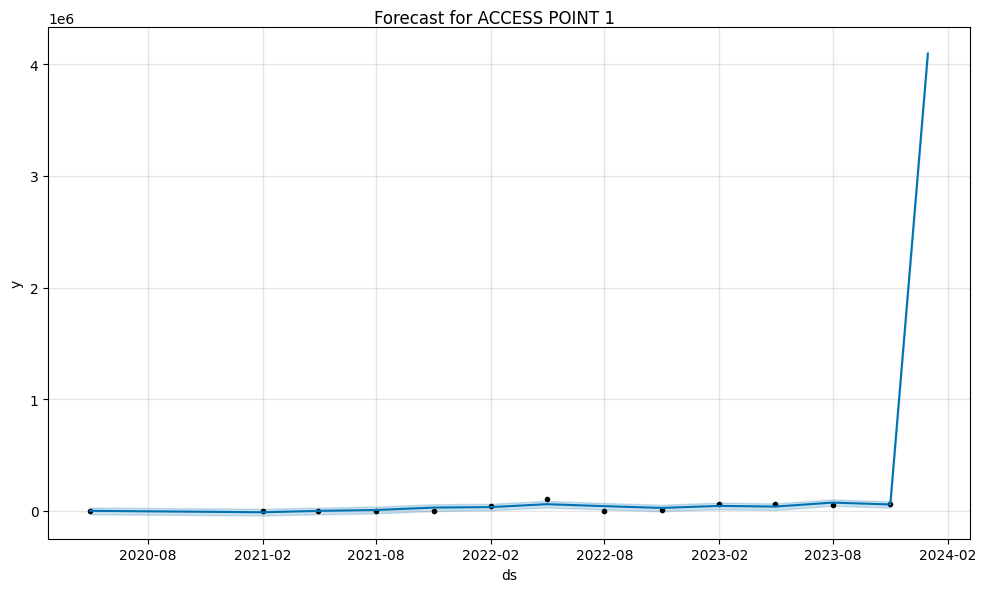

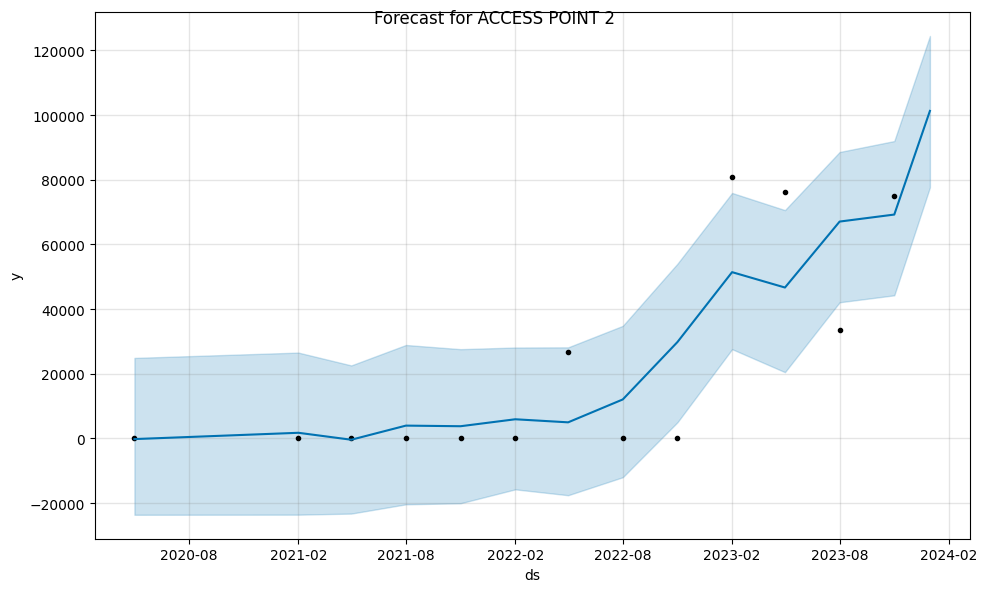

...

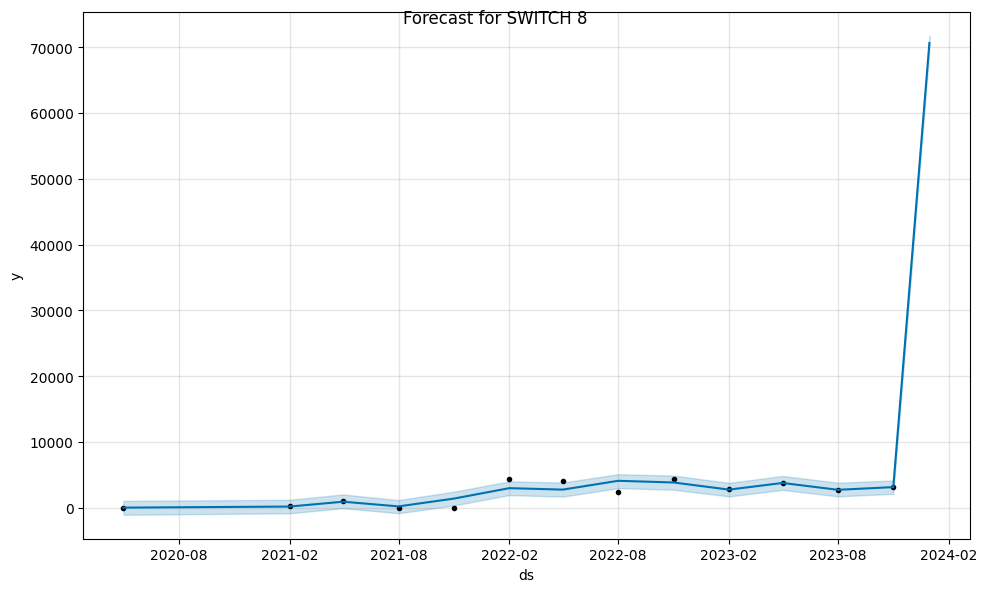

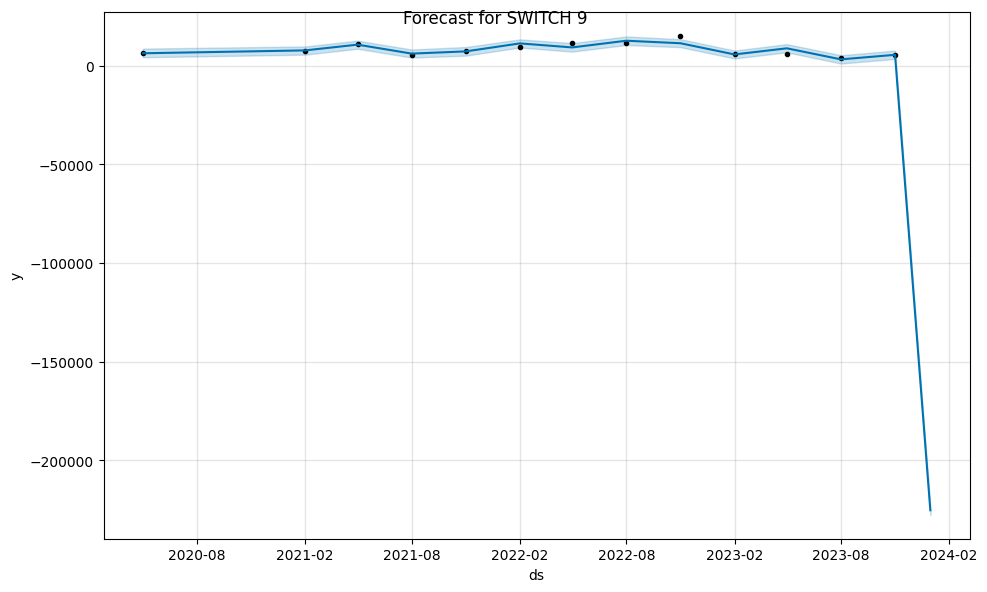

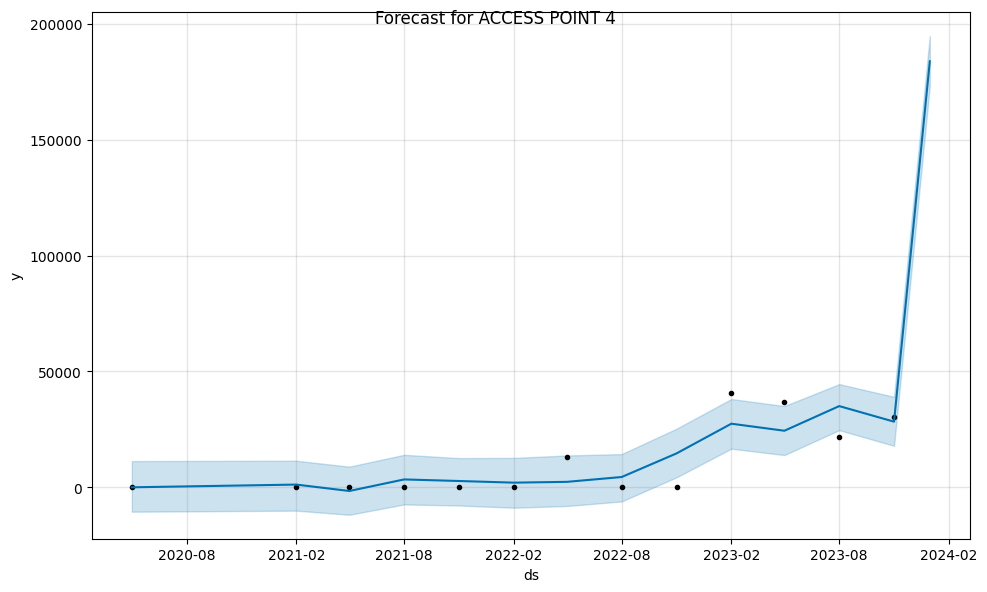

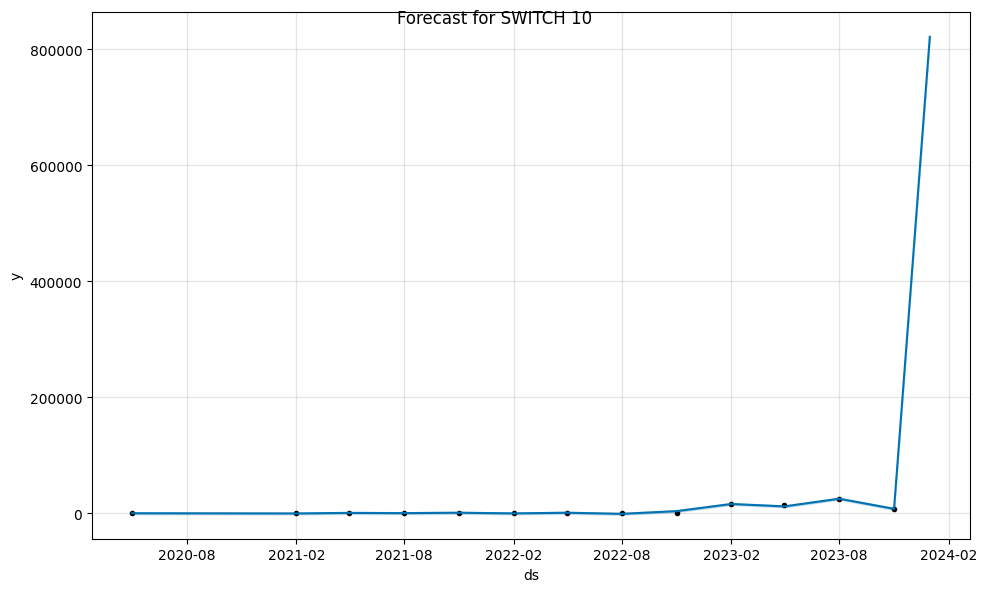

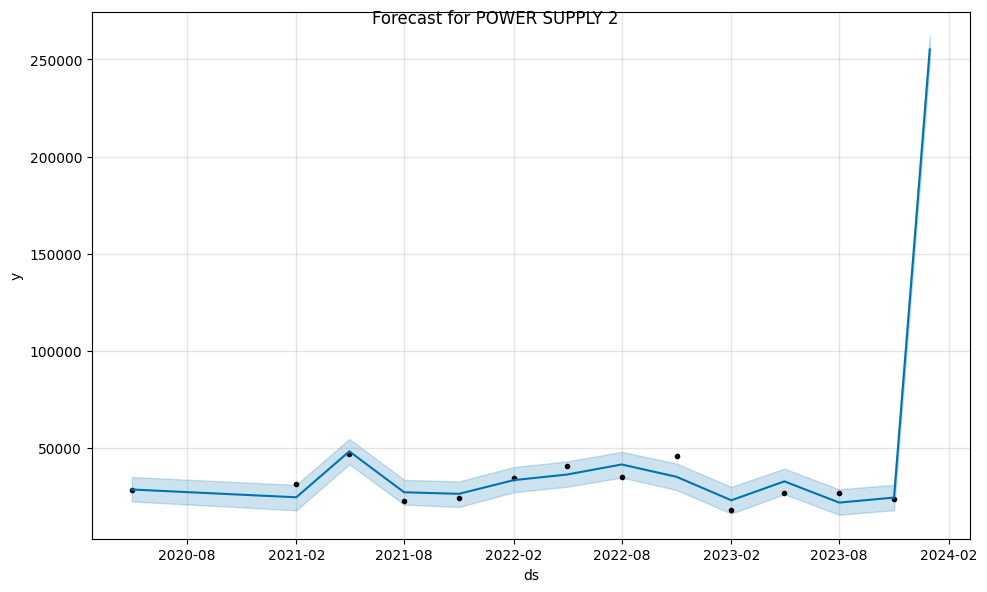

In [162]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
import numpy as np

columns = transposed.columns[1:]
overall_0_rmse = []

# Loop through each product column
for product in columns:
    print('product: ', product)
    # Prepare DataFrame for the current product
    product_df = scaled_0_df[['Date', product]].rename(columns={'Date': 'ds', product: 'y'})

    # Instantiate Prophet model with adjusted parameters
    model = Prophet(
        seasonality_mode='multiplicative',     # Adjust seasonality mode if needed
        changepoint_prior_scale=0.05,           # Adjust changepoint prior scale if needed
        holidays_prior_scale=10,                # Adjust holidays prior scale if needed
        yearly_seasonality=False,               # Disable yearly seasonality
        weekly_seasonality=False,               # Disable weekly seasonality
        daily_seasonality=False                # Disable daily seasonality
    )

    # Add customized seasonality with reduced Fourier order
    model.add_seasonality(name='quarterly', period=90, fourier_order=5)  # Adjust period and Fourier order as needed

    # Add relevant lag and rolling window features as regressors to the Prophet model for the current product
    for feature in columns:
        if product in feature:
            if product != feature:
                if product == 'SWITCH 1' and feature == 'SWITCH 10':
                    continue
                else:
                    print(feature)
                    product_df[feature] = scaled_0_df[feature]
                    model.add_regressor(feature)

    # Fit Prophet model
    model.fit(product_df)

    # Handle outliers and anomalies
    # You can identify and handle outliers here before performing cross-validation
    # For example, you can remove outliers or replace them with more reasonable values

    # Perform cross-validation
    initial_period = 2 * 365  # Set initial period to cover at least 3 years of data
    cv_period = 365            # 1 year
    cv_horizon = 365           # 1 year
    df_cv = cross_validation(model, initial=f'{initial_period} days', period=f'{cv_period} days', horizon=f'{cv_horizon} days')

    # Compute performance metrics
    df_metrics = performance_metrics(df_cv)

    # Print the performance metrics
    #print(df_metrics)

    # Append RMSE to overall list
    overall_0_rmse.append(df_metrics['rmse'].values[0])

    # Make future predictions
    future = model.make_future_dataframe(periods=1, freq='Q')  # Adjust periods as needed
    forecast = model.predict(future)

    # Visualize forecast
    fig = model.plot(forecast)
    fig.suptitle(f'Forecast for {product}')
    # plt.show()
    print('FORECAST:', forecast )

# Calculate overall RMSE
overall_rmse_z = np.mean(overall_0_rmse)
print("Overall RMSE:", overall_rmse_z)


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ocz6u7n2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/vd7fsl2e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None


product:  ROUTER 1


DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23040', 'data', 'file=/tmp/tmpm_95a39v/ocz6u7n2.json', 'init=/tmp/tmpm_95a39v/vd7fsl2e.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelmrgtna_o/prophet_model-20240221172643.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hcnbyuw1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bwm51siz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21908', 'data', 'file=/tmp/tmpm_95a39v/hcnbyuw1.json', 'init=/tmp/tmpm_95a39v/bwm51siz.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelhmymtnp0/prophet_model-20240221172644.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bnq_1aqp.json
DEBUG:cmdstanpy:input tempfile

product:  TRANSCIEVER


17:26:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4b0szic7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/g6ieidhx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70767', 'data', 'file=/tmp/tmpm_95a39v/4b0szic7.json', 'init=/tmp/tmpm_95a39v/g6ieidhx.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeltvcqhn8y/prophet_model-20240221172646.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/lmntgkyt.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 1


17:26:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hqlgiwir.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/3jq_mm76.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71843', 'data', 'file=/tmp/tmpm_95a39v/hqlgiwir.json', 'init=/tmp/tmpm_95a39v/3jq_mm76.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelhd9x5v7q/prophet_model-20240221172647.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/xb8fetr5.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 1


17:26:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/bmwwdwa6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/79y_45fl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69918', 'data', 'file=/tmp/tmpm_95a39v/bmwwdwa6.json', 'init=/tmp/tmpm_95a39v/79y_45fl.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model60jkcpj6/prophet_model-20240221172648.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/dglzf0sk.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 2


17:26:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/vneoguvo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/mfgt4yrw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14131', 'data', 'file=/tmp/tmpm_95a39v/vneoguvo.json', 'init=/tmp/tmpm_95a39v/mfgt4yrw.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeltvjymy7y/prophet_model-20240221172650.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8os_fcem.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 2


17:26:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/fgop0blo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ssvfs9k4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54229', 'data', 'file=/tmp/tmpm_95a39v/fgop0blo.json', 'init=/tmp/tmpm_95a39v/ssvfs9k4.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model1krurh71/prophet_model-20240221172651.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/94m1th38.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 3


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8zrzkd_y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/6qko5n69.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7297', 'data', 'file=/tmp/tmpm_95a39v/8zrzkd_y.json', 'init=/tmp/tmpm_95a39v/6qko5n69.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeln9zzr2po/prophet_model-20240221172651.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/dqznb6__.json
DEBUG:cmdstanpy:input tempfile:

product:  POWER SUPPLY 1


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ivhtjqoe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4m7a01zz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32948', 'data', 'file=/tmp/tmpm_95a39v/ivhtjqoe.json', 'init=/tmp/tmpm_95a39v/4m7a01zz.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeley5n4_k4/prophet_model-20240221172652.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/r_kbyxyq.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 4


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/wvalp5m5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/eeh093h0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32652', 'data', 'file=/tmp/tmpm_95a39v/wvalp5m5.json', 'init=/tmp/tmpm_95a39v/eeh093h0.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model_ftc9_4j/prophet_model-20240221172653.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/_dy631a6.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 5


17:26:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/x9c316up.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/nib57z1g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56784', 'data', 'file=/tmp/tmpm_95a39v/x9c316up.json', 'init=/tmp/tmpm_95a39v/nib57z1g.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelp3vw1uz9/prophet_model-20240221172654.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/oo4dzobx.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 6


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/_z89zq05.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/uwrc_9fi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79656', 'data', 'file=/tmp/tmpm_95a39v/_z89zq05.json', 'init=/tmp/tmpm_95a39v/uwrc_9fi.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelqzgt5pfh/prophet_model-20240221172654.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8gzyr8bk.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 3


17:26:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/we_ljlrc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ijqmhqul.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29800', 'data', 'file=/tmp/tmpm_95a39v/we_ljlrc.json', 'init=/tmp/tmpm_95a39v/ijqmhqul.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelxynwe0t3/prophet_model-20240221172655.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/yxzjabmf.json
DEBUG:cmdstanpy:input tempfile

product:  SUPERVISOR ENGINE


17:26:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/a3gfcaui.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/uwix5fon.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40781', 'data', 'file=/tmp/tmpm_95a39v/a3gfcaui.json', 'init=/tmp/tmpm_95a39v/uwix5fon.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelvap3jj4e/prophet_model-20240221172656.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/jw1b380j.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 7


17:26:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/uuscezbp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/yrsh13dv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16533', 'data', 'file=/tmp/tmpm_95a39v/uuscezbp.json', 'init=/tmp/tmpm_95a39v/yrsh13dv.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modell_r_9bgt/prophet_model-20240221172657.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1vet3cdq.json
DEBUG:cmdstanpy:input tempfile

product:  WIRELESS CONTROLLER


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4a7zpp18.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/owxl9paa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47964', 'data', 'file=/tmp/tmpm_95a39v/4a7zpp18.json', 'init=/tmp/tmpm_95a39v/owxl9paa.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelz6c1qkfk/prophet_model-20240221172658.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/41l4dbms.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 8


17:26:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hyqm7gpn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/z9wwnpaq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22788', 'data', 'file=/tmp/tmpm_95a39v/hyqm7gpn.json', 'init=/tmp/tmpm_95a39v/z9wwnpaq.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeltosqxtkc/prophet_model-20240221172659.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:26:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/crcngc5b.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 9


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/0lm71jqb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/20sz_j63.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64221', 'data', 'file=/tmp/tmpm_95a39v/0lm71jqb.json', 'init=/tmp/tmpm_95a39v/20sz_j63.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model64t42joo/prophet_model-20240221172700.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/thqq9mag.json
DEBUG:cmdstanpy:input tempfile

product:  ACCESS POINT 4


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8r7xnjku.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ubre4576.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34173', 'data', 'file=/tmp/tmpm_95a39v/8r7xnjku.json', 'init=/tmp/tmpm_95a39v/ubre4576.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model0fijouuv/prophet_model-20240221172701.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/dpvq_s4a.json
DEBUG:cmdstanpy:input tempfile

product:  SWITCH 10


17:27:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1vcqykut.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/7fxce847.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29354', 'data', 'file=/tmp/tmpm_95a39v/1vcqykut.json', 'init=/tmp/tmpm_95a39v/7fxce847.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelo6q0uf32/prophet_model-20240221172701.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/56jwm_fc.json
DEBUG:cmdstanpy:input tempfile

product:  POWER SUPPLY 2


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1ldqwoo9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zdf_n6ip.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90402', 'data', 'file=/tmp/tmpm_95a39v/1ldqwoo9.json', 'init=/tmp/tmpm_95a39v/zdf_n6ip.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modell9a1gskl/prophet_model-20240221172702.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Overall RMSE: 120418.43907317899


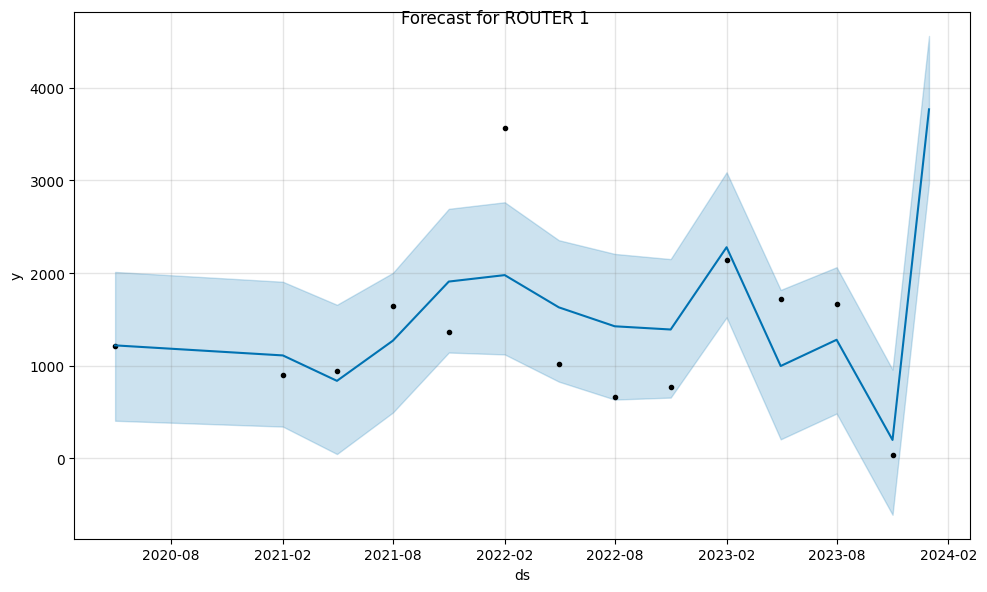

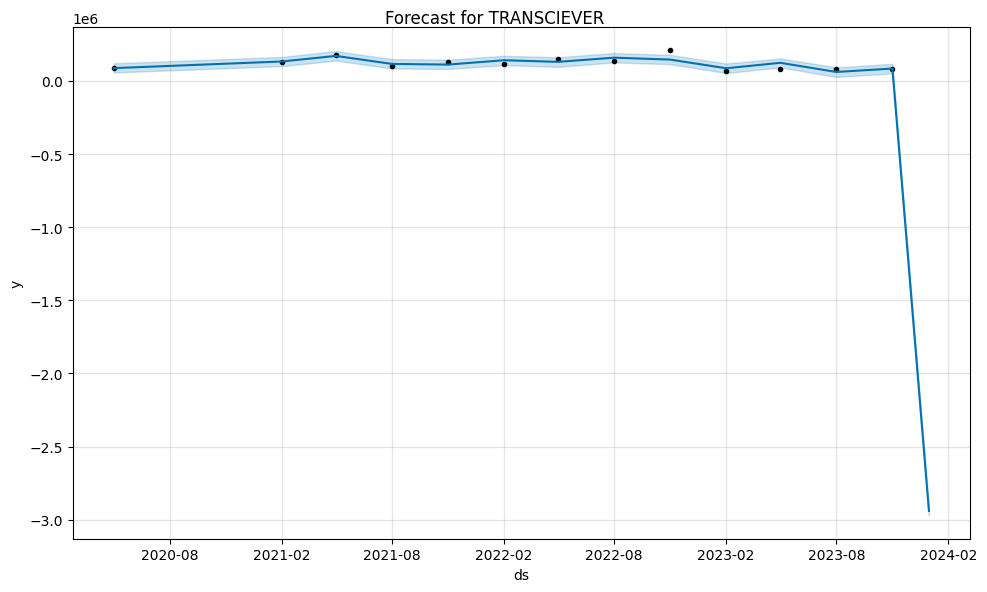

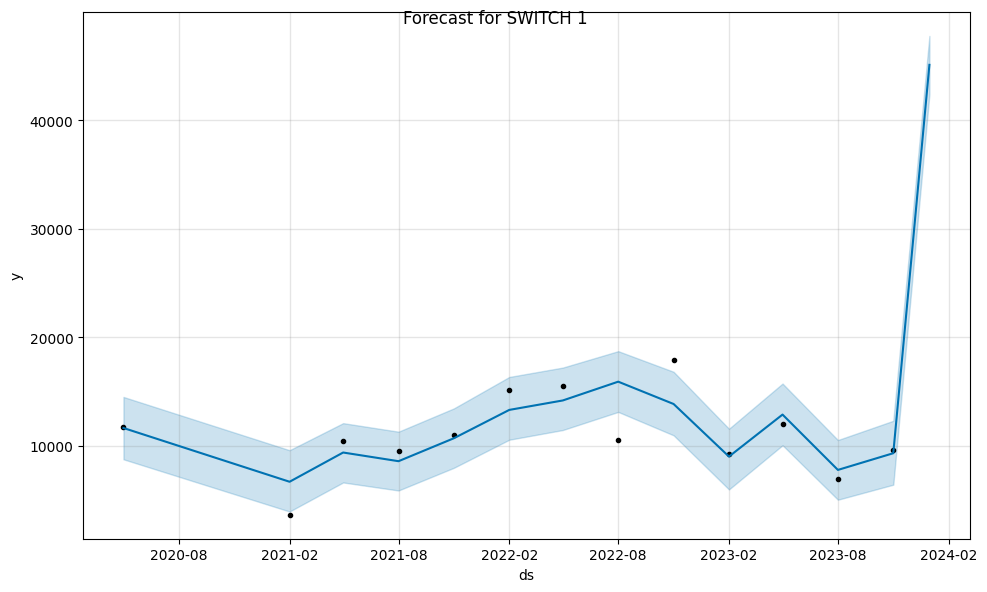

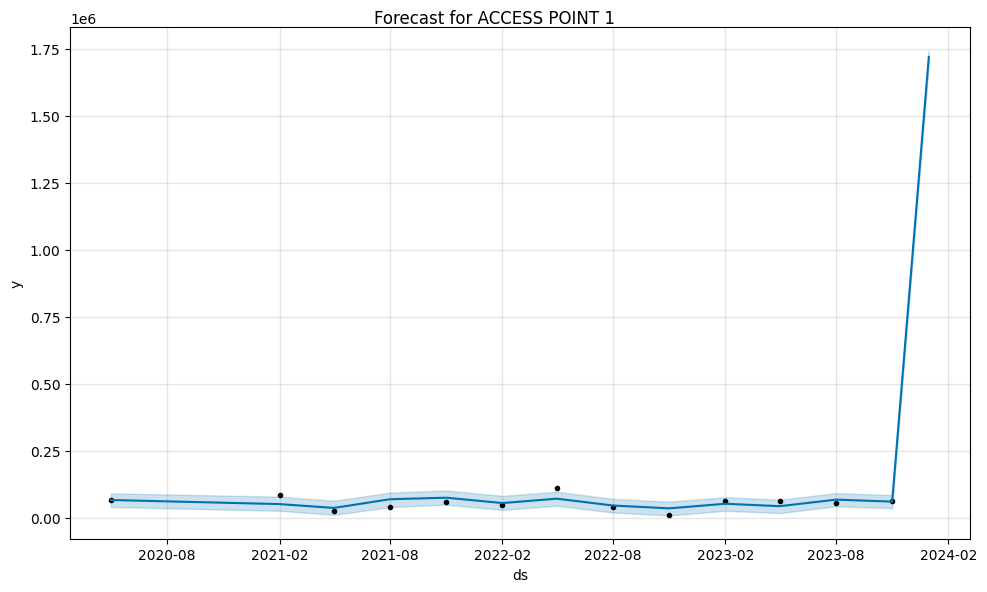

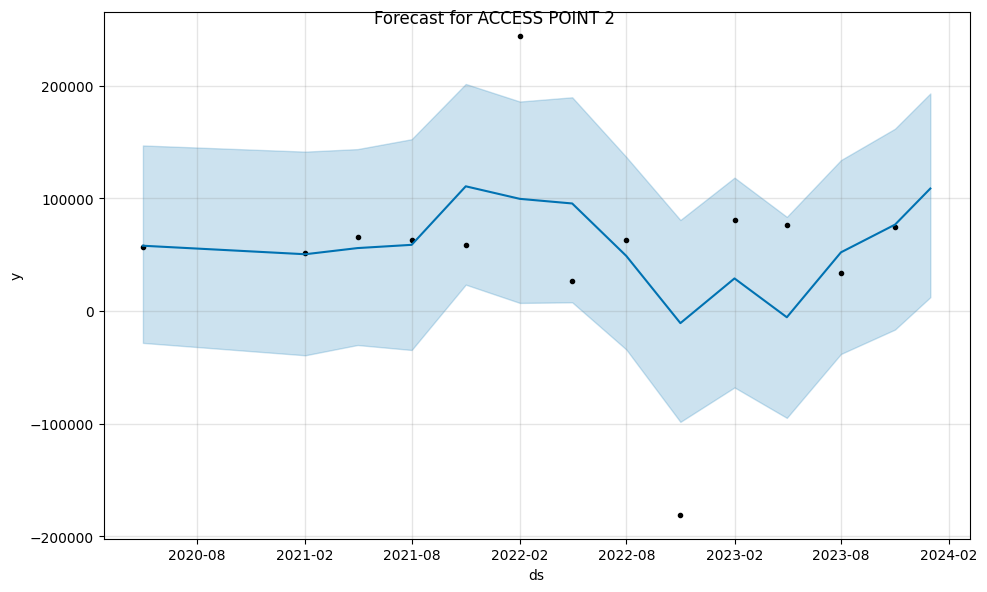

...

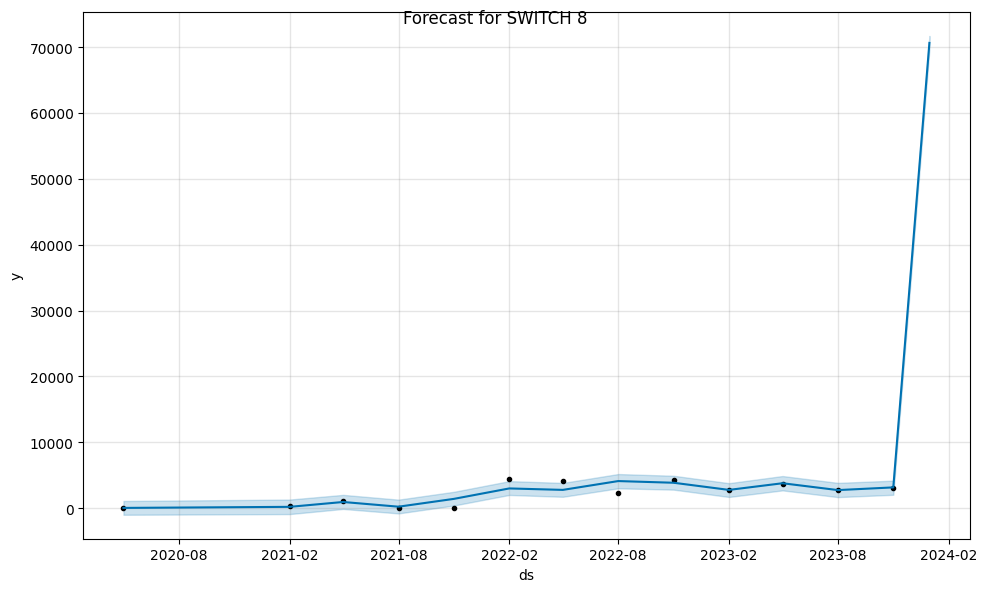

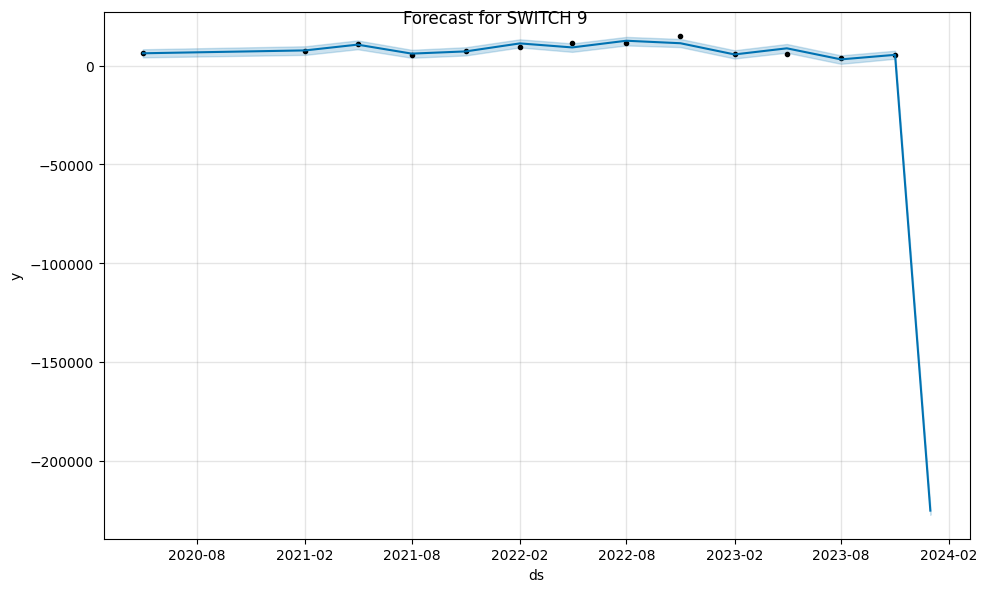

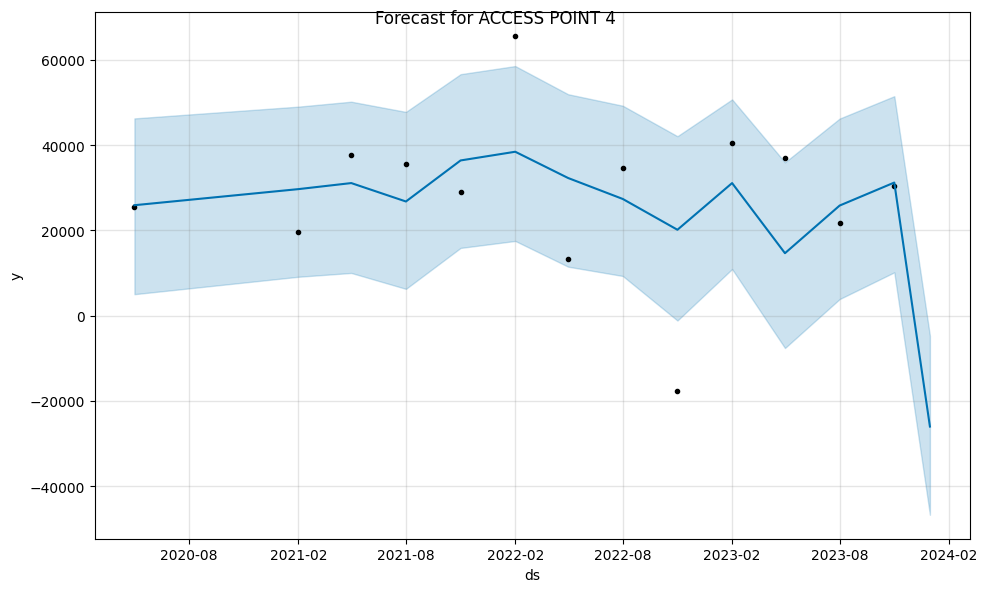

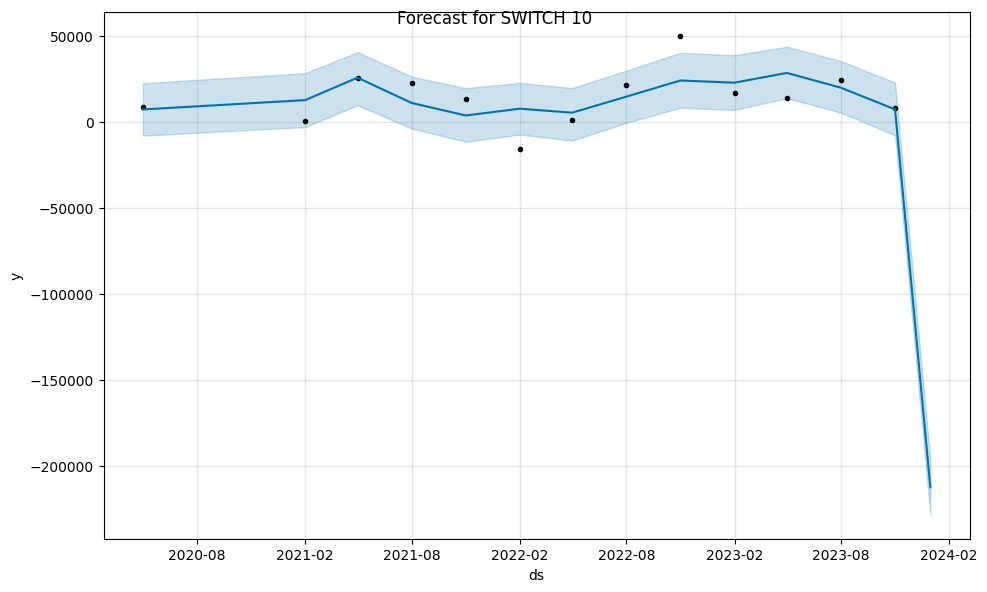

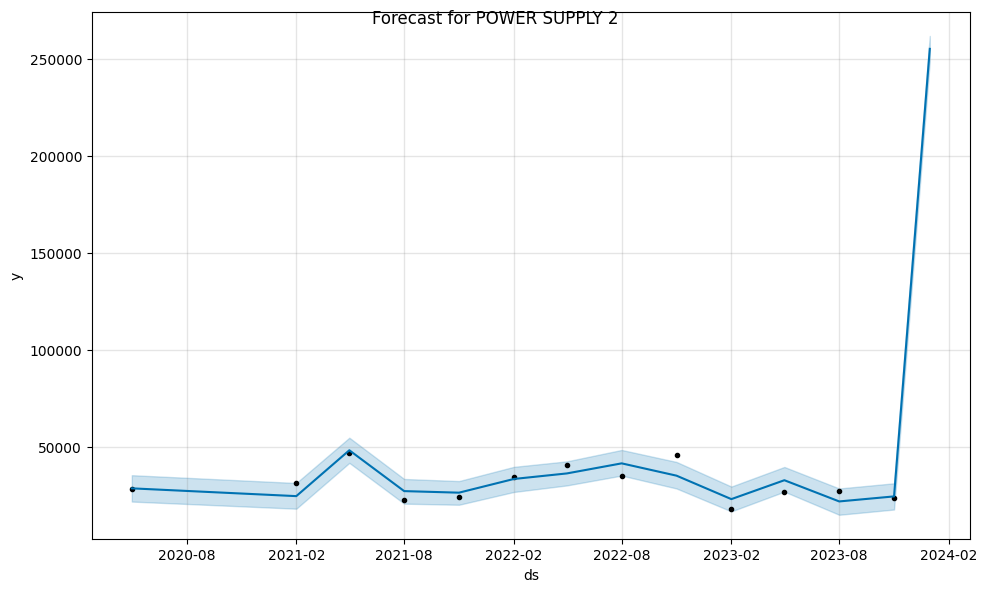

In [157]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
import numpy as np

columns = transposed.columns[1:]
overall_linear_rmse = []

# Loop through each product column
for product in columns:
    print('product: ', product)
    # Prepare DataFrame for the current product
    product_df = scaled_linear_df[['Date', product]].rename(columns={'Date': 'ds', product: 'y'})

    # Instantiate Prophet model with adjusted parameters
    model = Prophet(
        seasonality_mode='multiplicative',     # Adjust seasonality mode if needed
        changepoint_prior_scale=0.05,           # Adjust changepoint prior scale if needed
        holidays_prior_scale=10,                # Adjust holidays prior scale if needed
        yearly_seasonality=False,               # Disable yearly seasonality
        weekly_seasonality=False,               # Disable weekly seasonality
        daily_seasonality=False                # Disable daily seasonality
    )

    # Add customized seasonality with reduced Fourier order
    model.add_seasonality(name='quarterly', period=90, fourier_order=5)  # Adjust period and Fourier order as needed

    # Add relevant lag and rolling window features as regressors to the Prophet model for the current product
    for feature in columns:
        if product in feature:
            if product != feature:
                if product == 'SWITCH 1' and feature == 'SWITCH 10':
                    continue
                else:
                    print(feature)
                    product_df[feature] = scaled_linear_df[feature]
                    model.add_regressor(feature)

    # Fit Prophet model
    model.fit(product_df)

    # Handle outliers and anomalies
    # You can identify and handle outliers here before performing cross-validation
    # For example, you can remove outliers or replace them with more reasonable values

    # Perform cross-validation
    initial_period = 2 * 365  # Set initial period to cover at least 3 years of data
    cv_period = 365            # 1 year
    cv_horizon = 365           # 1 year
    df_cv = cross_validation(model, initial=f'{initial_period} days', period=f'{cv_period} days', horizon=f'{cv_horizon} days')

    # Compute performance metrics
    df_metrics = performance_metrics(df_cv)

    # Print the performance metrics
    #print(df_metrics)

    # Append RMSE to overall list
    overall_linear_rmse.append(df_metrics['rmse'].values[0])

    # Make future predictions
    future = model.make_future_dataframe(periods=1, freq='Q')  # Adjust periods as needed
    forecast = model.predict(future)

    # Visualize forecast
    fig = model.plot(forecast)
    fig.suptitle(f'Forecast for {product}')
    # plt.show()
    #print('FORECAST:', forecast )

# Calculate overall RMSE
overall_rmse_lin = np.mean(overall_linear_rmse)
print("Overall RMSE:", overall_rmse_lin)


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/t0xsrrc7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/dih_y2za.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5597', 'data', 'file=/tmp/tmpm_95a39v/t0xsrrc7.json', 'init=/tmp/tmpm_95a39v/dih_y2za.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modely94v0bwg/prophet_model-20240221172709.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


product:  ROUTER 1


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/uhspsn3o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/eis4a_c0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26995', 'data', 'file=/tmp/tmpm_95a39v/uhspsn3o.json', 'init=/tmp/tmpm_95a39v/eis4a_c0.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelue5r74b7/prophet_model-20240221172709.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse         rmse          mae       mape      mdape  \
0  92 days  1.546857e+07  3933.009821  3933.009821   1.836997   1.836997   
1 181 days  5.701696e+06  2387.822521  2387.822521   1.391505   1.391505   
2 273 days  2.088206e+07  4569.689022  4569.689022   2.736341   2.736341   
3 365 days  1.127487e+06  1061.831995  1061.831995  27.942947  27.942947   

   smape  coverage  
0    2.0       0.0  
1    2.0       0.0  
2    2.0       0.0  
3    2.0       1.0  


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qsfrqrre.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ovnbc08o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10281', 'data', 'file=/tmp/tmpm_95a39v/qsfrqrre.json', 'init=/tmp/tmpm_95a39v/ovnbc08o.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelveaysqjs/prophet_model-20240221172710.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


product:  TRANSCIEVER


17:27:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ctzblfkn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/0ru784ky.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56662', 'data', 'file=/tmp/tmpm_95a39v/ctzblfkn.json', 'init=/tmp/tmpm_95a39v/0ru784ky.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelovn6n6a9/prophet_model-20240221172710.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse          rmse           mae       mape      mdape  \
0  92 days  5.181626e+11  7.198351e+05  7.198351e+05  10.722683  10.722683   
1 181 days  1.175838e+11  3.429050e+05  3.429050e+05   4.034176   4.034176   
2 273 days  2.146700e+12  1.465162e+06  1.465162e+06  17.832382  17.832382   
3 365 days  1.600875e+13  4.001094e+06  4.001094e+06  48.552248  48.552248   

      smape  coverage  
0  1.685601       0.0  
1  1.337109       0.0  
2  1.798310       0.0  
3  1.920874       0.0  


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zkmvdvhs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/efe5s2lk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35602', 'data', 'file=/tmp/tmpm_95a39v/zkmvdvhs.json', 'init=/tmp/tmpm_95a39v/efe5s2lk.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelbumhictd/prophet_model-20240221172711.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


product:  SWITCH 1


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hhhs5pzz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/z8jcou82.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39765', 'data', 'file=/tmp/tmpm_95a39v/hhhs5pzz.json', 'init=/tmp/tmpm_95a39v/z8jcou82.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model0fw7i_b3/prophet_model-20240221172711.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.


   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  5.463237e+09   73913.712441   73913.712441   8.007119   8.007119   
1 181 days  9.352649e+08   30582.100683   30582.100683   2.548508   2.548508   
2 273 days  3.255711e+10  180435.885641  180435.885641  26.006902  26.006902   
3 365 days  2.735856e+11  523054.138505  523054.138505  54.513198  54.513198   

      smape  coverage  
0  1.600285       0.0  
1  1.120591       0.0  
2  1.857178       0.0  
3  1.929220       0.0  
product:  ACCESS POINT 1


DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/uxvxfxli.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/iz605e19.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52806', 'data', 'file=/tmp/tmpm_95a39v/uxvxfxli.json', 'init=/tmp/tmpm_95a39v/iz605e19.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelezlszxgb/prophet_model-20240221172711.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/te2d9cb3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/2v8v0m_z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67909', 'data', 'file=/tmp/tmpm_95a39v/te2d9cb3.json', 'init=/tmp/tmpm_95a39v/2v8v0m_z.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelpy4zikpu/prophet_model-20240221172712.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/43m5ivo5.json
DEBUG:cmdstanpy:input tempfile

   horizon           mse          rmse           mae       mape      mdape  \
0  92 days  1.618725e+11  4.023338e+05  4.023338e+05   6.415988   6.415988   
1 181 days  1.567371e+10  1.251947e+05  1.251947e+05   1.994467   1.994467   
2 273 days  1.424882e+12  1.193684e+06  1.193684e+06  21.721122  21.721122   
3 365 days  1.177775e+13  3.431872e+06  3.431872e+06  56.745795  56.745795   

      smape  coverage  
0  1.524714       0.0  
1  0.998615       0.0  
2  1.831374       0.0  
3  1.931910       0.0  
product:  ACCESS POINT 2


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26366', 'data', 'file=/tmp/tmpm_95a39v/43m5ivo5.json', 'init=/tmp/tmpm_95a39v/k2gwmsz7.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelh4ah26te/prophet_model-20240221172712.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/rf2z1rad.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ruw_4g48.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73260', 'data', 'file=/tmp/tmpm_95a39v/rf2z1rad.json', 'init=/tmp/tmpm_95a39v/ruw_4g48.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelb5gqbh55/prophet_model-20240221172713.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.


   horizon           mse           rmse            mae      mape     mdape  \
0  92 days  3.792012e+08   19473.088403   19473.088403  0.240575  0.240575   
1 181 days  1.350122e+09   36744.007444   36744.007444  0.482255  0.482255   
2 273 days  5.577459e+10  236166.440828  236166.440828  7.014150  7.014150   
3 365 days  4.440147e+11  666344.291932  666344.291932  8.902039  8.902039   

      smape  coverage  
0  0.214744       0.0  
1  0.635490       0.0  
2  1.556253       0.0  
3  1.633096       0.0  
product:  SWITCH 2


DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/b0wrvjyl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/5cag178z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30428', 'data', 'file=/tmp/tmpm_95a39v/b0wrvjyl.json', 'init=/tmp/tmpm_95a39v/5cag178z.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelhtn89e_g/prophet_model-20240221172713.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qnj4fyib.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/l_fyxj0e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16939', 'data', 'file=/tmp/tmpm_95a39v/qnj4fyib.json', 'init=/tmp/tmpm_95a39v/l_fyxj0e.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model4geah71d/prophet_model-20240221172714.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/c3tigavd.json
DEBUG:cmdstanpy:input tempfile

   horizon           mse         rmse          mae      mape     mdape  \
0  92 days  5.701546e+07  7550.858303  7550.858303  0.873436  0.873436   
1 181 days  4.925719e+07  7018.346473  7018.346473  0.825785  0.825785   
2 273 days  4.448180e+07  6669.467438  6669.467438  0.764321  0.764321   
3 365 days  4.671866e+06  2161.449906  2161.449906  0.212219  0.212219   

      smape  coverage  
0  0.607939       0.0  
1  0.584464       0.0  
2  0.552990       0.0  
3  0.191861       0.0  
product:  SWITCH 3


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16952', 'data', 'file=/tmp/tmpm_95a39v/c3tigavd.json', 'init=/tmp/tmpm_95a39v/y8_76qsj.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelg0vqqiru/prophet_model-20240221172714.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/16_dgb57.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/choiav3s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56460', 'data', 'file=/tmp/tmpm_95a39v/16_dgb57.json', 'init=/tmp/tmpm_95a39v/choiav3s.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelexf3tl3v/prophet_model-20240221172714.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse          rmse           mae      mape     mdape  \
0  92 days  2.928632e+08  17113.247566  17113.247566  1.616898  1.616898   
1 181 days  1.155488e+08  10749.363417  10749.363417  0.796249  0.796249   
2 273 days  1.133926e+07   3367.382156   3367.382156  0.158495  0.158495   
3 365 days  1.101384e+08  10494.684972  10494.684972  0.496226  0.496226   

      smape  coverage  
0  0.894080       0.0  
1  0.569512       0.0  
2  0.172136       1.0  
3  0.659974       0.0  
product:  POWER SUPPLY 1


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/8iogj0wh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/3dy_4oz9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28164', 'data', 'file=/tmp/tmpm_95a39v/8iogj0wh.json', 'init=/tmp/tmpm_95a39v/3dy_4oz9.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeldxzkywql/prophet_model-20240221172715.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/3r2rzkd3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hdyjpniw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32196', 'data', 'file=/tmp/tmpm_95a39v/3r2rzkd3.json', 'init=/tmp/tmpm_95a39v/hdyjpniw.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelcbciixxu/prophet_model-20240221172715.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ig6lk3lg.json


   horizon           mse          rmse           mae      mape     mdape  \
0  92 days  7.179006e+08  26793.668056  26793.668056  0.266278  0.266278   
1 181 days  1.619284e+09  40240.324366  40240.324366  0.336011  0.336011   
2 273 days  3.509820e+09  59243.732718  59243.732718  0.402241  0.402241   
3 365 days  8.852945e+08  29753.899507  29753.899507  0.217187  0.217187   

      smape  coverage  
0  0.234991       0.0  
1  0.287679       0.0  
2  0.503507       0.0  
3  0.243645       0.0  
product:  SWITCH 4


DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/th7hrn6o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62795', 'data', 'file=/tmp/tmpm_95a39v/ig6lk3lg.json', 'init=/tmp/tmpm_95a39v/th7hrn6o.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelkcpr5mpq/prophet_model-20240221172716.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/_umzpy3f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/i3dy9mex.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14113', 'data', 'file=/tmp/tmpm_95a39v/_umzpy3f.json', 'init=/tmp/tmpm_95a39v/i3dy9mex.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelb1k8a7e9/prophet_model-20240221172716.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/pvo8nrt1.json
DEBUG:cmdstanpy:input tempfile

   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  2.332332e+08   15271.974389   15271.974389   6.024447   6.024447   
1 181 days  7.163061e+06    2676.389614    2676.389614   0.399461   0.399461   
2 273 days  1.362604e+09   36913.467379   36913.467379   6.062320   6.062320   
3 365 days  1.056306e+10  102776.748646  102776.748646  12.746713  12.746713   

      smape  coverage  
0  1.501523       0.0  
1  0.332959       0.0  
2  1.503865       0.0  
3  1.728753       0.0  
product:  SWITCH 5


INFO:cmdstanpy:Chain [1] start processing
17:27:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/f7mp7sqp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ot20jyoi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13457', 'data', 'file=/tmp/tmpm_95a39v/f7mp7sqp.json', 'init=/tmp/tmpm_95a39v/ot20jyoi.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model562xn_47/prophet_model-20240221172717.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/7m70v2ez.json


   horizon           mse          rmse           mae      mape     mdape  \
0  92 days  1.603316e+06   1266.221083   1266.221083  0.287974  0.287974   
1 181 days  5.344591e+04    231.183710    231.183710  0.038531  0.038531   
2 273 days  4.698950e+06   2167.706232   2167.706232  0.469607  0.469607   
3 365 days  1.773846e+08  13318.580367  13318.580367  2.845851  2.845851   

      smape  coverage  
0  0.251728       0.0  
1  0.037802       0.0  
2  0.380309       0.0  
3  1.174552       0.0  
product:  SWITCH 6


DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ntjmctkk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24789', 'data', 'file=/tmp/tmpm_95a39v/7m70v2ez.json', 'init=/tmp/tmpm_95a39v/ntjmctkk.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelqteajc7i/prophet_model-20240221172717.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/dmhtkmq3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/tar4jkfm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43656', 'data', 'file=/tmp/tmpm_95a39v/dmhtkmq3.json', 'init=/tmp/tmpm_95a39v/tar4jkfm.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelsx5mx7i_/prophet_model-20240221172717.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/754mu72p.json


   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  1.635987e+08   12790.570451   12790.570451   1.921660   1.921660   
1 181 days  3.246500e+06    1801.804729    1801.804729   0.306065   0.306065   
2 273 days  2.295967e+09   47916.245402   47916.245402  10.057986  10.057986   
3 365 days  2.056105e+10  143391.238018  143391.238018  28.592470  28.592470   

      smape  coverage  
0  0.980024       0.0  
1  0.265444       0.0  
2  1.668270       0.0  
3  1.869249       0.0  
product:  ACCESS POINT 3


DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/oh0yxn33.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41935', 'data', 'file=/tmp/tmpm_95a39v/754mu72p.json', 'init=/tmp/tmpm_95a39v/oh0yxn33.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeldtbcoj0c/prophet_model-20240221172718.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/sj_eh7kp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/qt5udp30.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45113', 'data', 'file=/tmp/tmpm_95a39v/sj_eh7kp.json', 'init=/tmp/tmpm_95a39v/qt5udp30.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelp2t107jz/prophet_model-20240221172718.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/4256_5mu.json
DEBUG:cmdstanpy:input tempfile

   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  2.035855e+10  142683.399922  142683.399922   2.670424   2.670424   
1 181 days  4.275868e+08   20678.172027   20678.172027   0.395338   0.395338   
2 273 days  5.203385e+10  228109.283158  228109.283158   3.000648   3.000648   
3 365 days  3.479901e+11  589906.897397  589906.897397  11.435407  11.435407   

      smape  coverage  
0  1.143547       0.0  
1  0.492737       0.0  
2  2.000000       0.0  
3  2.000000       0.0  
product:  SUPERVISOR ENGINE


DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92939', 'data', 'file=/tmp/tmpm_95a39v/4256_5mu.json', 'init=/tmp/tmpm_95a39v/3t61yv5j.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model56e_gakk/prophet_model-20240221172719.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/hu89_f15.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/cwx1_6nh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92428', 'data', 'file=/tmp/tmpm_95a39v/hu89_f15.json', 'init=/tmp/tmpm_95a39v/cwx1_6nh.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelt3qh7hv6/prophet_model-20240221172719.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.


   horizon           mse          rmse           mae       mape      mdape  \
0  92 days  3.026397e+07   5501.269682   5501.269682   2.624652   2.624652   
1 181 days  2.785047e+04    166.884587    166.884587   0.052862   0.052862   
2 273 days  3.247994e+08  18022.191112  18022.191112   7.425707   7.425707   
3 365 days  2.876155e+09  53629.793541  53629.793541  18.877083  18.877083   

      smape  coverage  
0  1.135070       0.0  
1  0.054297       1.0  
2  1.575629       0.0  
3  1.808402       0.0  
product:  SWITCH 7


DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zjdim0rf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/n_n3l1lg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19879', 'data', 'file=/tmp/tmpm_95a39v/zjdim0rf.json', 'init=/tmp/tmpm_95a39v/n_n3l1lg.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelas7t_c6w/prophet_model-20240221172719.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/6j53xfyw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/0bmoo787.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13230', 'data', 'file=/tmp/tmpm_95a39v/6j53xfyw.json', 'init=/tmp/tmpm_95a39v/0bmoo787.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelugvnbme8/prophet_model-20240221172719.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  7.629892e+09   87349.252489   87349.252489  13.149067  13.149067   
1 181 days  6.513961e+08   25522.461876   25522.461876   4.111221   4.111221   
2 273 days  4.171877e+10  204251.740325  204251.740325  22.864854  22.864854   
3 365 days  3.011567e+11  548777.488728  548777.488728  92.871465  92.871465   

   smape  coverage  
0    2.0       0.0  
1    2.0       0.0  
2    2.0       0.0  
3    2.0       0.0  
product:  WIRELESS CONTROLLER


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/rpio6d30.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/5i9pwey7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46984', 'data', 'file=/tmp/tmpm_95a39v/rpio6d30.json', 'init=/tmp/tmpm_95a39v/5i9pwey7.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelat72zntd/prophet_model-20240221172720.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/_4_u4mcd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/rjyuos6n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98070', 'data', 'file=/tmp/tmpm_95a39v/_4_u4mcd.json', 'init=/tmp/tmpm_95a39v/rjyuos6n.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelhx15c4z8/prophet_model-20240221172720.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ze6codb1.json
DEBUG:cmdstanpy:input tempfile

   horizon           mse         rmse          mae      mape     mdape  \
0  92 days  1.354059e+04   116.364037   116.364037  0.088760  0.088760   
1 181 days  1.825276e+05   427.232507   427.232507  0.297102  0.297102   
2 273 days  5.587199e+05   747.475712   747.475712  0.617749  0.617749   
3 365 days  3.538050e+06  1880.970430  1880.970430  1.133798  1.133798   

      smape  coverage  
0  0.092882       1.0  
1  0.258675       0.0  
2  0.893829       0.0  
3  2.000000       0.0  
product:  SWITCH 8


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98687', 'data', 'file=/tmp/tmpm_95a39v/ze6codb1.json', 'init=/tmp/tmpm_95a39v/3f_cyack.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelqz5srj17/prophet_model-20240221172721.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/49lxelec.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/zja547eu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5814', 'data', 'file=/tmp/tmpm_95a39v/49lxelec.json', 'init=/tmp/tmpm_95a39v/zja547eu.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelw_l7xhv5/prophet_model-20240221172721.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  2.377054e+08   15417.697435   15417.697435   5.490633   5.490633   
1 181 days  3.505312e+07    5920.567708    5920.567708   1.600153   1.600153   
2 273 days  1.410601e+09   37557.966843   37557.966843  13.627709  13.627709   
3 365 days  1.179644e+10  108611.415150  108611.415150  34.744535  34.744535   

      smape  coverage  
0  1.466000       0.0  
1  0.888936       0.0  
2  1.744044       0.0  
3  1.891140       0.0  


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/k5ahlhpf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/w0uimjrg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30104', 'data', 'file=/tmp/tmpm_95a39v/k5ahlhpf.json', 'init=/tmp/tmpm_95a39v/w0uimjrg.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model5agy2lzl/prophet_model-20240221172722.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


product:  SWITCH 9


17:27:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/s_vb431q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/tzu0xaai.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81553', 'data', 'file=/tmp/tmpm_95a39v/s_vb431q.json', 'init=/tmp/tmpm_95a39v/tzu0xaai.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelpog0j3za/prophet_model-20240221172722.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  2.219769e+09   47114.419767   47114.419767   8.420808   8.420808   
1 181 days  5.455686e+08   23357.409643   23357.409643   4.097791   4.097791   
2 273 days  1.119412e+10  105802.274603  105802.274603  27.930907  27.930907   
3 365 days  9.479101e+10  307881.494865  307881.494865  57.677313  57.677313   

      smape  coverage  
0  1.616153       0.0  
1  1.344025       0.0  
2  1.866359       0.0  
3  1.932973       0.0  


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/cqs4b1d_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/jse3y8ep.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36946', 'data', 'file=/tmp/tmpm_95a39v/cqs4b1d_.json', 'init=/tmp/tmpm_95a39v/jse3y8ep.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelu9ey7zib/prophet_model-20240221172723.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


product:  ACCESS POINT 4


17:27:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/o7_gp8ld.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/khezfmdi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45539', 'data', 'file=/tmp/tmpm_95a39v/o7_gp8ld.json', 'init=/tmp/tmpm_95a39v/khezfmdi.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model0oa8hbph/prophet_model-20240221172723.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse           rmse            mae       mape      mdape  \
0  92 days  8.531479e+07    9236.600358    9236.600358   0.228036   0.228036   
1 181 days  3.024651e+08   17391.523448   17391.523448   0.470907   0.470907   
2 273 days  1.254325e+10  111996.643655  111996.643655   5.168996   5.168996   
3 365 days  1.133367e+11  336655.201567  336655.201567  11.038599  11.038599   

      smape  coverage  
0  0.204697       0.0  
1  0.615929       0.0  
2  1.442042       0.0  
3  1.693219       0.0  


INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/wld08yba.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/b_x7bb_7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48619', 'data', 'file=/tmp/tmpm_95a39v/wld08yba.json', 'init=/tmp/tmpm_95a39v/b_x7bb_7.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_model7b5h3oy8/prophet_model-20240221172724.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


product:  SWITCH 10


17:27:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/ed8i96zl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/haimhy1a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25963', 'data', 'file=/tmp/tmpm_95a39v/ed8i96zl.json', 'init=/tmp/tmpm_95a39v/haimhy1a.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modelppfk36_8/prophet_model-20240221172724.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/1drhlpjv.json
DEBUG:cmdstanpy:input tempfile

   horizon           mse          rmse           mae      mape     mdape  \
0  92 days  1.480899e+08  12169.219581  12169.219581  0.725568  0.725568   
1 181 days  1.484458e+08  12183.835064  12183.835064  0.870772  0.870772   
2 273 days  1.396559e+08  11817.611780  11817.611780  0.488614  0.488614   
3 365 days  6.913727e+08  26293.967196  26293.967196  3.423694  3.423694   

      smape  coverage  
0  1.138652       0.0  
1  1.542242       0.0  
2  0.646577       0.0  
3  1.262495       0.0  
product:  POWER SUPPLY 2


DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19803', 'data', 'file=/tmp/tmpm_95a39v/1drhlpjv.json', 'init=/tmp/tmpm_95a39v/a82fuja7.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modellrjizxle/prophet_model-20240221172725.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 1 forecasts with cutoffs between 2022-11-01 00:00:00 and 2022-11-01 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

INFO:prophet:n_changepoints greater than number of observations. Using 6.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/419khxvi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpm_95a39v/fdza6erh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96603', 'data', 'file=/tmp/tmpm_95a39v/419khxvi.json', 'init=/tmp/tmpm_95a39v/fdza6erh.json', 'output', 'file=/tmp/tmpm_95a39v/prophet_modeljc030w5s/prophet_model-20240221172725.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:27:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:27:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


   horizon           mse          rmse           mae       mape      mdape  \
0  92 days  3.251623e+10  1.803226e+05  1.803226e+05  10.131050  10.131050   
1 181 days  5.161457e+09  7.184328e+04  7.184328e+04   2.711067   2.711067   
2 273 days  1.607627e+11  4.009522e+05  4.009522e+05  14.891448  14.891448   
3 365 days  1.591985e+12  1.261739e+06  1.261739e+06  53.384345  53.384345   

      smape  coverage  
0  1.670268       0.0  
1  1.150935       0.0  
2  1.763194       0.0  
3  1.927777       0.0  
Overall RMSE: 90009.30290065058


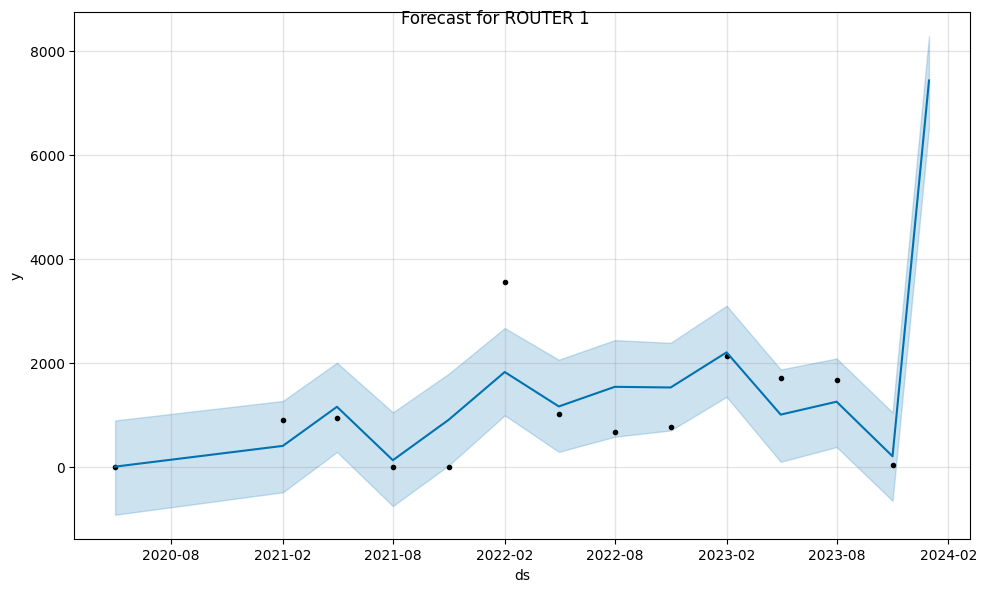

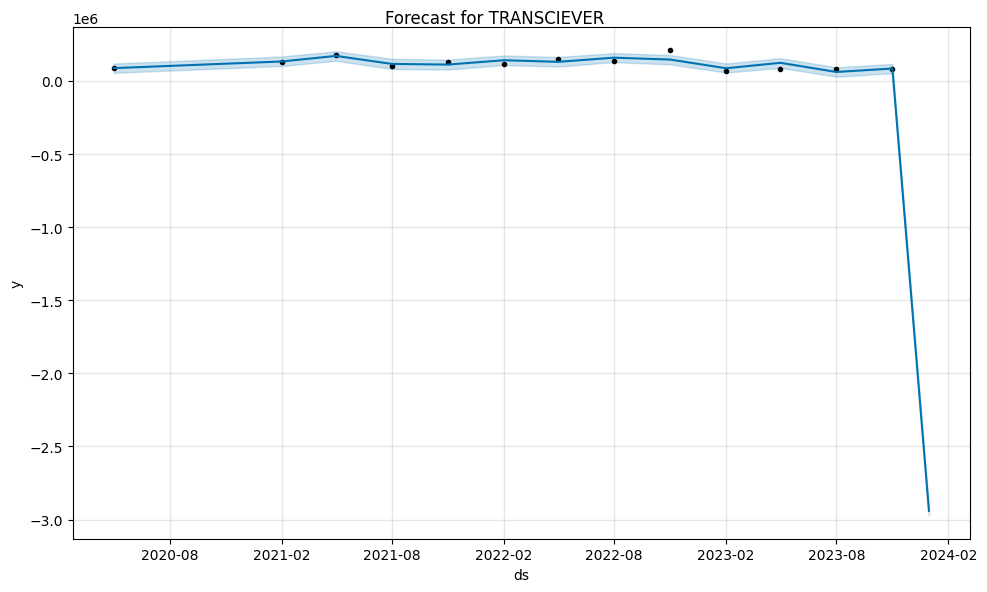

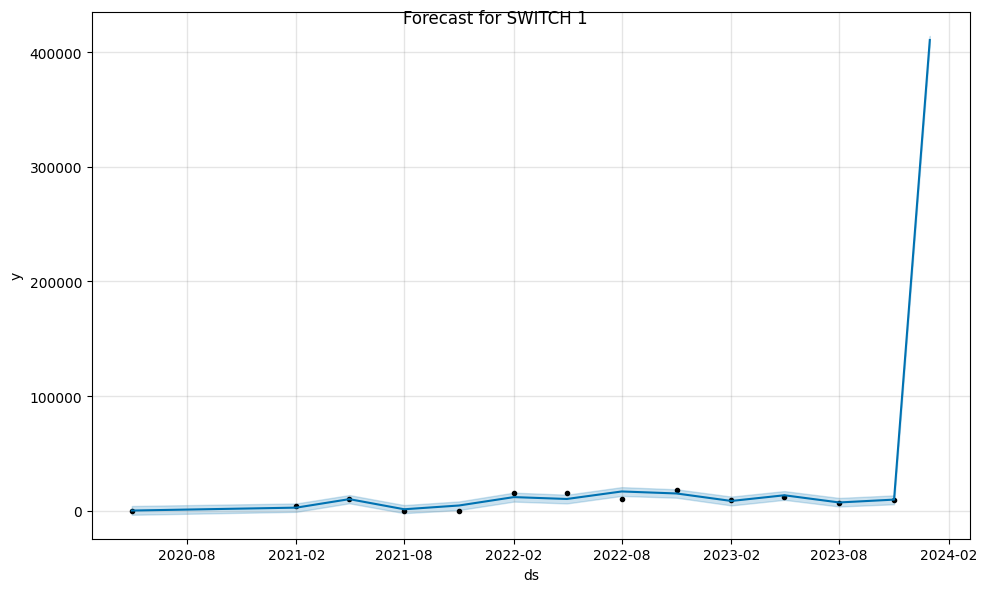

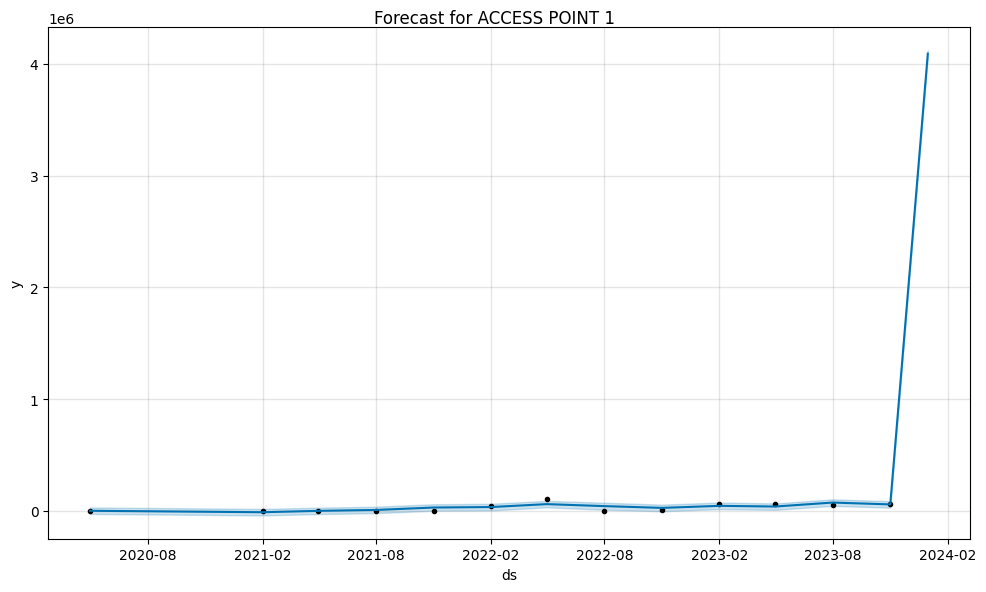

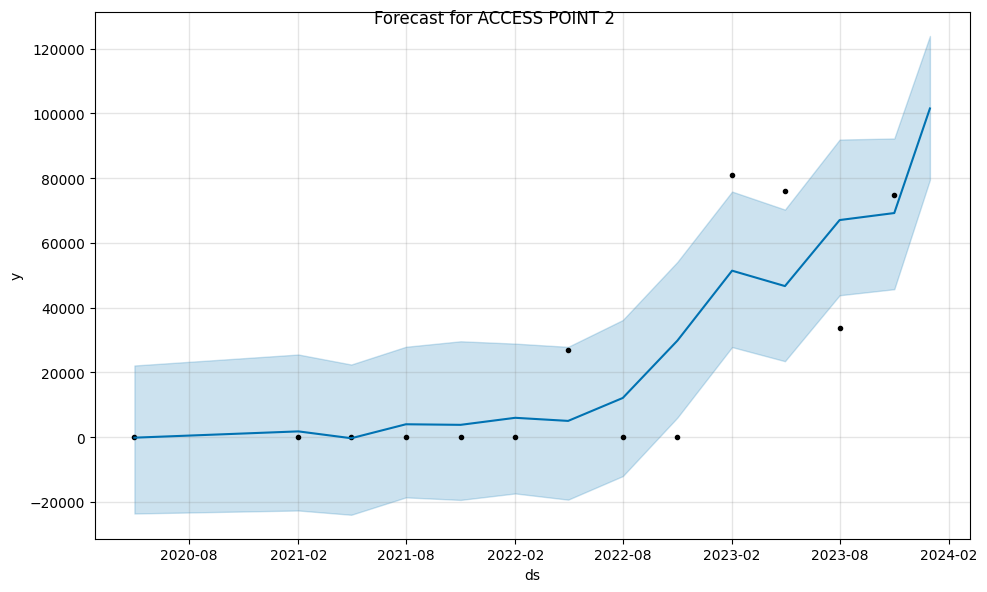

...

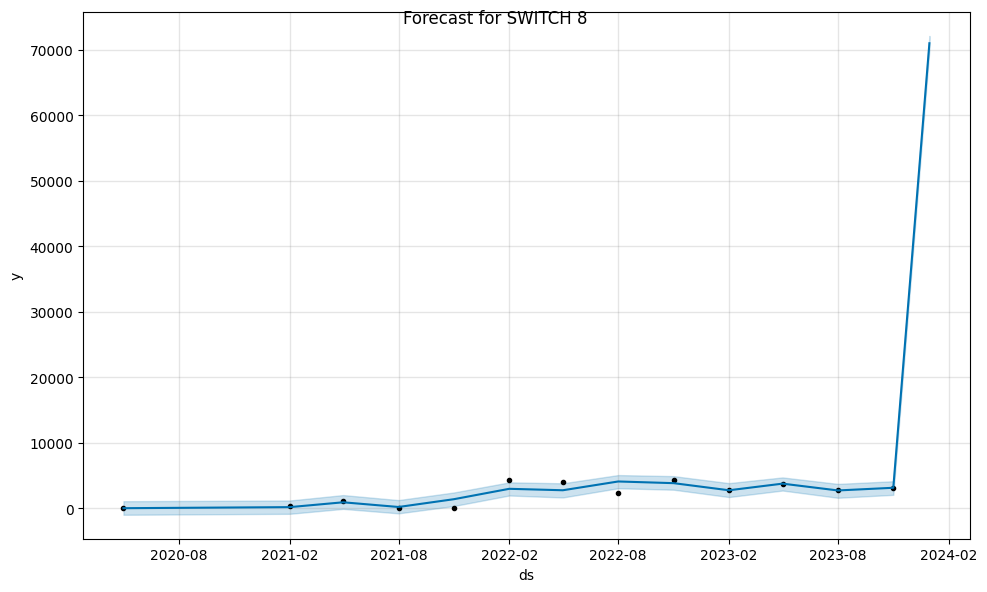

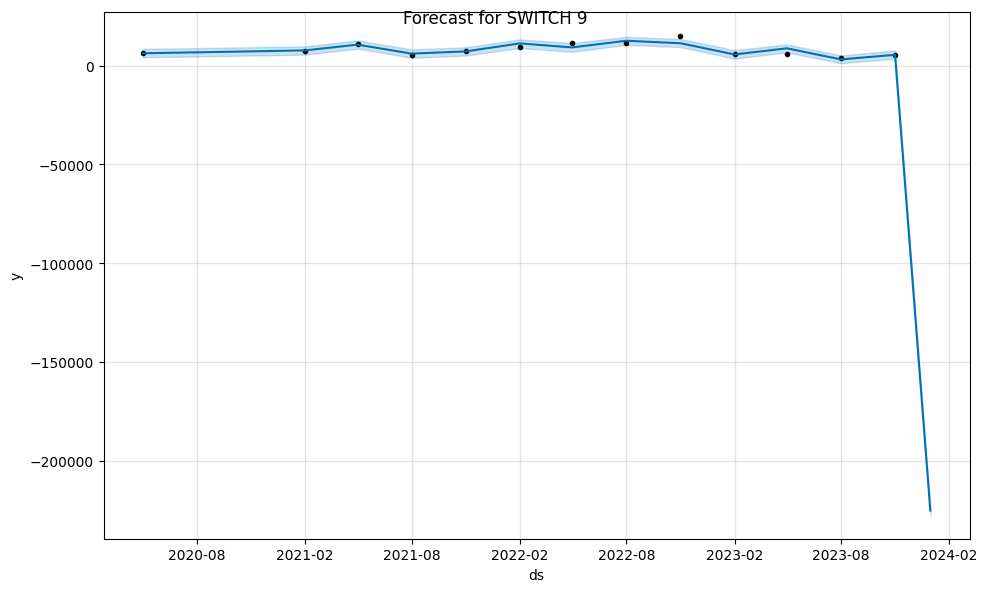

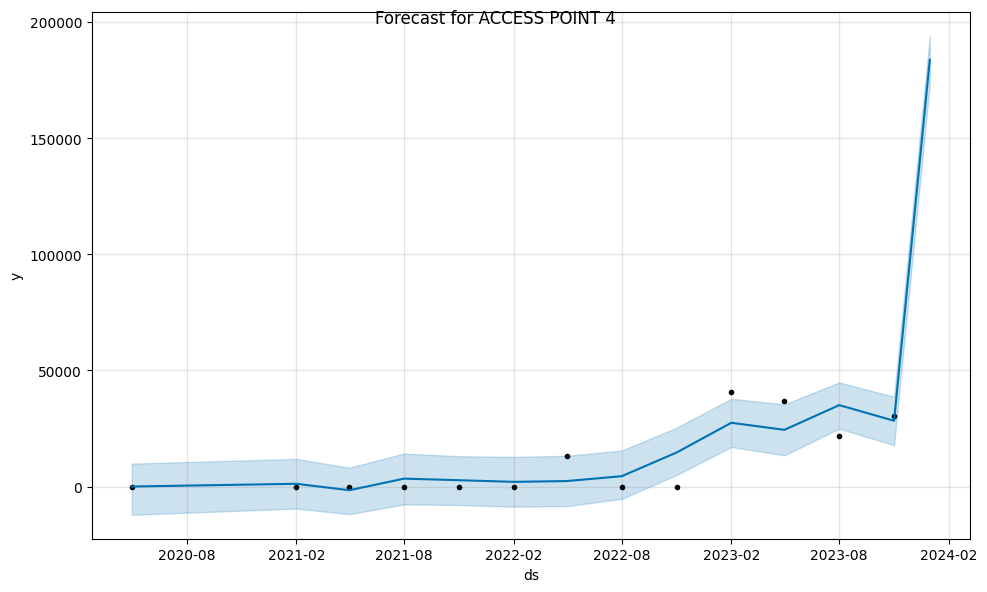

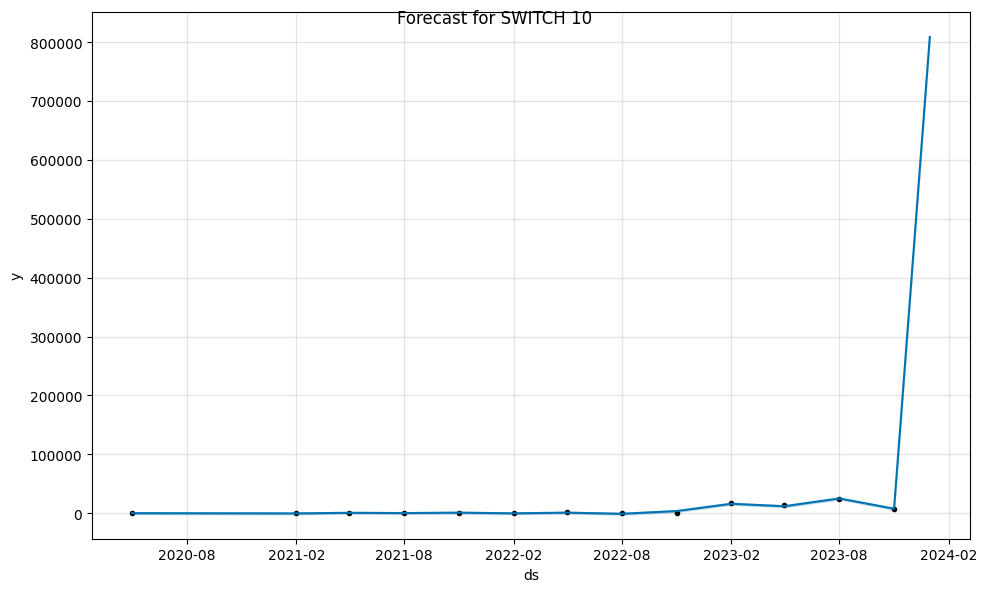

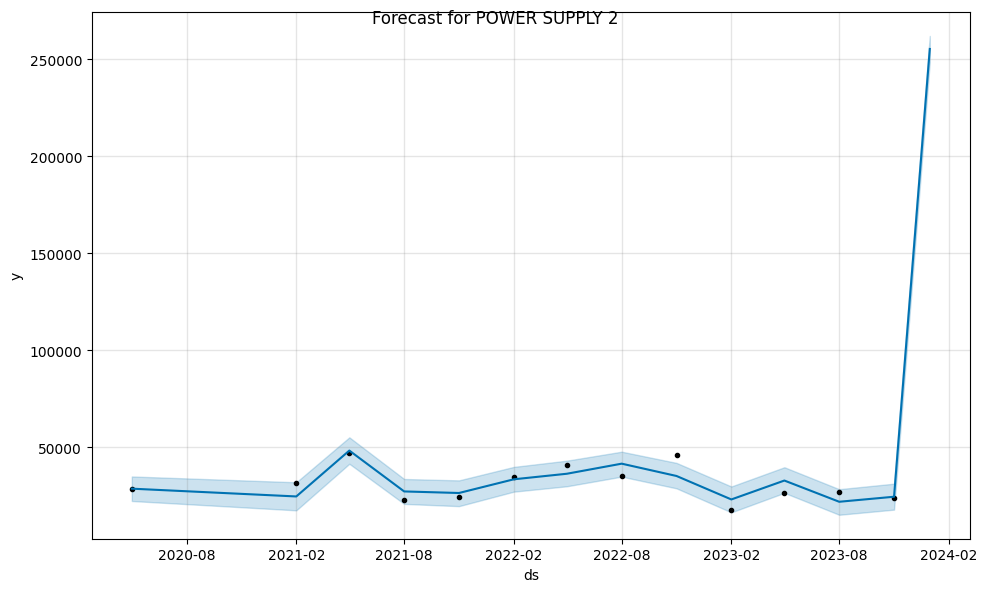

In [158]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
import numpy as np

columns = transposed.columns[1:]
overall_rmse_spline = []

# Loop through each product column
for product in columns:
    print('product: ', product)
    # Prepare DataFrame for the current product
    product_df = scaled_spline_df[['Date', product]].rename(columns={'Date': 'ds', product: 'y'})

    # Instantiate Prophet model with adjusted parameters
    model = Prophet(
        seasonality_mode='multiplicative',     # Adjust seasonality mode if needed
        changepoint_prior_scale=0.05,           # Adjust changepoint prior scale if needed
        holidays_prior_scale=10,                # Adjust holidays prior scale if needed
        yearly_seasonality=False,               # Disable yearly seasonality
        weekly_seasonality=False,               # Disable weekly seasonality
        daily_seasonality=False                # Disable daily seasonality
    )

    # Add customized seasonality with reduced Fourier order
    model.add_seasonality(name='quarterly', period=90, fourier_order=5)  # Adjust period and Fourier order as needed

    # Add relevant lag and rolling window features as regressors to the Prophet model for the current product
    for feature in columns:
        if product in feature:
            if product != feature:
                if product == 'SWITCH 1' and feature == 'SWITCH 10':
                    continue
                else:
                    print(feature)
                    product_df[feature] = scaled_spline_df[feature]
                    model.add_regressor(feature)

    # Fit Prophet model
    model.fit(product_df)

    # Handle outliers and anomalies
    # You can identify and handle outliers here before performing cross-validation
    # For example, you can remove outliers or replace them with more reasonable values

    # Perform cross-validation
    initial_period = 2 * 365  # Set initial period to cover at least 3 years of data
    cv_period = 365            # 1 year
    cv_horizon = 365           # 1 year
    df_cv = cross_validation(model, initial=f'{initial_period} days', period=f'{cv_period} days', horizon=f'{cv_horizon} days')

    # Compute performance metrics
    df_metrics = performance_metrics(df_cv)

    # Print the performance metrics
    print(df_metrics)

    # Append RMSE to overall list
    overall_rmse_spline.append(df_metrics['rmse'].values[0])

    # Make future predictions
    future = model.make_future_dataframe(periods=1, freq='Q')  # Adjust periods as needed
    forecast = model.predict(future)

    # Visualize forecast
    fig = model.plot(forecast)
    fig.suptitle(f'Forecast for {product}')
    # plt.show()
    #print('FORECAST:', forecast )

# Calculate overall RMSE
overall_rmse_sp = np.mean(overall_rmse_spline)
print("Overall RMSE:", overall_rmse_sp)


In [160]:
min(overall_rmse_sp,overall_rmse_lin,overall_rmse_z,overall_rmse_it)


89973.55291583031

In [161]:
print(overall_rmse_sp,overall_rmse_lin,overall_rmse_z,overall_rmse_it)

90009.30290065058 120418.43907317899 89973.55291583031 106751.13680641816
